# Feature interactions

In [423]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.inspection import PartialDependenceDisplay
import pandas as pd

### Model

In [425]:
import matplotlib.pyplot as plt
import numpy as np

def plot_feature_importance(feature_importance, feature_names, title):
    """ Helper function to plot feature importance """
    # Сортируем имена признаков по алфавиту
    sorted_idx = np.argsort(feature_names)
    
    # Сортируем имена признаков и важности в соответствии с алфавитным порядком
    sorted_feature_names = np.array(feature_names)[sorted_idx]
    sorted_feature_importance = feature_importance[sorted_idx]
    
    plt.figure(figsize=(15, 12))
    bars = plt.barh(sorted_feature_names, sorted_feature_importance, color='skyblue')
    
    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Features", fontsize=14)
    plt.title(title, fontsize=18)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    # Добавляем значение в конце каждого столбца
    for bar in bars:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height() / 2,
                 f'{width:.2f}',  # Форматирование числа до двух знаков после запятой
                 ha='left', va='center', fontsize=12)
    
    plt.tight_layout()
    plt.show()



def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'BayesianRidge', alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5,
                       include_interactions: bool = False, degree: int = 2):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    and return the final model, predictions, R2 scores, and feature importance.
    """

    model = None
    y_pred = None
    y_train_pred = None
    feature_importance = None
    original_feature_importance = None
    interaction_feature_importance = None

    if include_interactions:
        # Initialize the PolynomialFeatures transformer for interaction terms only
        poly = PolynomialFeatures(degree=degree, interaction_only=True, include_bias=False)

        # Generate interaction features
        X_train_interactions = pd.DataFrame(
            poly.fit_transform(X_train),
            columns=poly.get_feature_names_out(X_train.columns),
            index=X_train.index
        )
        X_test_interactions = pd.DataFrame(
            poly.transform(X_test),
            columns=poly.get_feature_names_out(X_test.columns),
            index=X_test.index
        )

        # Separate original features and interaction features
        original_feature_names = X_train.columns
        interaction_feature_names = [name for name in X_train_interactions.columns if name not in original_feature_names]
        
        X_train_combined = pd.concat([X_train, X_train_interactions[interaction_feature_names]], axis=1)
        X_test_combined = pd.concat([X_test, X_test_interactions[interaction_feature_names]], axis=1)

        X_train = X_train_combined
        X_test = X_test_combined

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge', 'SVR', 'AdaBoost']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Ensure the indices are aligned
        y_train_aligned = y_train.loc[X_train_const.index]

        # Fit the model
        model = sm.OLS(y_train_aligned, X_train_const).fit()
        y_pred = model.predict(X_test_const)
        y_train_pred = model.predict(X_train_const)
        
        # Get coefficients as feature importance
        feature_importance = np.abs(model.params[1:])  # Exclude the constant

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.coef_)

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")
        feature_importance = shap_values.abs.mean(0).values

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)
        feature_importance = np.abs(lasso.coef_)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)
        feature_importance = np.abs(ridge.coef_)

    elif model_type == 'SVR':
        model = SVR(kernel='rbf')
        if tune_hyperparameters:
            param_grid = {
                'C': [0.1, 1, 10, 100],
                'gamma': ['scale', 'auto'],
                'epsilon': [0.01, 0.1, 0.2],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.dual_coef_).flatten()  # SVR does not have traditional feature importances

    elif model_type == 'AdaBoost':
        model = AdaBoostRegressor(n_estimators=100)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [50, 100, 500],
                'learning_rate': [0.01, 0.1, 0.5, 1.0],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    # Separate feature importances into original and interaction features
    if include_interactions:
        original_feature_importance = feature_importance[:len(original_feature_names)]
        interaction_feature_importance = feature_importance[len(original_feature_names):]
        
        # Plot feature importance for original features
        plot_feature_importance(original_feature_importance, original_feature_names, "Feature Importance for Original Features")
        
        # Plot feature importance for interaction features
        plot_feature_importance(interaction_feature_importance, interaction_feature_names, "Feature Importance for Interaction Features")
    else:
        # Plot all features together if no interactions are used
        plot_feature_importance(feature_importance, X_train.columns, f"Feature Importance for {model_type}")

    return model, y_pred, r2_train, r2_test, feature_importance


R2 Score (Train): 0.8266647067424238
R2 Score (Test): 0.6825204806547743


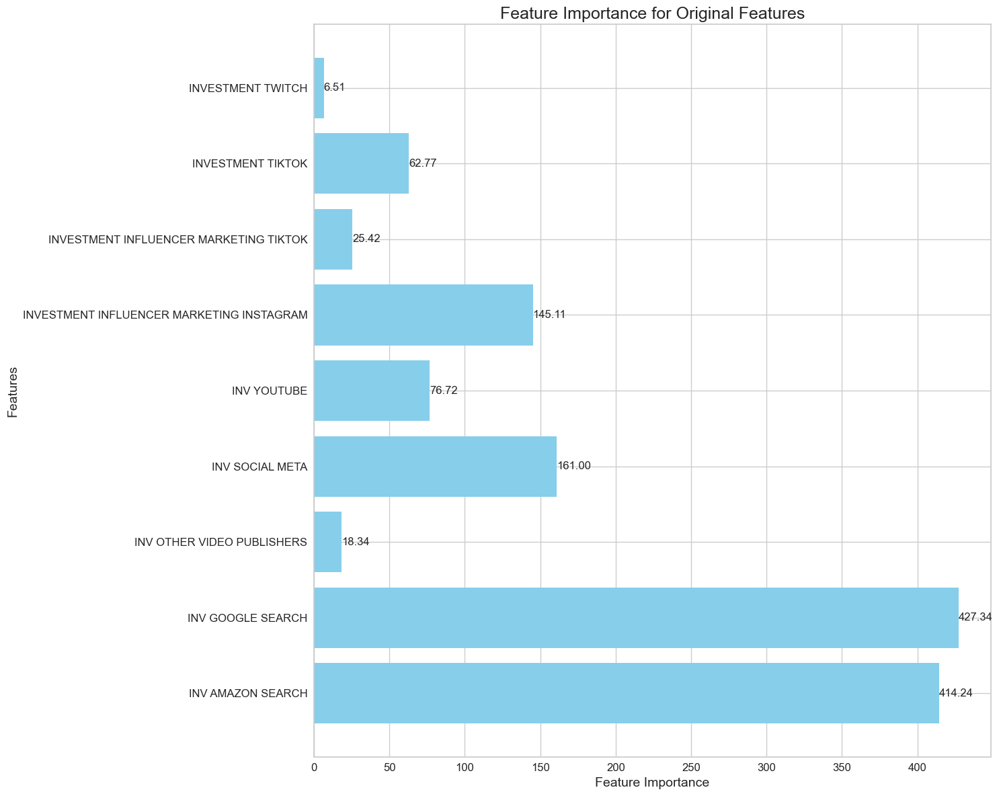

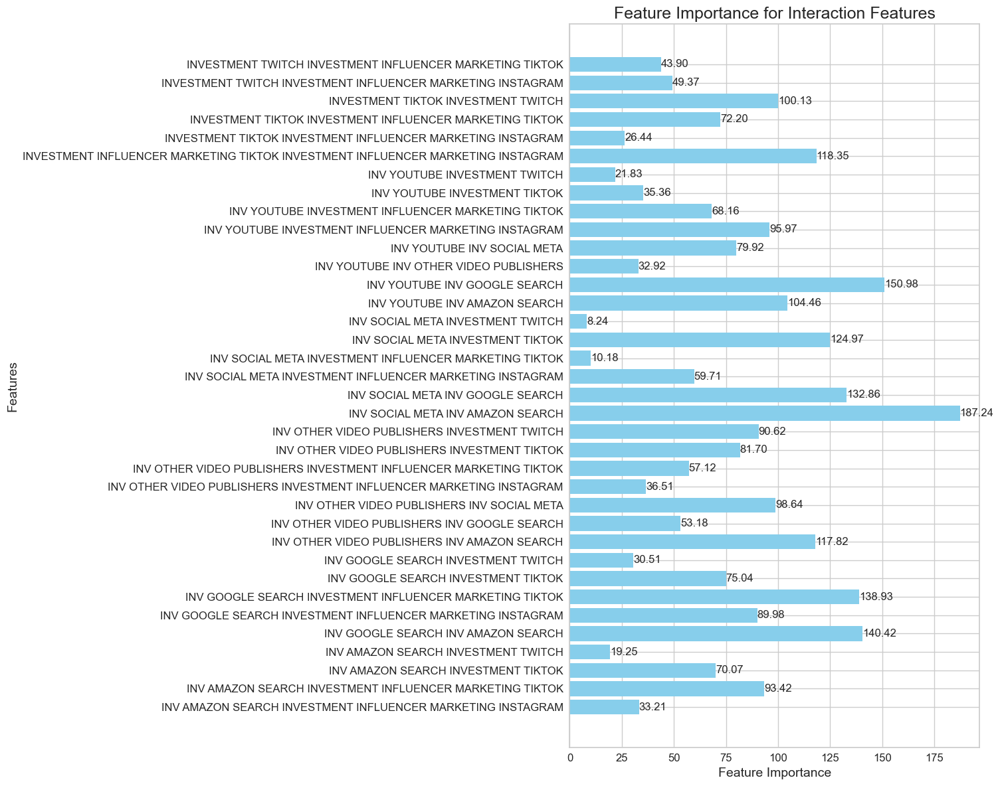

In [426]:
X = digital_invest.drop(['Digital Value'], axis=1)
y = digital_invest['Digital Value']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model_bayes, y_pred_bayes, r2_train_bayes, r2_test_bayes, feature_importance_bayes = perform_regression(
    X_train, X_test, y_train, 
    model_type='BayesianRidge', 
    tune_hyperparameters=False, 
    include_interactions=True, 
    degree=2
)

### BayesianRidge

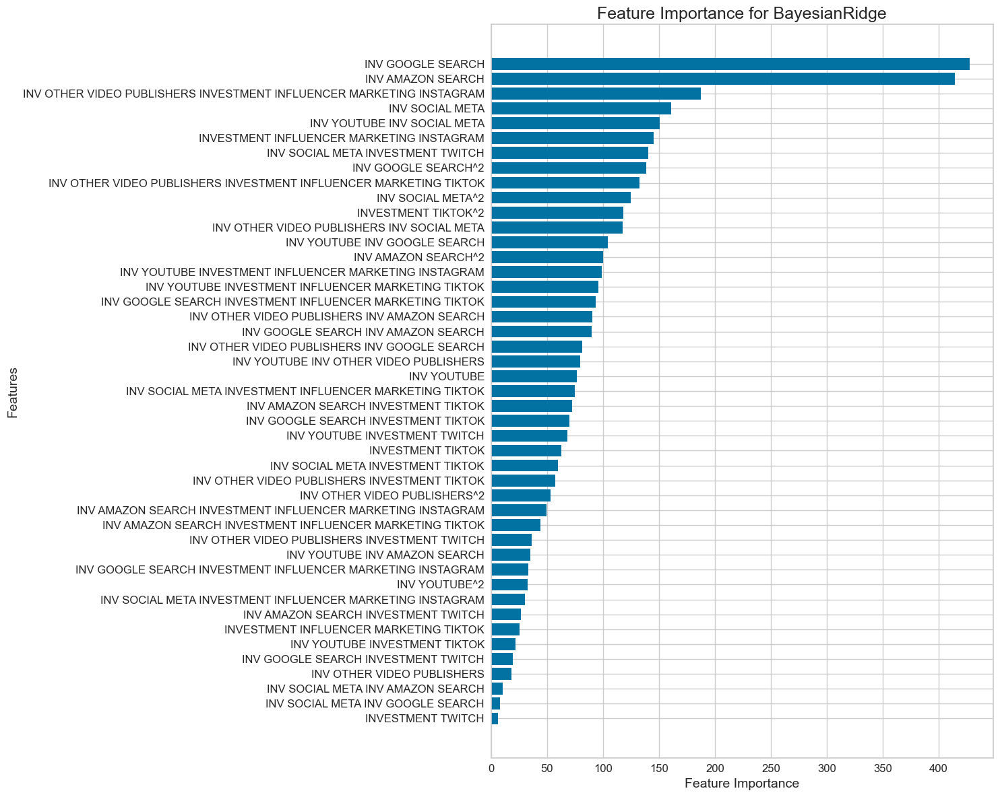

In [428]:
import matplotlib.pyplot as plt
import numpy as np

poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_train)
feature_names = poly.get_feature_names_out(X_train.columns)

non_zero_indices = np.where(feature_importance_bayes != 0)[0]
feature_names_filtered = feature_names[non_zero_indices]
feature_importance_filtered = feature_importance_bayes[non_zero_indices]

if len(feature_importance_filtered) == len(feature_names_filtered):
    sorted_idx = np.argsort(feature_importance_filtered)
    plt.figure(figsize=(15, 12))
    plt.barh(feature_names_filtered[sorted_idx], feature_importance_filtered[sorted_idx])

    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Features", fontsize=14)
    plt.title(f"Feature Importance for BayesianRidge", fontsize=18)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()  

    plt.show()
else:
    print(f"Размер feature_importance_filtered: {len(feature_importance_filtered)}")
    print(f"Размер feature_names_filtered: {len(feature_names_filtered)}")
    print("Check the compliance of the number of features.")


### Total Interections.

In [430]:
digital_invest
final_df.columns

Index(['Value Sales Brand', 'Number of Items', 'AVERAGE PROMO PRICE',
       'AVERAGE PRICE MKT', 'SEASONALITY MARKET', 'DISTRIBUTED SAMPLES (.000)',
       'ONLINE REVIEWS', 'ONLINE RATINGS', 'Positive Opinions',
       'Negative Opinions', 'GRP TV 20''', 'GRP TV 10''',
       'digital_investments', 'competitors_grp', 'total_editors',
       'total_totem', 'events_seasonal', 'Sales Value Growth (%)',
       'season_Spring', 'season_Summer', 'season_Winter',
       'Weighted Handling Distribution_lag_halo',
       'NUMBER OF INFLUENCERS INVOLVED_log_lag_halo',
       'INVESTMENTS TV_log_lag_halo', 'INVESTMENTS PRINT_log_lag_halo',
       'LOCKDOWN_log_lag_halo', 'promo_log_lag_halo'],
      dtype='object')

In [718]:
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.exceptions import ConvergenceWarning
import warnings
from yellowbrick.regressor import ResidualsPlot

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the regression function
def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', simple: bool = True, alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5, feature_selection: bool = True):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    feature selection, and cross-validation, and return the final model and predictions.
    """

    model = None
    y_pred = None
    y_train_pred = None

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Initialize and fit the model
        model = sm.OLS(y_train, X_train_const)
        results = model.fit()
        y_pred = results.predict(X_test_const)
        y_train_pred = results.predict(X_train_const)

        # Print the summary
        if simple:
            print(results.summary())
        else:
            # Get the p-values of the features
            p_values = results.pvalues

            # Get the features with p-value less than 0.05
            significant_features = p_values[p_values < 0.05].index

            # Perform regression again with the significant features
            X_train_significant = X_train_const[significant_features]
            X_test_significant = X_test_const[significant_features]

            # Initialize and fit the model
            model = sm.OLS(y_train, X_train_significant)
            results = model.fit()

            # Print the summary
            print(results.summary())

            # Make predictions
            y_pred = results.predict(X_test_significant)
            y_train_pred = results.predict(X_train_significant)

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Coefficients interpretation
        coef = model.coef_
        selected_features = X_train.columns[np.abs(coef) > 1e-5]
        X_train_selected = sm.add_constant(X_train[selected_features])
        results = sm.OLS(y_train, X_train_selected).fit()
        print(results.summary())

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("Random Forest Feature Importance")
        plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance
        importance = model.feature_importances_
        sorted_idx = np.argsort(importance)
        plt.barh(X_train.columns[sorted_idx], importance[sorted_idx])
        plt.xlabel("GBM Feature Importance")
        plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Feature importance with SHAP
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)

        # Select features with non-zero coefficients
        selected_features = X_train.columns[lasso.coef_ != 0]
        print("Selected features:", selected_features)

        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)

        # Select features with coefficients above a certain threshold
        threshold = 1e-5  # Define a threshold for significance
        selected_features = X_train.columns[np.abs(ridge.coef_) > threshold]
        print("Selected features for Ridge:", selected_features)
    
        # Use OLS for interpretability
        X_train_selected = sm.add_constant(X_train[selected_features])
        X_test_selected = sm.add_constant(X_test[selected_features])
    
        ols_model = sm.OLS(y_train, X_train_selected)
        ols_results = ols_model.fit()
        print(ols_results.summary())
        y_pred = ols_results.predict(X_test_selected)
        y_train_pred = ols_results.predict(X_train_selected)
    
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Cross-Validation (Optional)
    if model_type not in ['OLS'] and not simple:
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
        print(f"Cross-Validation R2 Score: {np.mean(cv_scores)} ± {np.std(cv_scores)}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    return model, y_pred


                            OLS Regression Results                            
Dep. Variable:          Digital Value   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     49.44
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           6.71e-45
Time:                        00:56:36   Log-Likelihood:                -1290.3
No. Observations:                 166   AIC:                             2605.
Df Residuals:                     154   BIC:                             2642.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

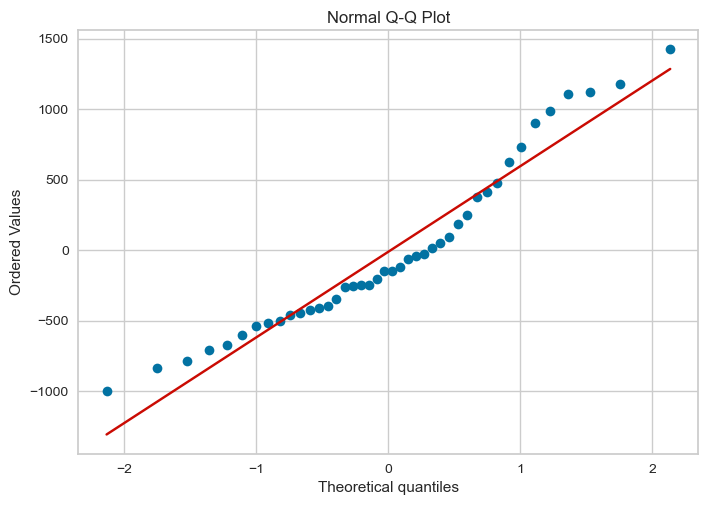


Actual vs Predicted:


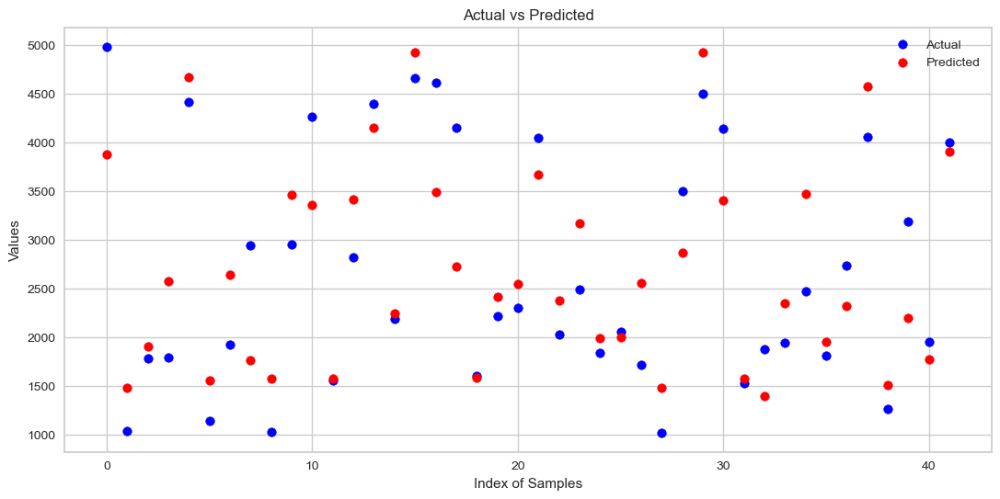

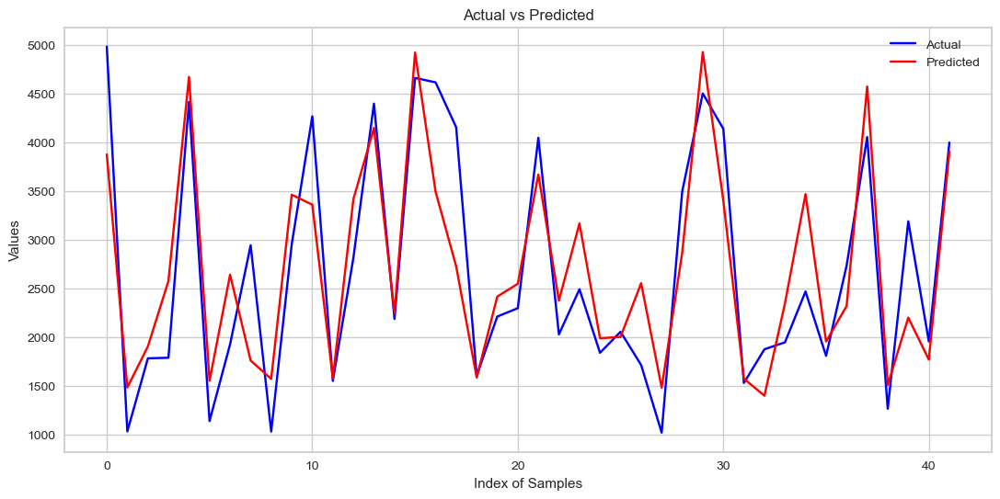

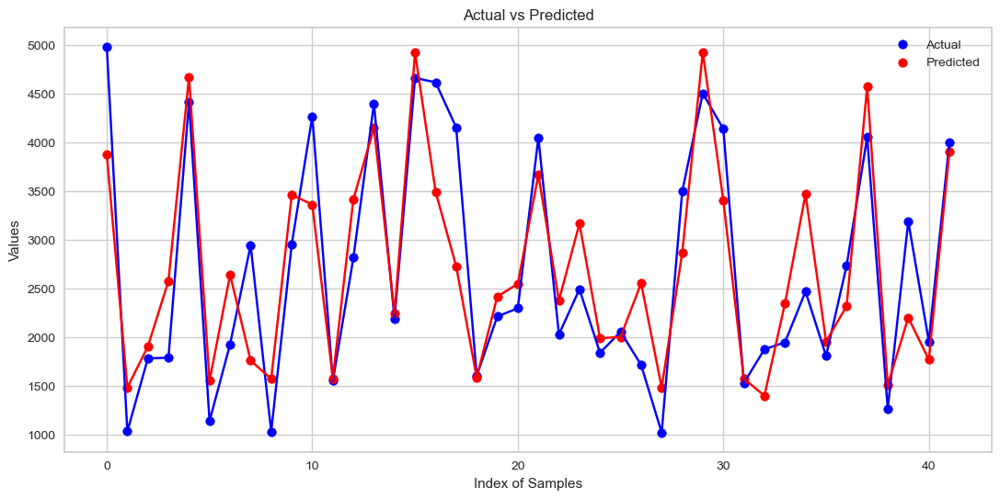


Residuals Scatter Plot:


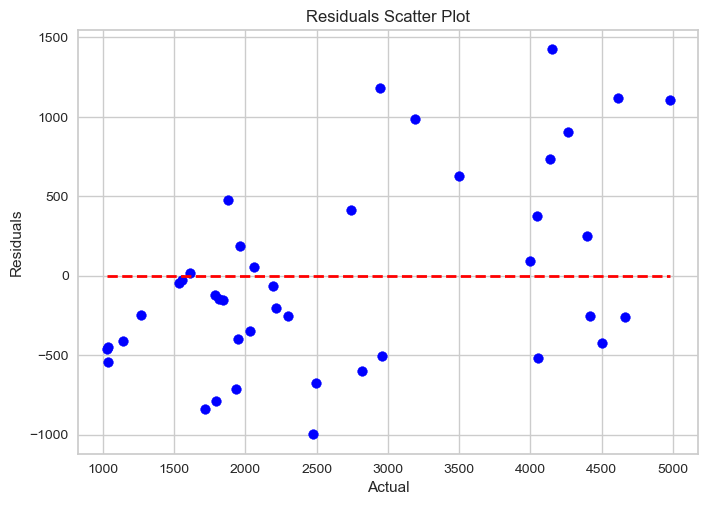


Residuals Histogram:


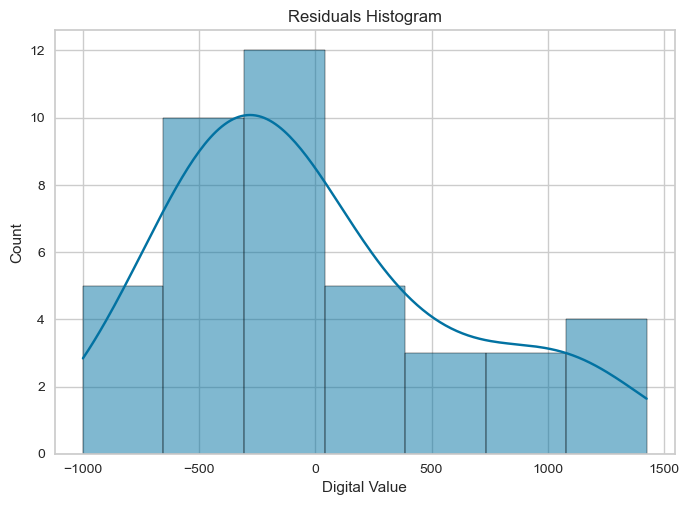

In [720]:
X = digital_invest.drop(['Digital Value'], axis=1)
y = digital_invest['Digital Value']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [722]:
final_df.columns

Index(['Value Sales Brand', 'Number of Items', 'AVERAGE PROMO PRICE',
       'AVERAGE PRICE MKT', 'SEASONALITY MARKET', 'DISTRIBUTED SAMPLES (.000)',
       'ONLINE REVIEWS', 'ONLINE RATINGS', 'Positive Opinions',
       'Negative Opinions', 'GRP TV 20''', 'GRP TV 10''',
       'digital_investments', 'competitors_grp', 'total_editors',
       'total_totem', 'events_seasonal', 'Sales Value Growth (%)',
       'season_Spring', 'season_Summer', 'season_Winter',
       'Weighted Handling Distribution_lag_halo',
       'NUMBER OF INFLUENCERS INVOLVED_log_lag_halo',
       'INVESTMENTS TV_log_lag_halo', 'INVESTMENTS PRINT_log_lag_halo',
       'LOCKDOWN_log_lag_halo', 'promo_log_lag_halo'],
      dtype='object')

In [724]:
digital_invest.columns

Index(['INV YOUTUBE', 'INV OTHER VIDEO PUBLISHERS', 'INV SOCIAL META',
       'INV GOOGLE SEARCH', 'INV AMAZON SEARCH', 'INVESTMENT TIKTOK',
       'INVESTMENT TWITCH', 'INVESTMENT INFLUENCER MARKETING TIKTOK',
       'INVESTMENT INFLUENCER MARKETING INSTAGRAM', 'Digital Value',
       'TV Value', 'INVESTMENTS TV', 'TV+Digital Values'],
      dtype='object')

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.861
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     33.20
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.12e-47
Time:                        00:59:50   Log-Likelihood:                -1526.6
No. Observations:                 166   AIC:                             3107.
Df Residuals:                     139   BIC:                             3191.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

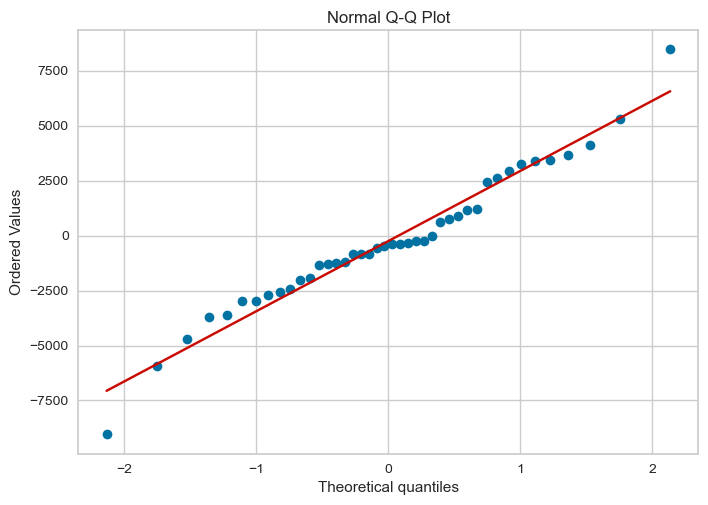


Actual vs Predicted:


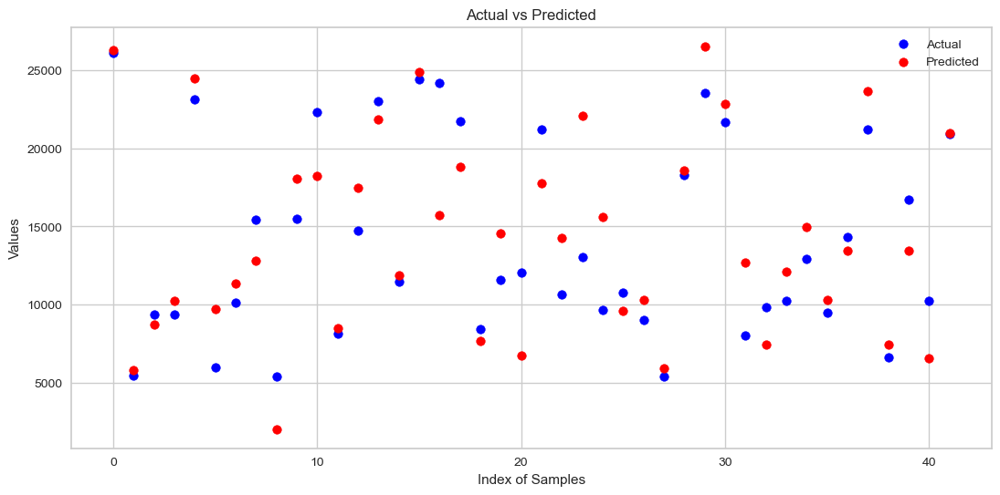

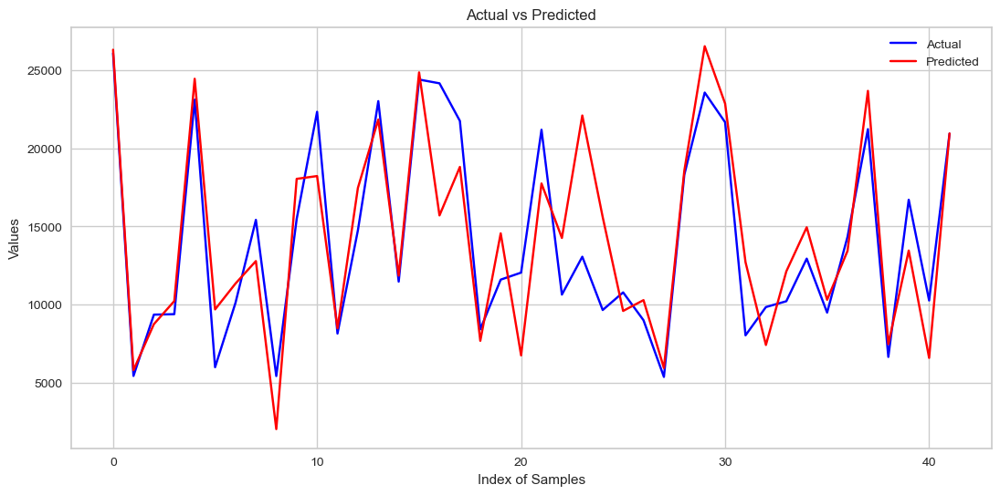

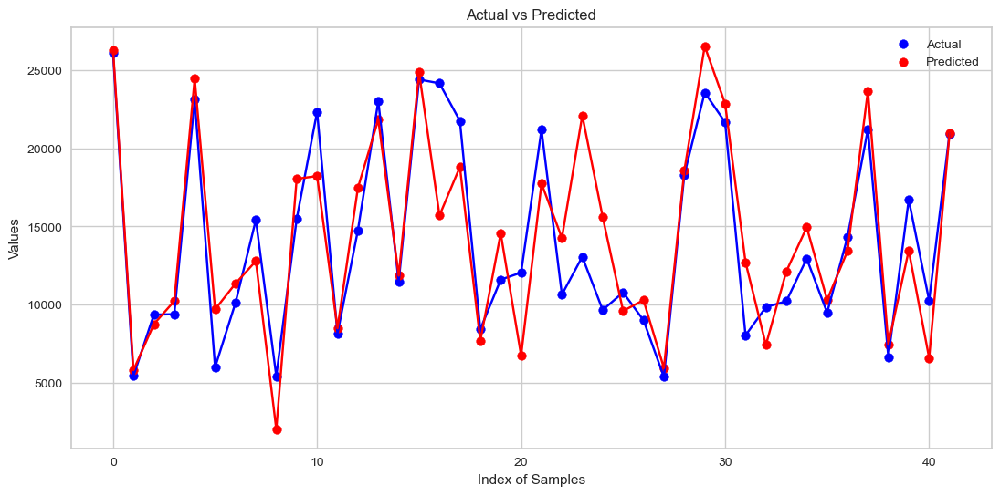


Residuals Scatter Plot:


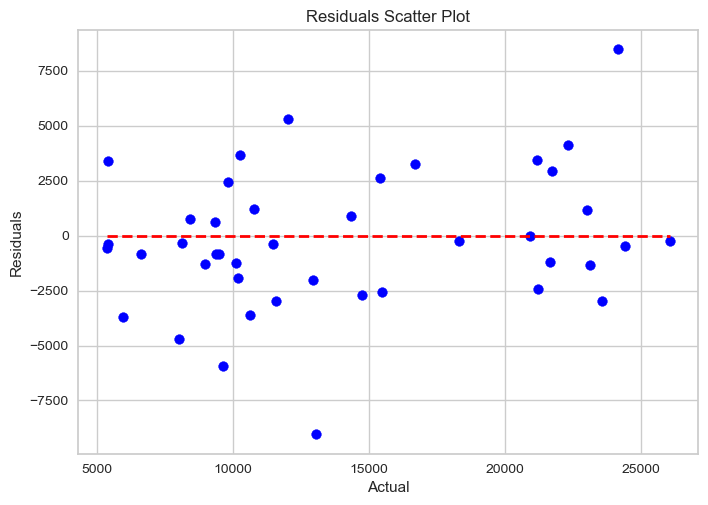


Residuals Histogram:


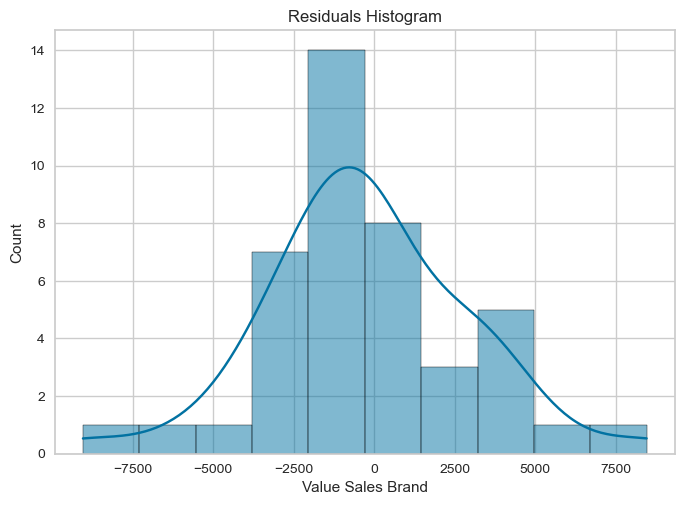

In [742]:
# Assuming dframe1 is your dataframe
X_copy = final_df.drop(['Value Sales Brand'], axis=1)
y_copy = final_df['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy
                                                    , test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     44.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.60e-51
Time:                        00:59:50   Log-Likelihood:                -1528.1
No. Observations:                 166   AIC:                             3098.
Df Residuals:                     145   BIC:                             3163.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

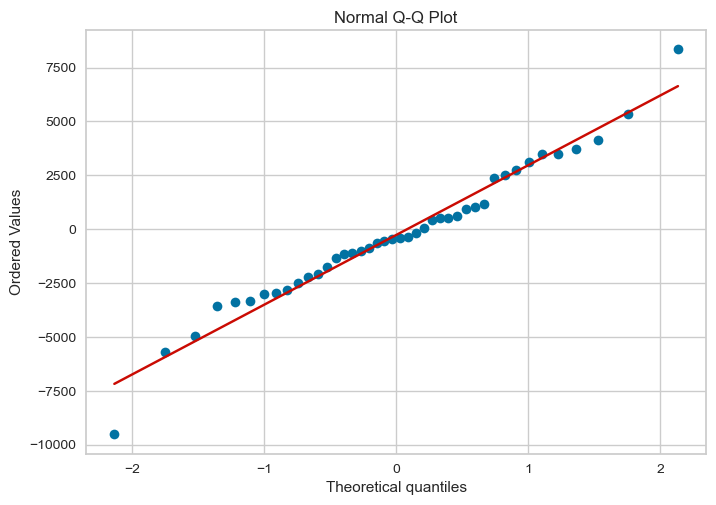


Actual vs Predicted:


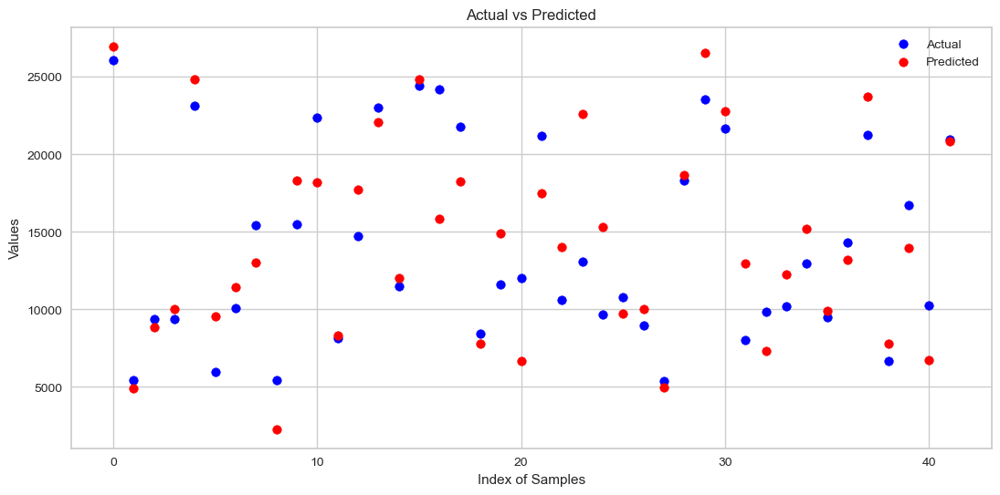

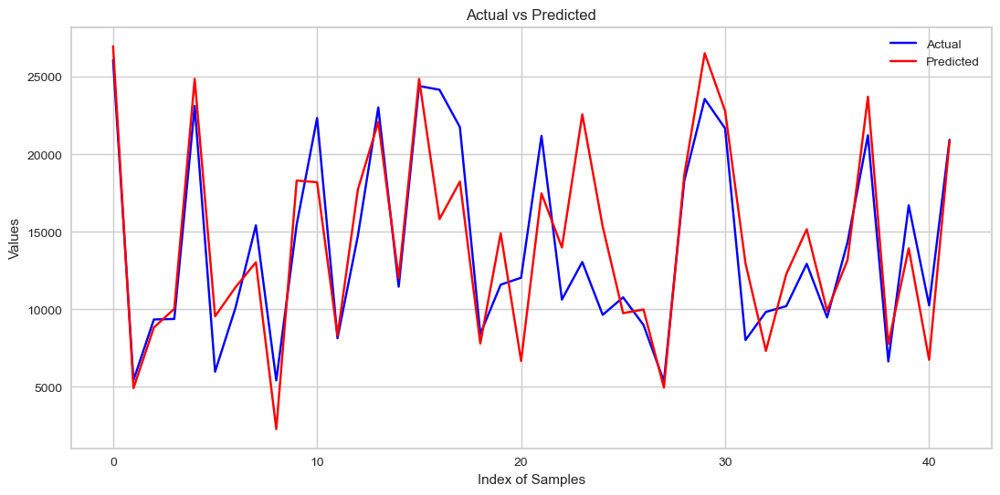

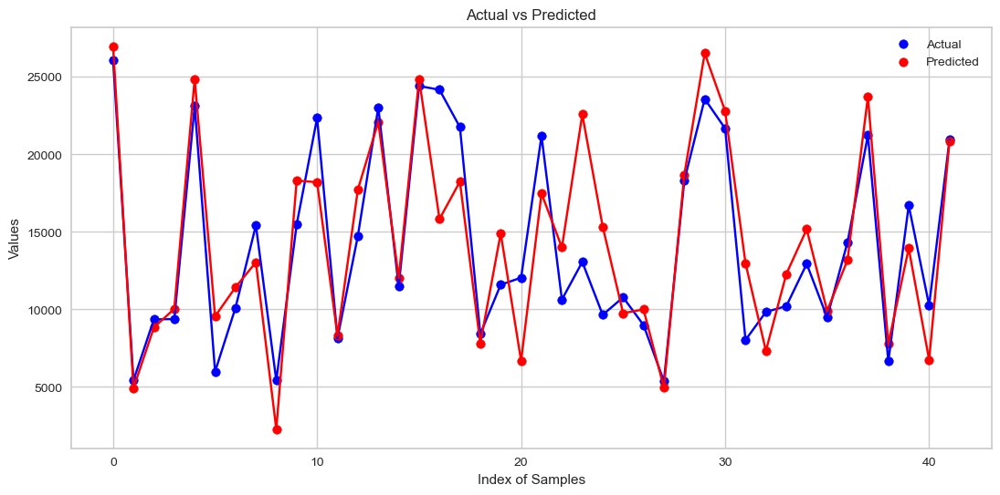


Residuals Scatter Plot:


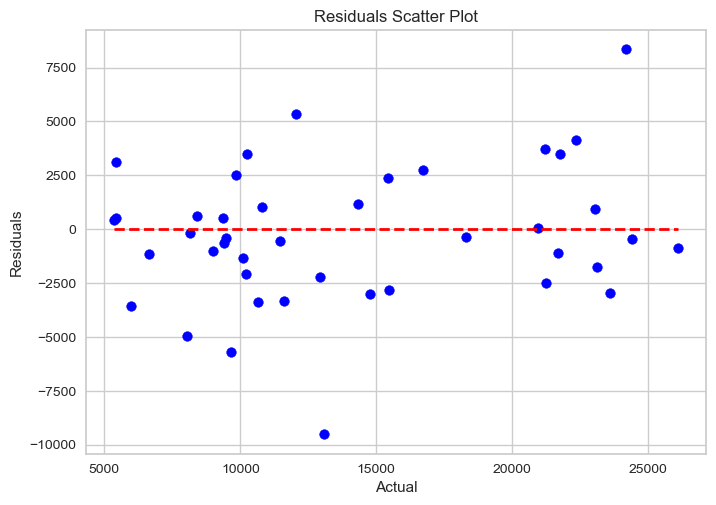


Residuals Histogram:


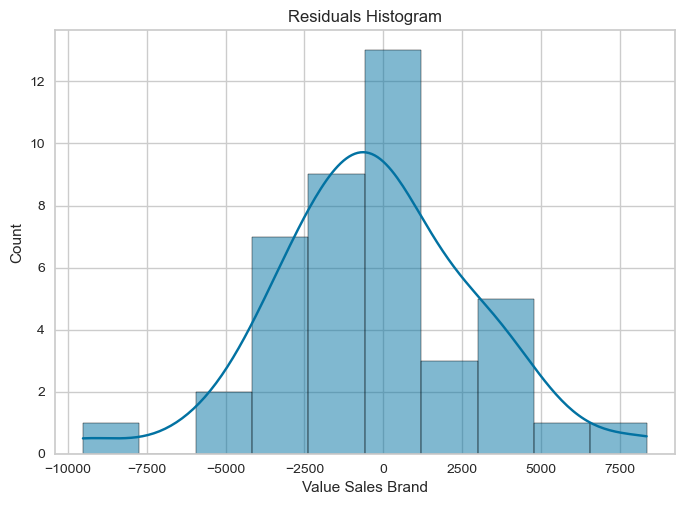

In [743]:
# Assuming dframe1 is your dataframe
X1_copy = X_copy.drop(['Number of Items', 'AVERAGE PRICE MKT', 'competitors_grp', 'total_editors', 'DISTRIBUTED SAMPLES (.000)', 'events_seasonal'], axis=1)
y1_copy = y_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1_copy, y1_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     61.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           8.04e-55
Time:                        00:59:51   Log-Likelihood:                -1533.1
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     151   BIC:                             3143.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

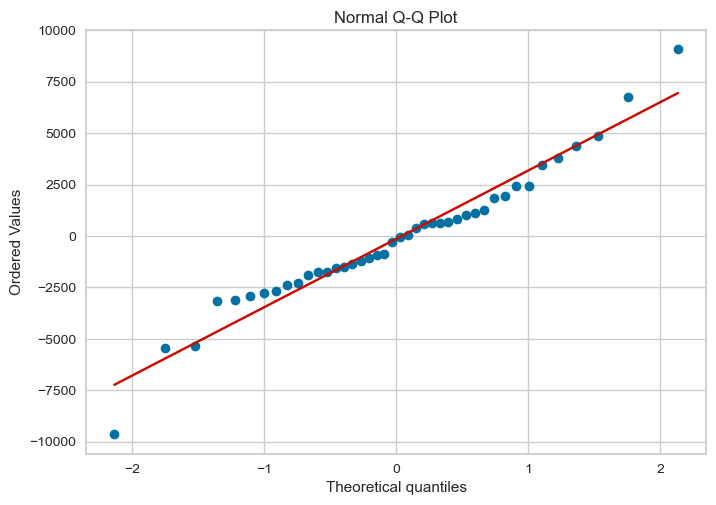


Actual vs Predicted:


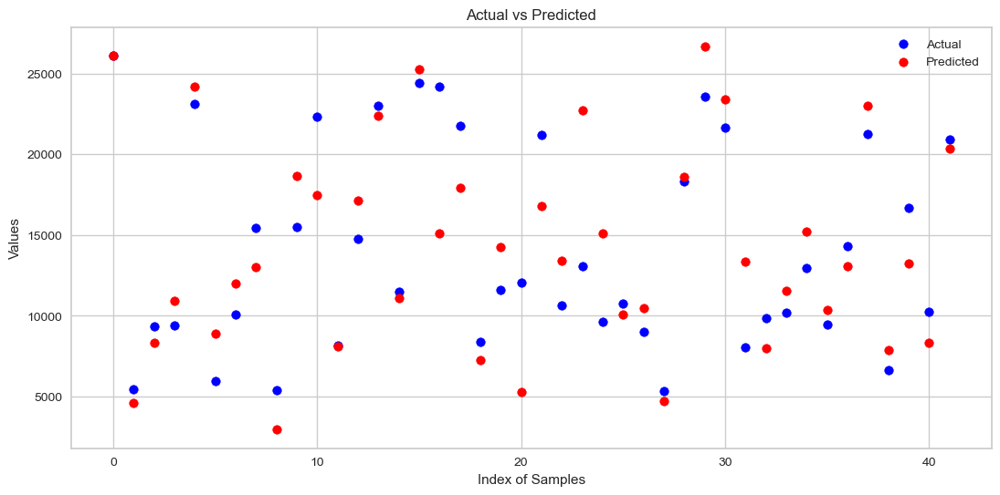

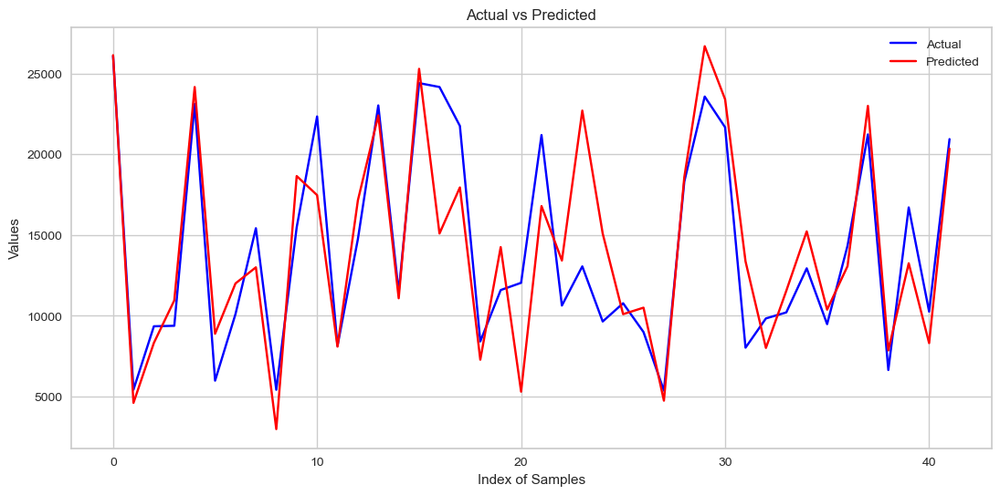

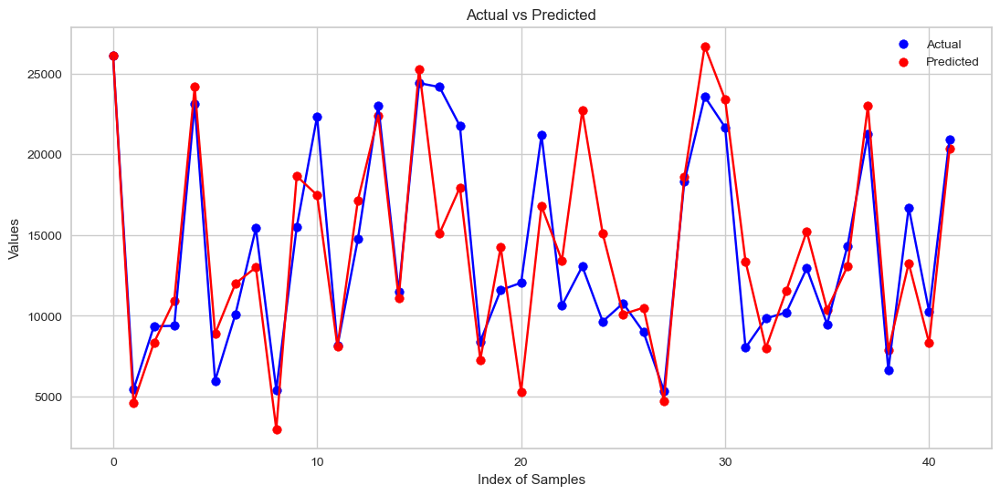


Residuals Scatter Plot:


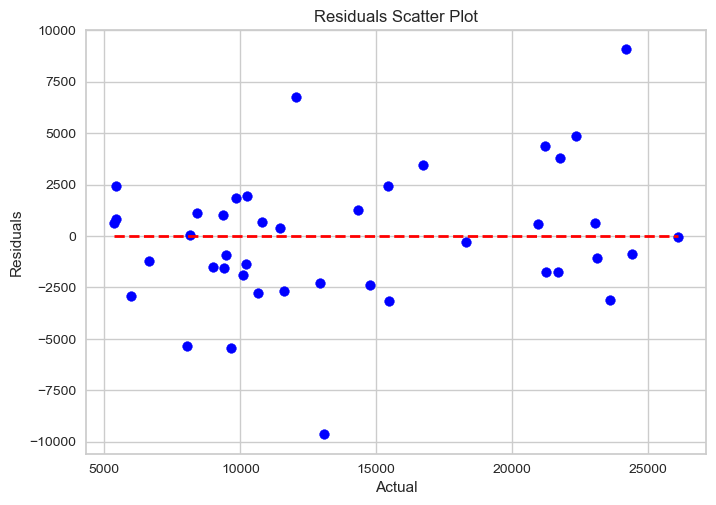


Residuals Histogram:


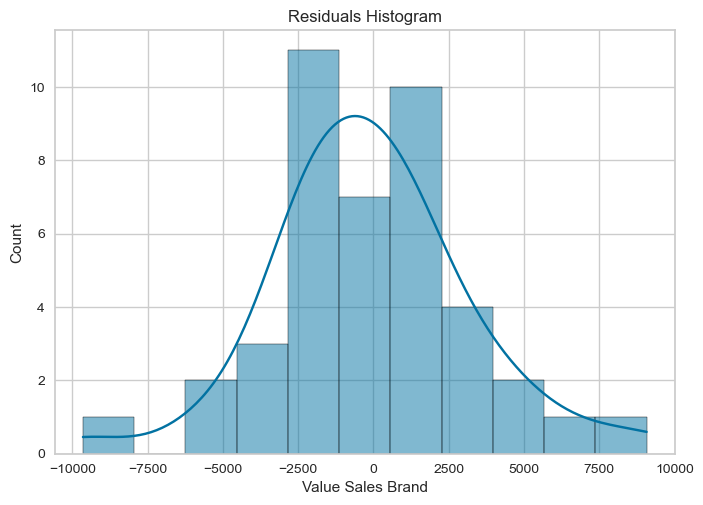

In [745]:
# Assuming dframe1 is your dataframe
X2_copy = X1_copy.drop(['SEASONALITY MARKET', 'total_totem', 'Positive Opinions', 'season_Spring', 
              'Weighted Handling Distribution_lag_halo', 'LOCKDOWN_log_lag_halo'], axis=1)
y2_copy = y1_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2_copy, y2_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     76.40
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.39e-56
Time:                        00:59:52   Log-Likelihood:                -1535.8
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     154   BIC:                             3133.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

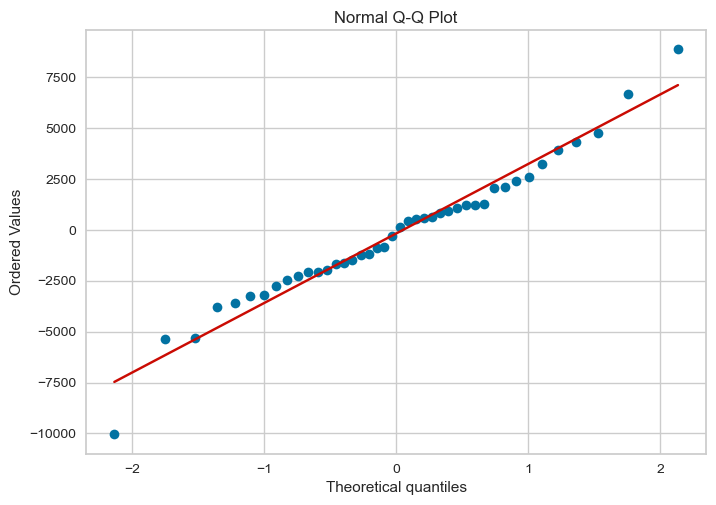


Actual vs Predicted:


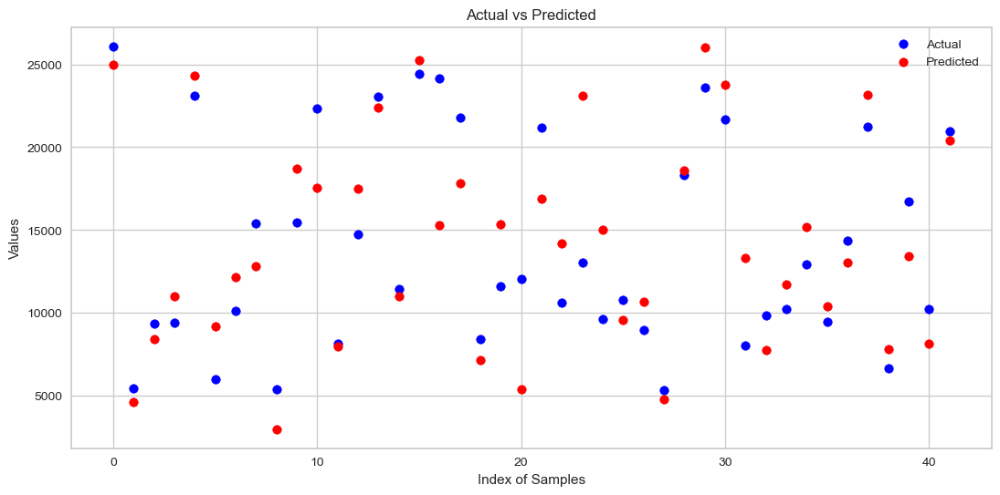

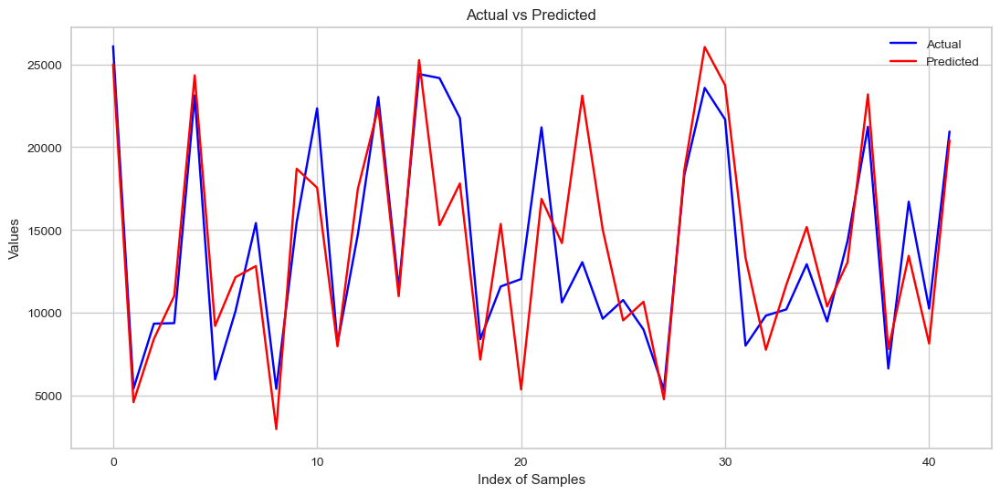

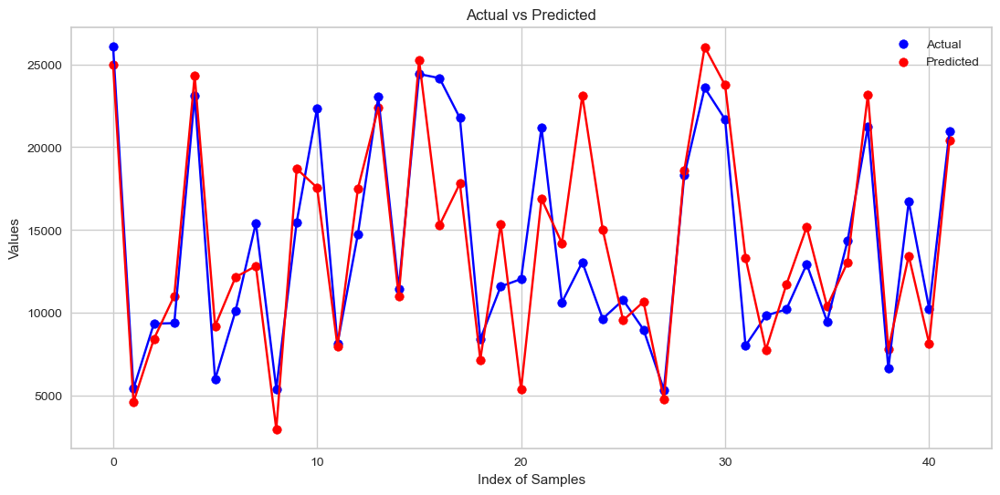


Residuals Scatter Plot:


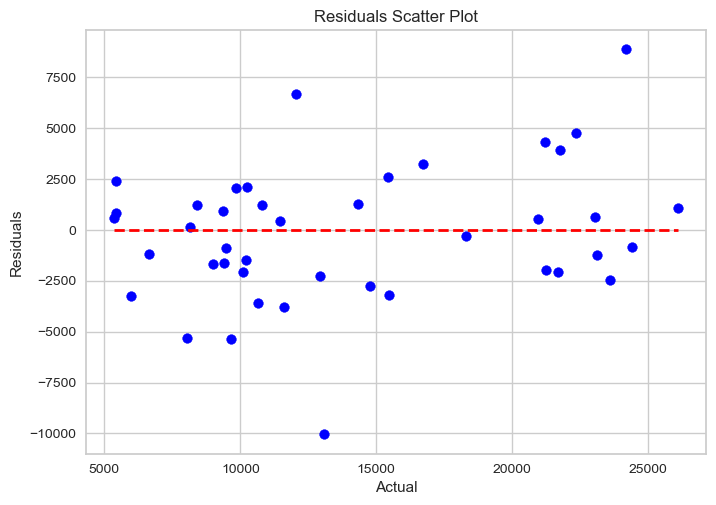


Residuals Histogram:


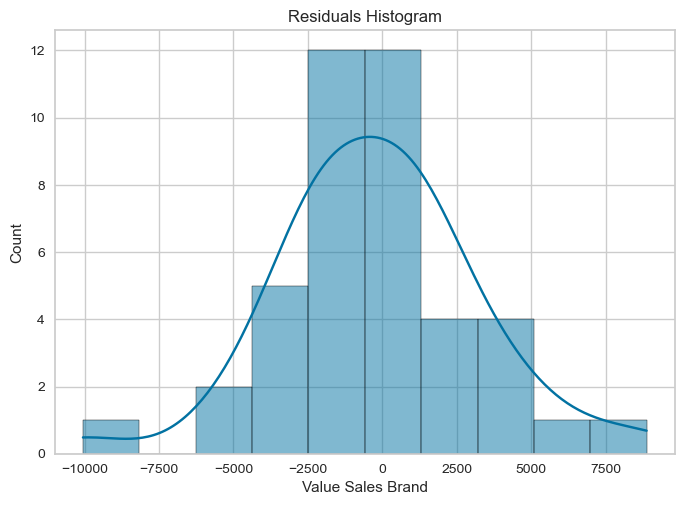

In [748]:
# Assuming dframe1 is your dataframe
X3_copy = X2_copy.drop(['INVESTMENTS PRINT_log_lag_halo', "GRP TV 20''", "GRP TV 10''"], axis=1)
y3_copy = y2_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [736]:
#top 5 best
X3_copy['Meta Amazon'] = digital_invest['INV SOCIAL META'] * digital_invest['INV AMAZON SEARCH']
X3_copy['YouTube Google'] = digital_invest['INV YOUTUBE'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Amazon Google'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Google Influencers Tiktok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Google'] = digital_invest['INV SOCIAL META'] * digital_invest['INV GOOGLE SEARCH']

In [440]:
X3_copy['Meta Twitch'] = digital_invest['INV SOCIAL META'] + digital_invest['INVESTMENT TWITCH']

In [441]:
#TOP 10 best
X3_copy['Meta Amazon'] = digital_invest['INV SOCIAL META'] * digital_invest['INV AMAZON SEARCH']
X3_copy['YouTube Google'] = digital_invest['INV YOUTUBE'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Amazon Google'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Google Influencers Tiktok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Google'] = digital_invest['INV SOCIAL META'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Meta Tiktok'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Influencers Tiktok Instagram'] = digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Amazon'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV AMAZON SEARCH']
X3_copy['TikTok Twitch'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT TWITCH']
X3_copy['YouTube Amazon'] = digital_invest['INV YOUTUBE'] * digital_invest['INV AMAZON SEARCH']

In [750]:
#TOP 5 worst
X3_copy['Tiktok Influencers Instagram'] = digital_invest['INVESTMENT TIKTOK'] + digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['YouTube Twitch'] = digital_invest['INV YOUTUBE'] + digital_invest['INVESTMENT TWITCH']
X3_copy['Amazon Twitch'] = digital_invest['INV AMAZON SEARCH'] + digital_invest['INVESTMENT TWITCH']
X3_copy['Meta Influencers Tiktok'] = digital_invest['INV SOCIAL META'] + digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Twitch'] = digital_invest['INV SOCIAL META'] + digital_invest['INVESTMENT TWITCH']

In [443]:
X3_copy

,AVERAGE PROMO PRICE,ONLINE REVIEWS,ONLINE RATINGS,Negative Opinions,digital_investments,Sales Value Growth (%),season_Summer,season_Winter,NUMBER OF INFLUENCERS INVOLVED_log_lag_halo,INVESTMENTS TV_log_lag_halo,...,Meta Twitch,Meta Tiktok,Influencers Tiktok Instagram,OVP Amazon,TikTok Twitch,YouTube Amazon,Tiktok Influencers Instagram,YouTube Twitch,Amazon Twitch,Meta Influencers Tiktok
0,9.941495,6069.000000,4.673429,0.0,3.093619,0.000000,0,1,0.000000,3.511208,...,1.354487,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.145520,0.000000,1.354487
1,9.941495,6297.000000,4.654723,3.0,2.966570,-2.403710,0,1,0.000000,1.755604,...,1.186287,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.145520,0.000000,1.186287
2,9.941495,6566.000000,4.656731,2.0,2.801161,-1.932465,0,1,0.000000,4.439213,...,1.051302,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.145520,0.000000,1.051302
3,9.941495,6790.000000,4.653559,0.0,2.721618,5.597509,0,1,0.000000,5.725285,...,0.948390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.145520,0.000000,0.948390
4,9.941495,7084.000000,4.653488,3.0,4.290006,-3.168608,0,1,0.000000,2.862642,...,1.061738,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.959438,0.000000,1.061738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,8.904765,30780.381756,4.626845,1.0,12.144160,1.877143,0,0,0.982956,0.455526,...,1.898177,0.526339,6.058798,0.876865,0.000000,0.139144,3.758320,0.274570,0.506771,3.638694
204,9.556374,31159.093424,4.643333,1.0,9.536558,-9.158479,0,0,0.491478,0.227763,...,0.000000,0.000000,10.083294,0.000000,0.000000,0.000000,2.189965,0.000000,0.506771,4.604317
205,9.540101,31813.634559,4.644802,3.0,16.657405,17.187078,0,1,0.245739,0.113882,...,3.228264,12.837916,0.000000,0.666105,0.000000,2.734398,3.976724,5.395730,0.506771,3.228264
206,9.147896,30224.935228,4.635054,4.0,34.449157,27.719724,0,1,0.122870,0.056941,...,12.035944,21.340781,0.000000,2.875923,52.449269,3.985818,6.130807,16.420166,9.061806,3.480909


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.855
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     54.72
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           5.13e-54
Time:                        00:59:58   Log-Likelihood:                -1530.6
No. Observations:                 166   AIC:                             3095.
Df Residuals:                     149   BIC:                             3148.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

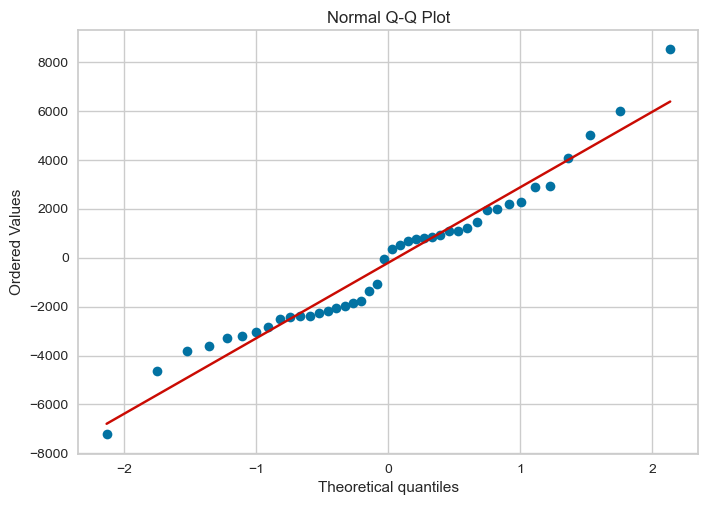


Actual vs Predicted:


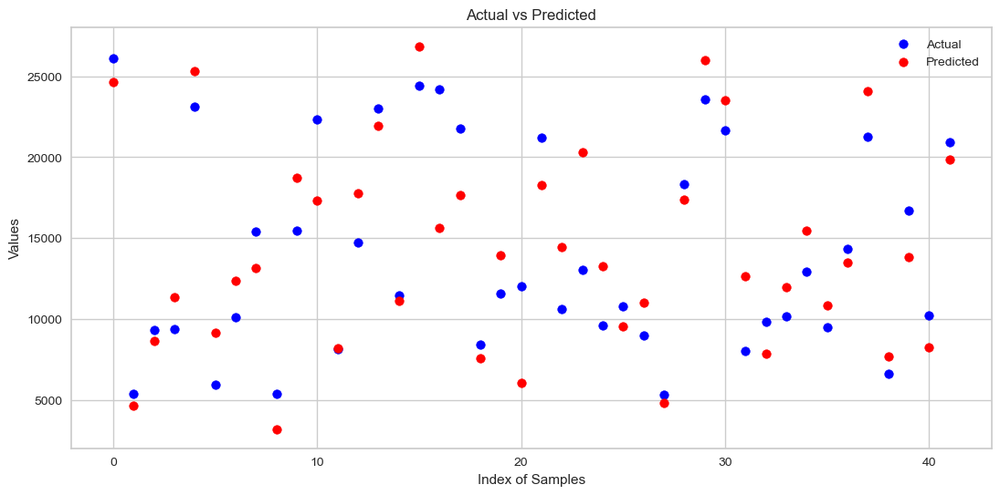

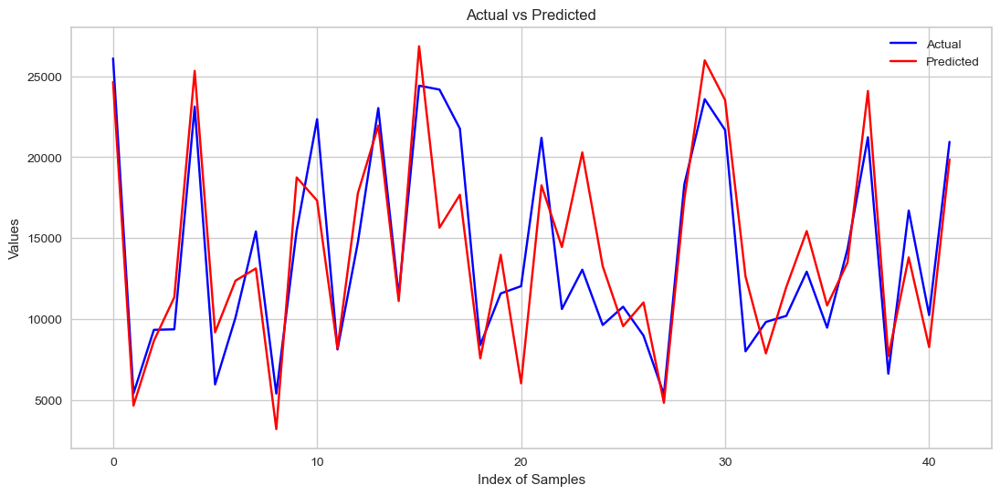

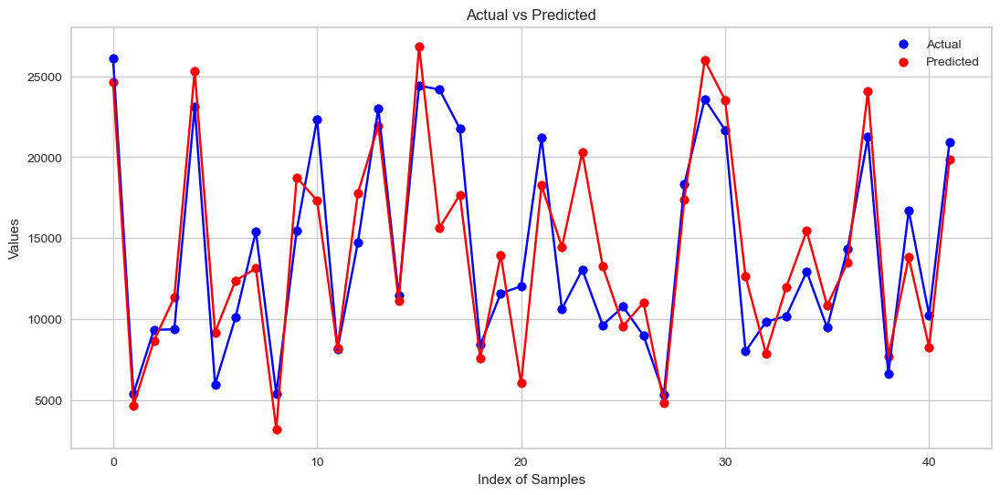


Residuals Scatter Plot:


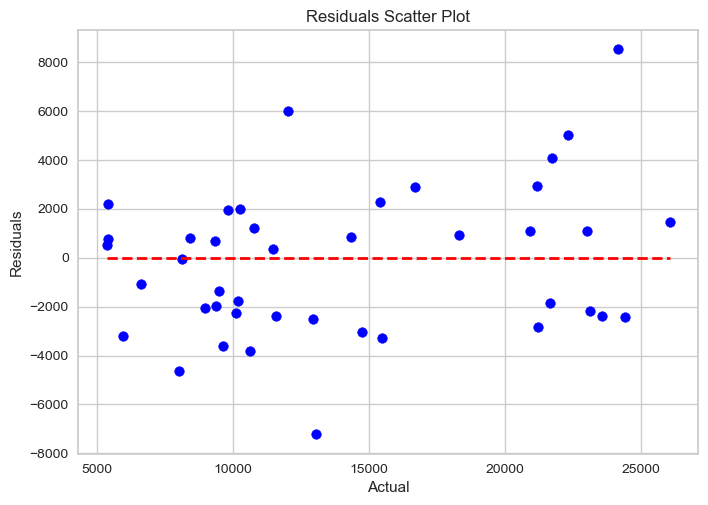


Residuals Histogram:


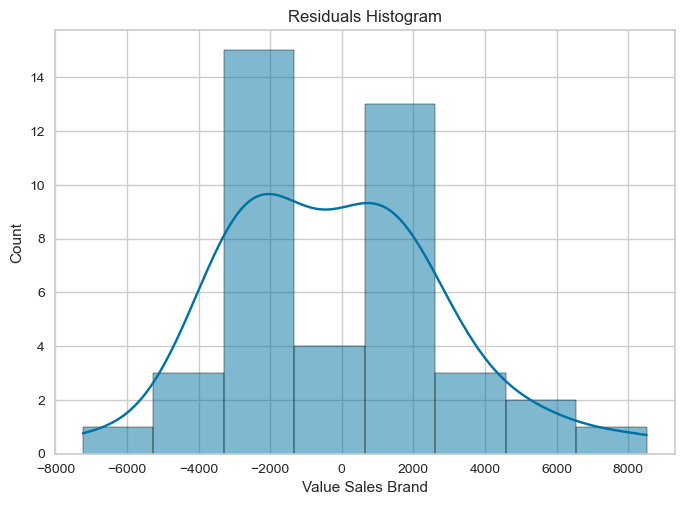

In [752]:
# Assuming dframe1 is your dataframe
X3_copy
y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     60.19
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.12e-54
Time:                        01:00:26   Log-Likelihood:                -1534.2
No. Observations:                 166   AIC:                             3098.
Df Residuals:                     151   BIC:                             3145.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

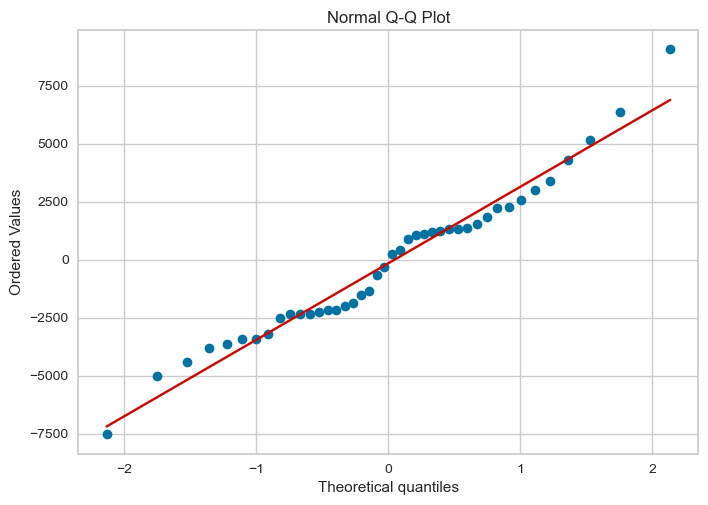


Actual vs Predicted:


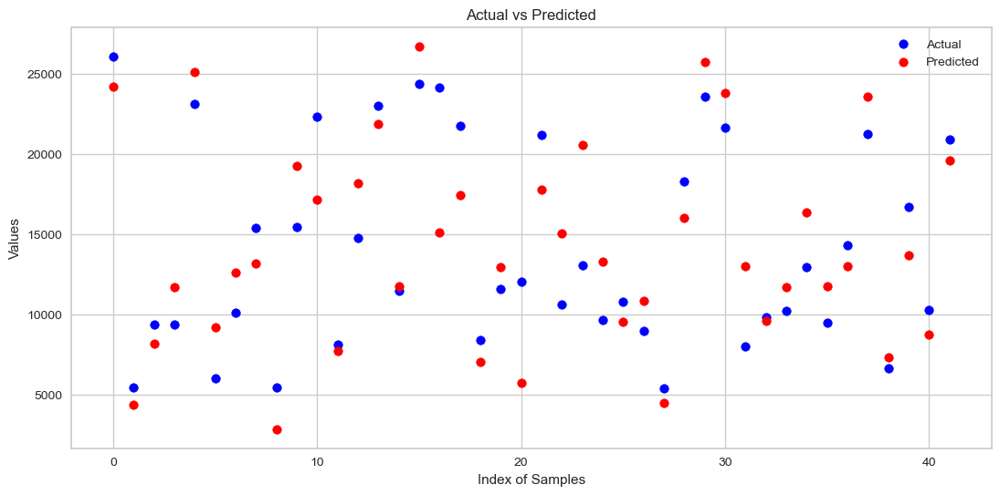

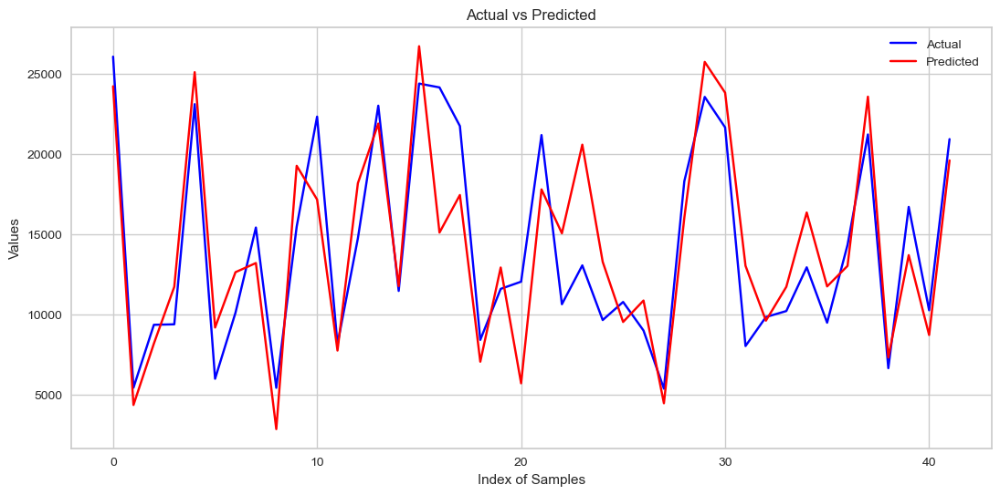

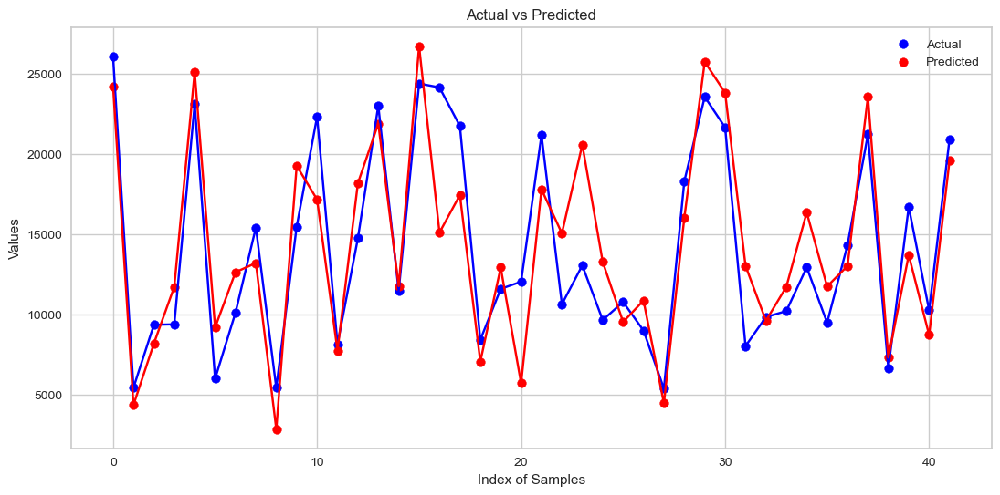


Residuals Scatter Plot:


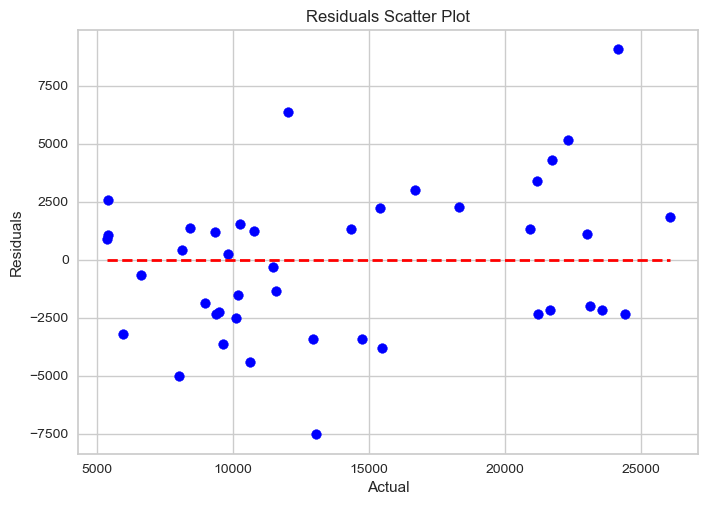


Residuals Histogram:


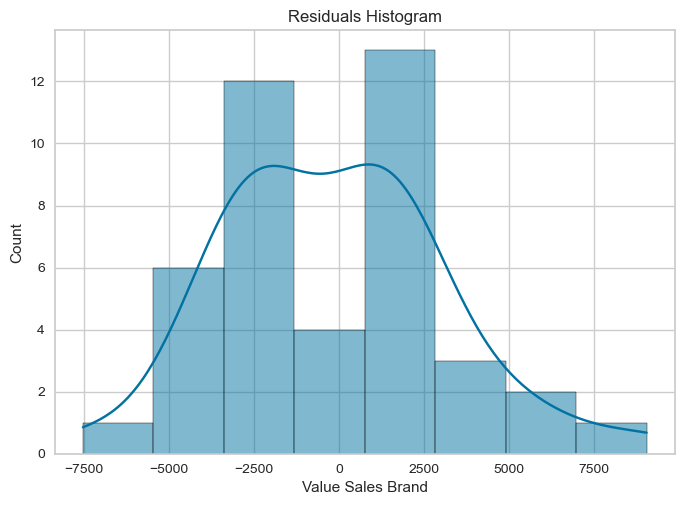

In [754]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy.drop(['NUMBER OF INFLUENCERS INVOLVED_log_lag_halo', 'Negative Opinions'], axis = 1)
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [446]:
## Let's assume that we already have interaction terms in our data set and use that to see if model improves or not

In [447]:
X3_copy['Meta Amazon'] = digital_invest['INV SOCIAL META'] * digital_invest['INV AMAZON SEARCH']
X3_copy['YouTube Google'] = digital_invest['INV YOUTUBE'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Amazon Google'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Google Influencers Tiktok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Google'] = digital_invest['INV SOCIAL META'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Meta Tiktok'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Influencers Tiktok Instagram'] = digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Amazon'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV AMAZON SEARCH']
X3_copy['TikTok Twitch'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT TWITCH']
X3_copy['YouTube Amazon'] = digital_invest['INV YOUTUBE'] * digital_invest['INV AMAZON SEARCH']
X3_copy['OVP Meta'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV SOCIAL META']
X3_copy['YouTube Influencers Tiktok'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Amazon Influencers Tiktok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['OVP Twitch'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Google Influencers Instagram'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Tiktok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['YouTube Meta'] = digital_invest['INV YOUTUBE'] * digital_invest['INV SOCIAL META']
X3_copy['Google Tiktok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['TikTok Influencers Tiktok'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Amazon Tiktok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['YouTube Influencers Tiktok'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['OVP Influencers Tiktok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Influencers Instagram'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['YouTube Tiktok'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Google Twitch'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Tiktok Influencers Instagram'] = digital_invest['INVESTMENT TIKTOK'] + digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['YouTube Twitch'] = digital_invest['INV YOUTUBE'] + digital_invest['INVESTMENT TWITCH']
X3_copy['Amazon Twitch'] = digital_invest['INV AMAZON SEARCH'] + digital_invest['INVESTMENT TWITCH']
X3_copy['Meta Influencers Tiktok'] = digital_invest['INV SOCIAL META'] + digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Twitch'] = digital_invest['INV SOCIAL META'] + digital_invest['INVESTMENT TWITCH']


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     41.63
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           2.50e-55
Time:                        00:27:45   Log-Likelihood:                -1469.7
No. Observations:                 166   AIC:                             3021.
Df Residuals:                     125   BIC:                             3149.
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

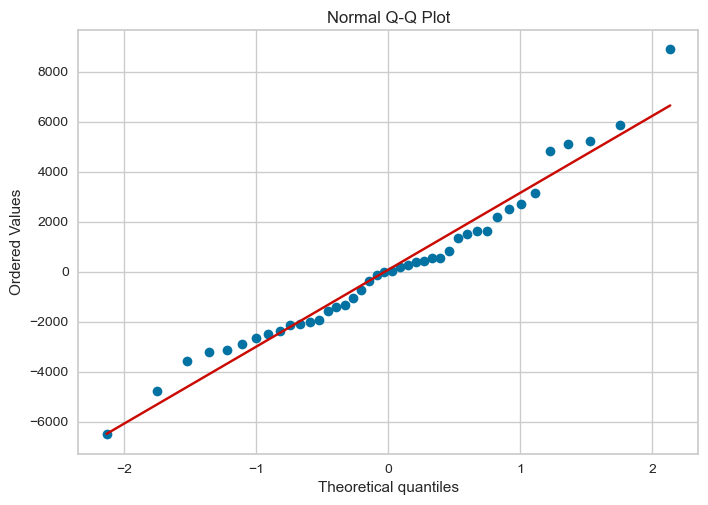


Actual vs Predicted:


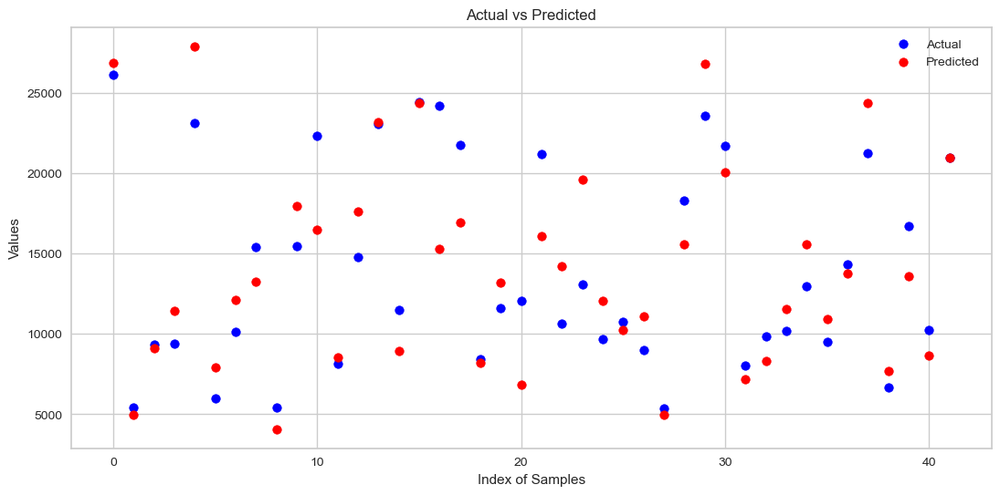

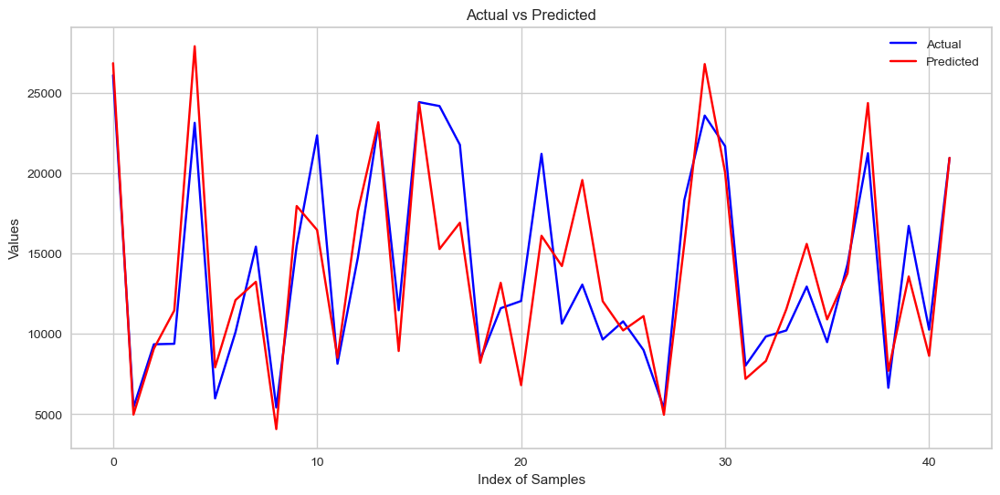

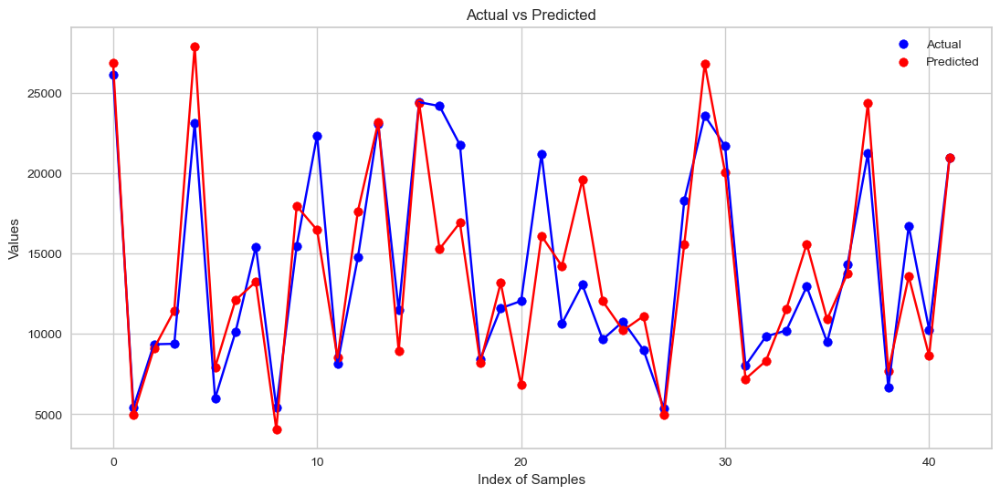


Residuals Scatter Plot:


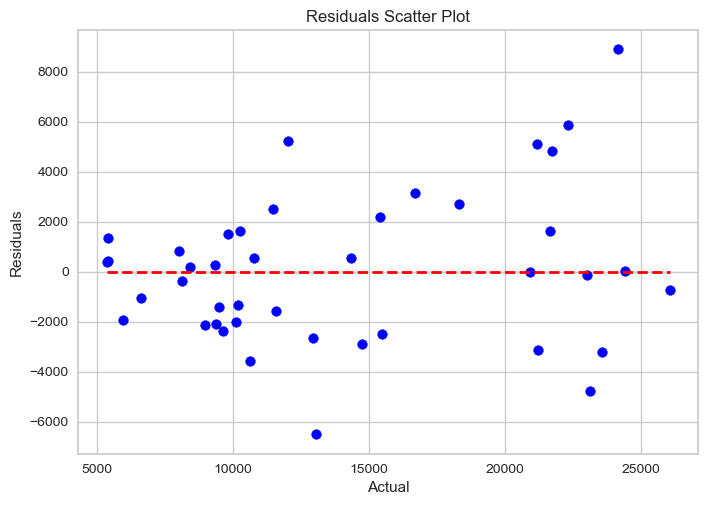


Residuals Histogram:


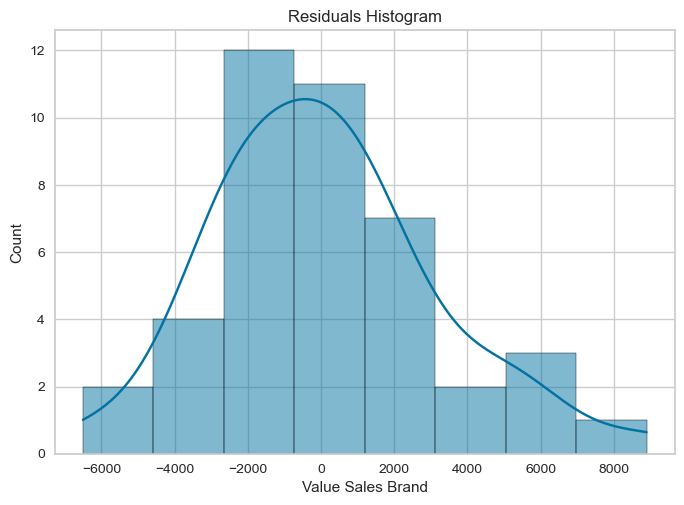

In [448]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     57.79
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           6.60e-63
Time:                        00:27:46   Log-Likelihood:                -1472.5
No. Observations:                 166   AIC:                             3007.
Df Residuals:                     135   BIC:                             3103.
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

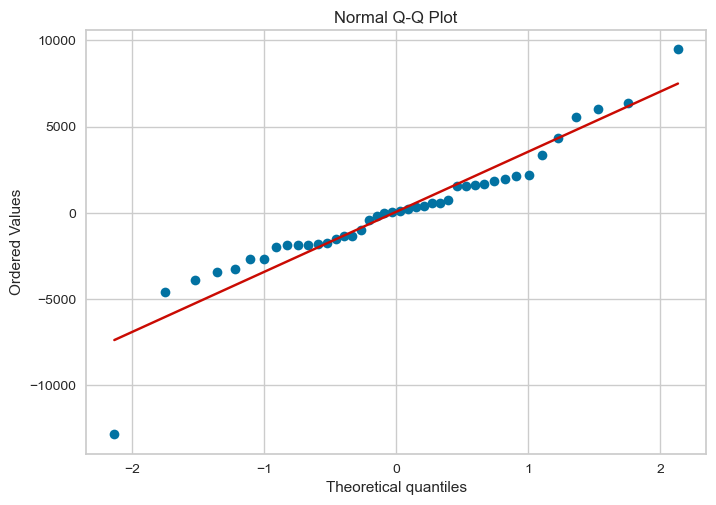


Actual vs Predicted:


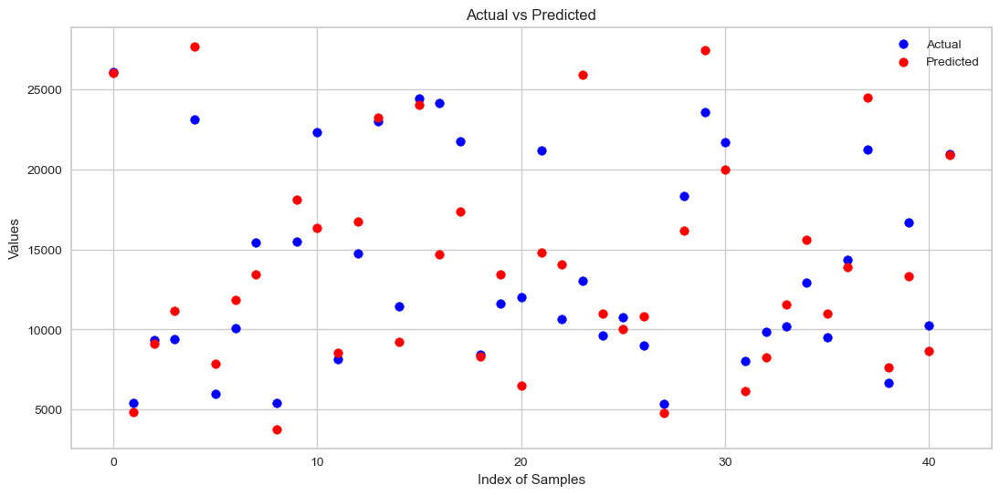

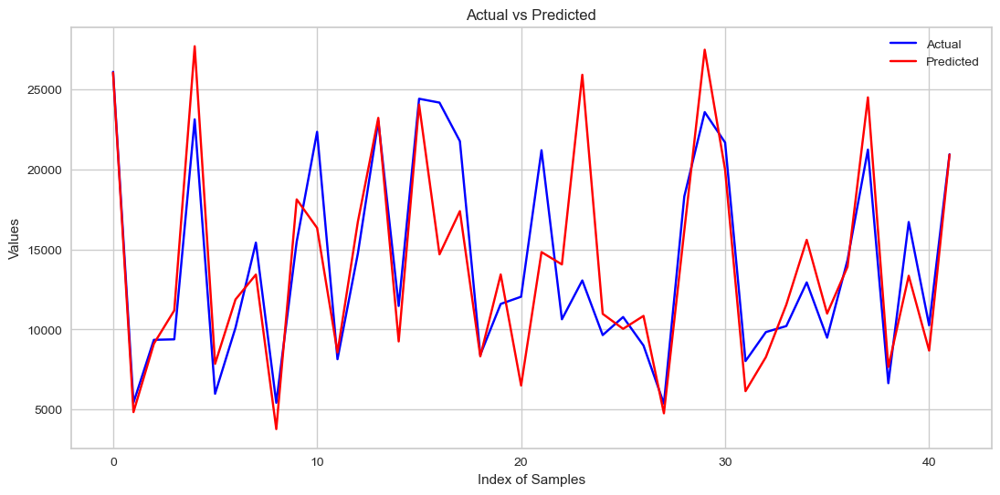

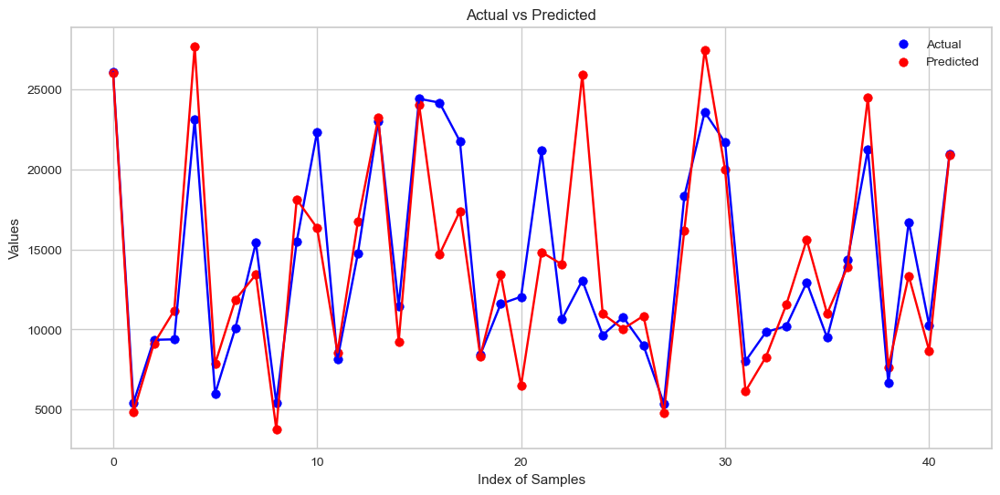


Residuals Scatter Plot:


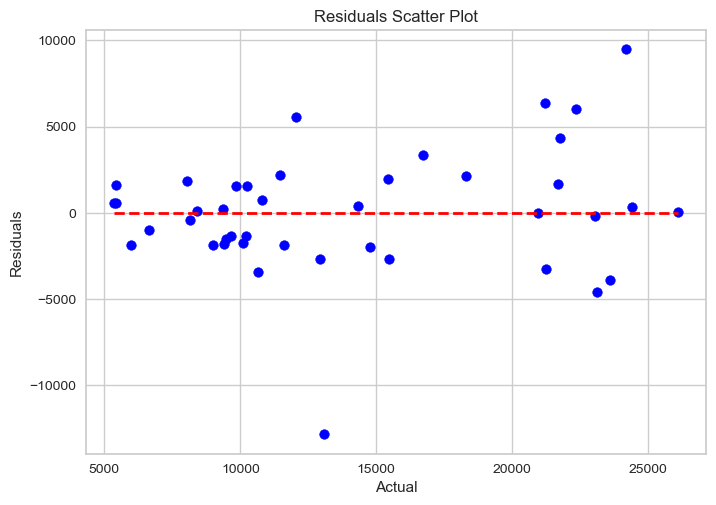


Residuals Histogram:


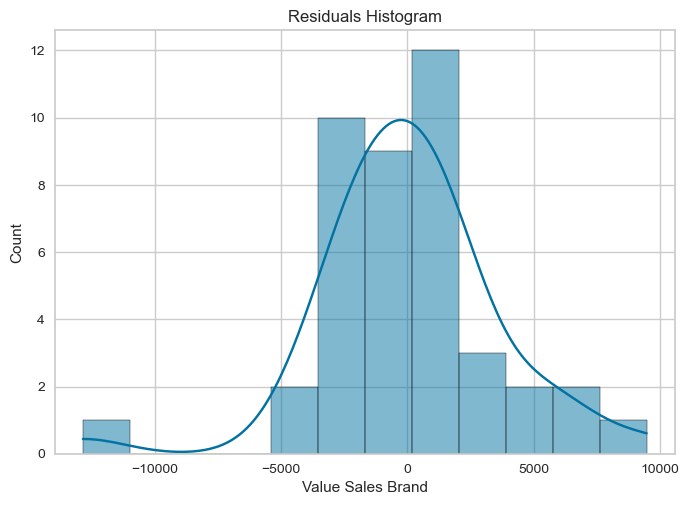

In [449]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['YouTube Meta',
    'TikTok Influencers Tiktok',
    'TikTok Twitch',
    'Tiktok Influencers Instagram',
    'OVP Influencers Tiktok',
    'YouTube Google',
    'YouTube Twitch',
    'Amazon Google',
    'Meta Twitch',
    'OVP Amazon'], axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     45.51
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.95e-57
Time:                        00:27:46   Log-Likelihood:                -1473.3
No. Observations:                 166   AIC:                             3021.
Df Residuals:                     129   BIC:                             3136.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

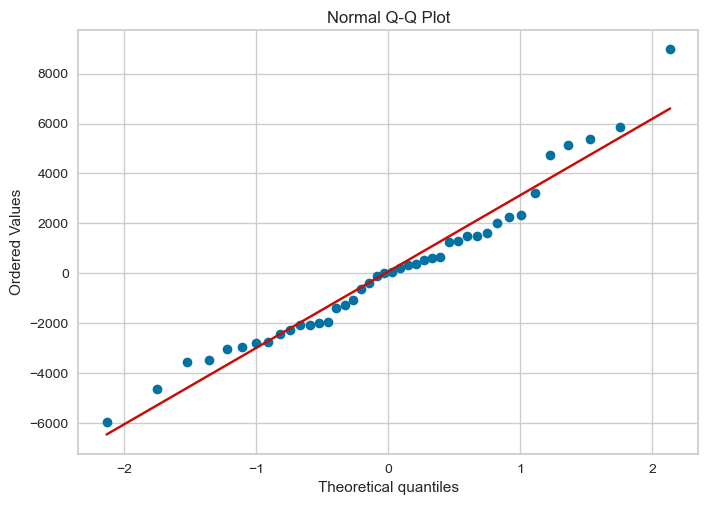


Actual vs Predicted:


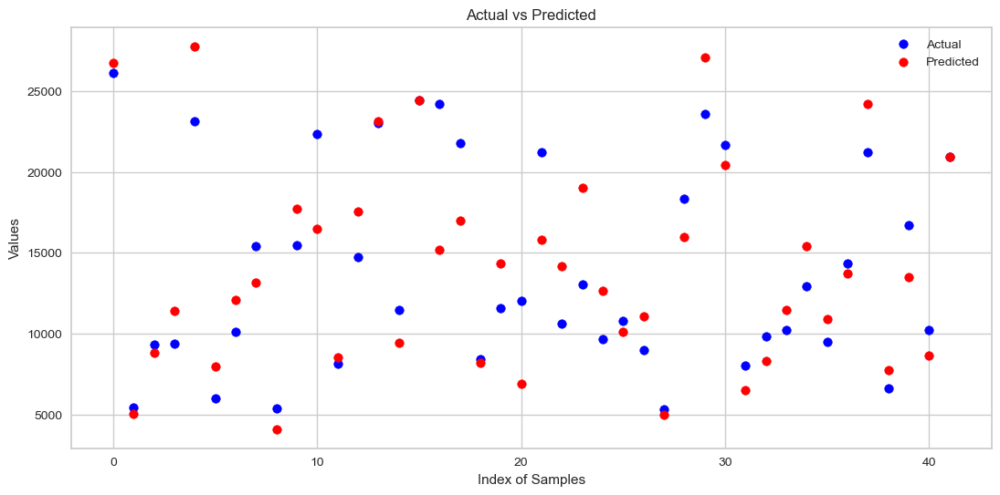

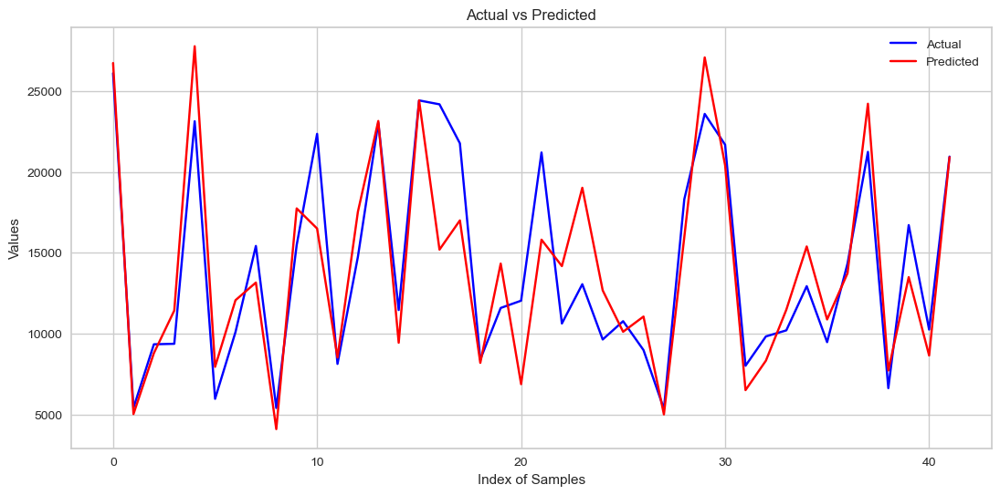

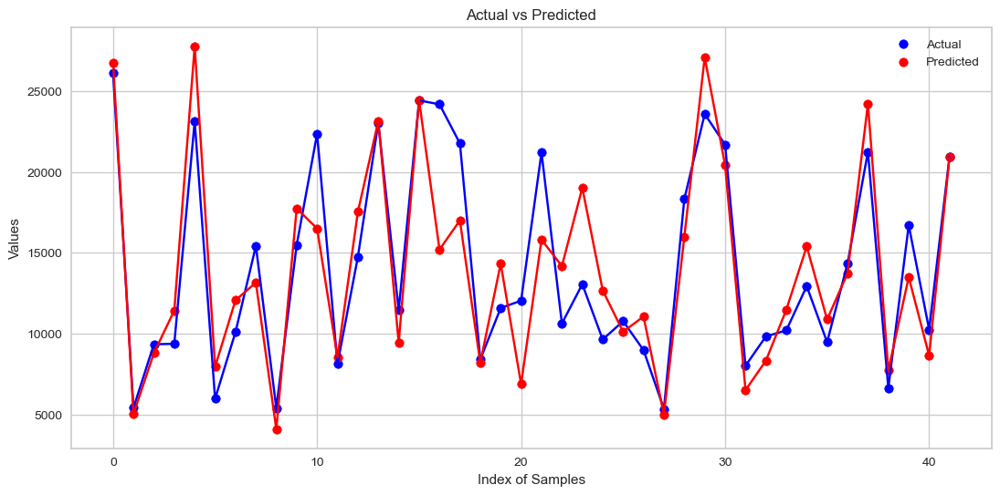


Residuals Scatter Plot:


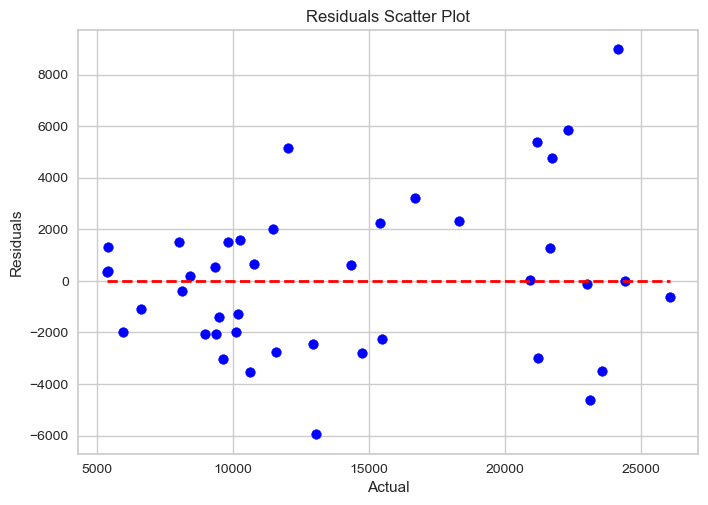


Residuals Histogram:


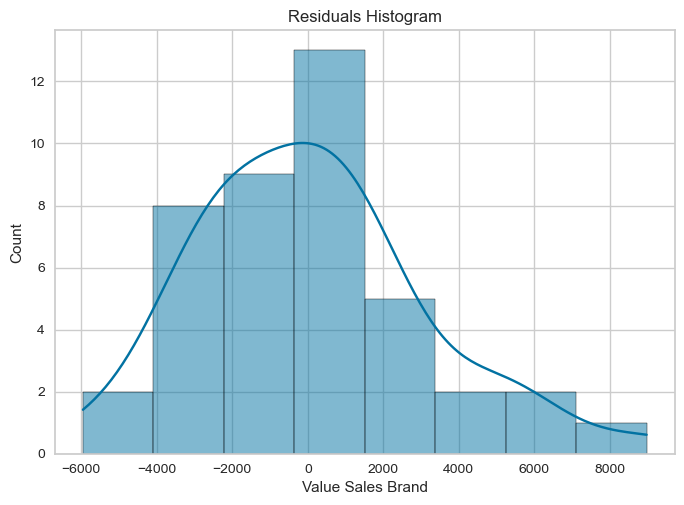

In [450]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['Meta Influencers Tiktok', 'OVP Tiktok', 'Google Tiktok', 'Amazon Tiktok'], axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.905
Method:                 Least Squares   F-statistic:                     75.79
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           4.85e-67
Time:                        00:27:47   Log-Likelihood:                -1484.0
No. Observations:                 166   AIC:                             3012.
Df Residuals:                     144   BIC:                             3080.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

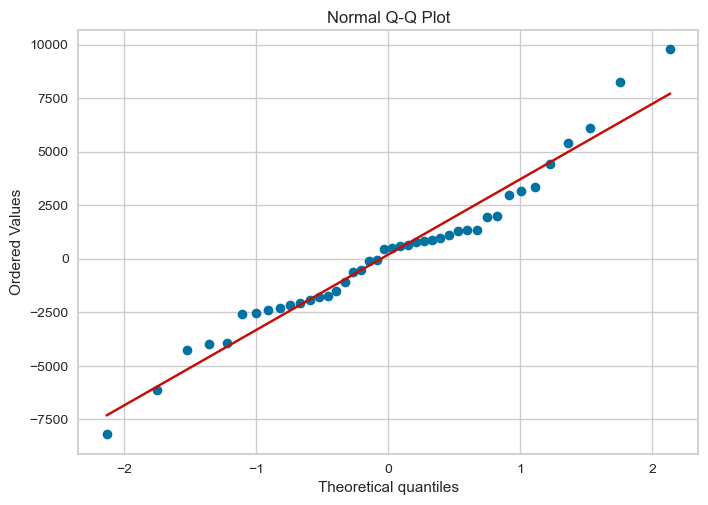


Actual vs Predicted:


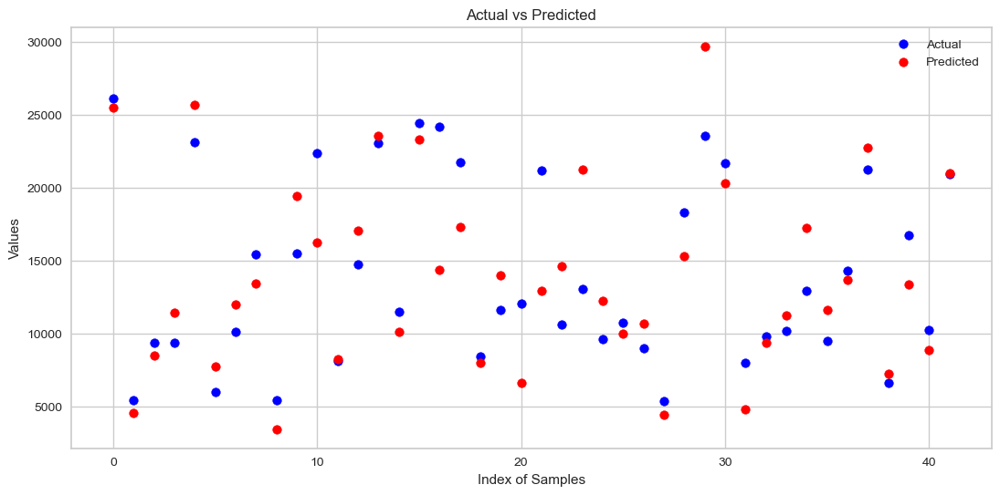

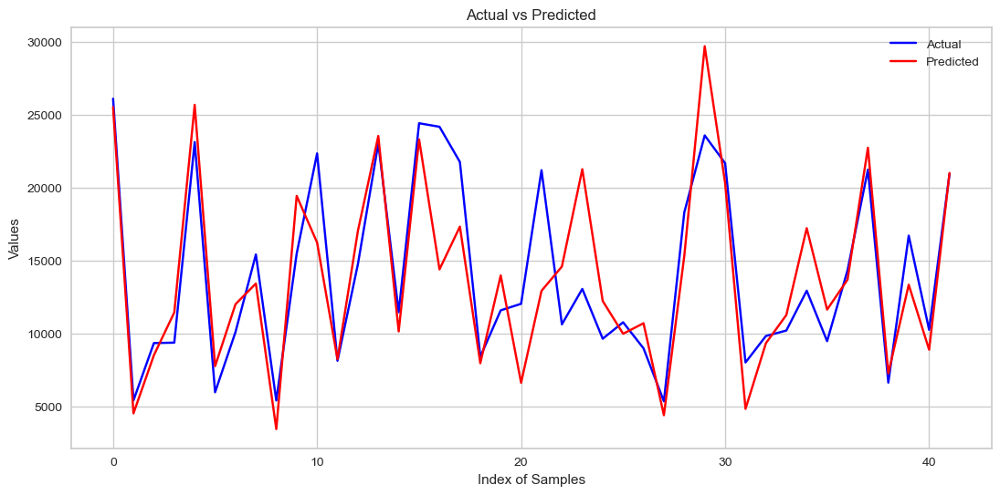

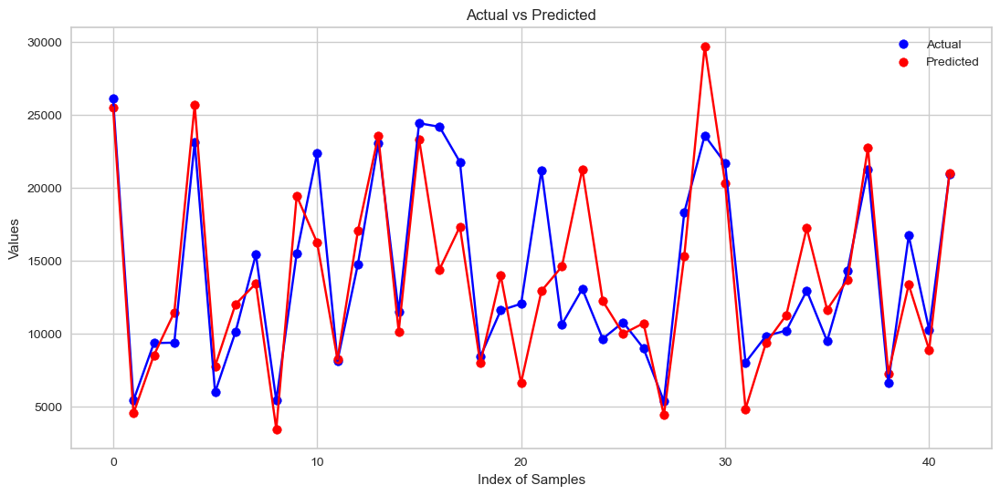


Residuals Scatter Plot:


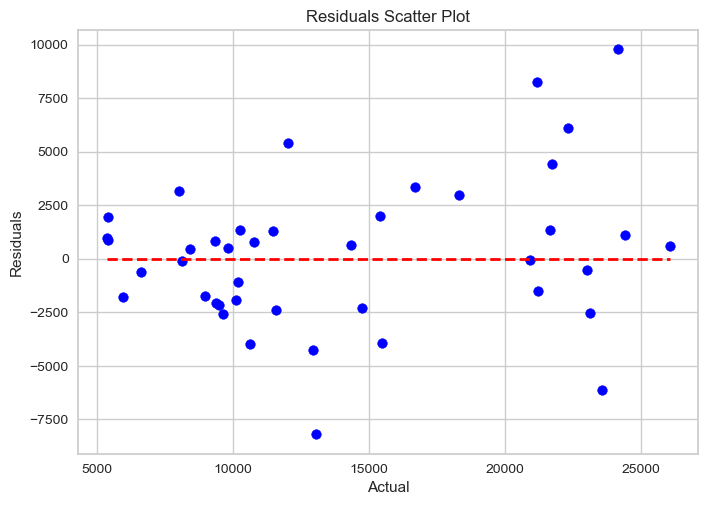


Residuals Histogram:


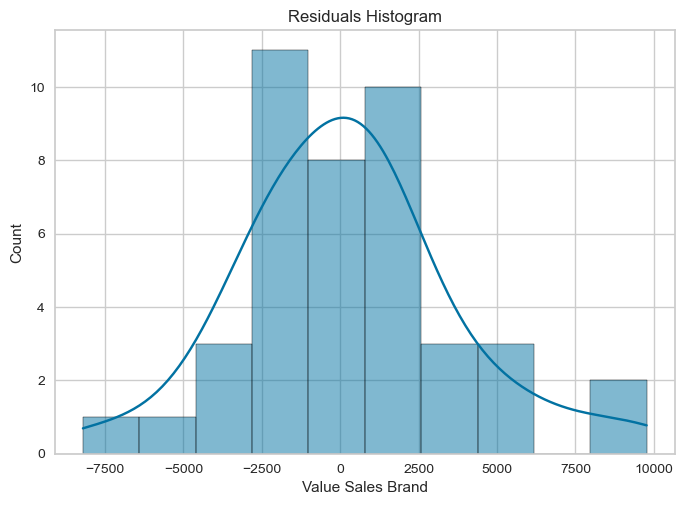

In [451]:
# Assuming dframe1 is your dataframe
X6_copy = X5_copy.drop(['Negative Opinions',
    'NUMBER OF INFLUENCERS INVOLVED_log_lag_halo',
    'Meta Amazon',
    'YouTube Google',
    'Amazon Google',
    'OVP Amazon',
    'TikTok Twitch',
    'YouTube Influencers Tiktok',
    'Amazon Influencers Tiktok',
    'YouTube Meta',
    'TikTok Influencers Tiktok',
    'OVP Influencers Tiktok',
    'Tiktok Influencers Instagram',
    'YouTube Twitch',
    'Meta Twitch'], axis = 1)
y6_copy = y5_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X6_copy, y6_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

### TV + Digital feature importance

In [453]:
brand.columns

Index(['YEAR', 'N WEEK', 'Week starting sell-out', 'Value Sales Brand',
       'INVESTMENTS TV', 'Volume Sales Brand', 'Brand Sales Value',
       'Brand Sales Volume', 'tv_grp', 'ROI'],
      dtype='object')

In [454]:
brand.fillna(0)

,YEAR,N WEEK,Week starting sell-out,Value Sales Brand,INVESTMENTS TV,Volume Sales Brand,Brand Sales Value,Brand Sales Volume,tv_grp,ROI
0,2020,1,2020-01-05,10121.342133,32.488681,740.730899,511.078045,37.403271,298.069364,15.730957
2,2020,3,2020-01-19,9687.164515,34.212849,708.955590,489.154209,35.798774,190.645469,14.297383
3,2020,4,2020-01-26,10229.404469,32.304021,743.303881,516.534662,37.533194,180.655469,15.989795
23,2020,24,2020-06-14,8617.386878,100.000000,620.196004,435.135695,31.316851,376.799170,4.351357
24,2020,25,2020-06-21,11341.415921,89.330050,813.587704,572.685777,41.082181,267.287854,6.410897
25,2020,26,2020-06-28,10780.817217,6.800317,775.292965,544.378297,39.148485,142.302000,80.051899
26,2020,27,2020-07-05,11160.889958,23.584405,800.022327,563.570103,40.397196,149.673000,23.895880
51,2020,52,2020-12-27,8519.228501,15.019454,630.235666,430.179179,31.823804,274.690000,28.641466
52,2021,1,2021-01-03,12123.894505,49.557035,870.636588,612.197100,43.962870,370.050000,12.353384
54,2021,3,2021-01-17,14857.929516,49.187773,1105.597867,750.252434,55.827260,292.380000,15.252824


In [455]:
digital_invest.columns

Index(['INV YOUTUBE', 'INV OTHER VIDEO PUBLISHERS', 'INV SOCIAL META',
       'INV GOOGLE SEARCH', 'INV AMAZON SEARCH', 'INVESTMENT TIKTOK',
       'INVESTMENT TWITCH', 'INVESTMENT INFLUENCER MARKETING TIKTOK',
       'INVESTMENT INFLUENCER MARKETING INSTAGRAM', 'Digital Value'],
      dtype='object')

In [456]:
digital_invest['TV Value'] = brand['Brand Sales Value']

/var/folders/f0/nc46h10539q_2c9xxx6pctt00000gn/T/ipykernel_69843/2364435336.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  digital_invest['TV Value'] = brand['Brand Sales Value']


In [457]:
digital_invest['INVESTMENTS TV'] = brand['INVESTMENTS TV']

/var/folders/f0/nc46h10539q_2c9xxx6pctt00000gn/T/ipykernel_69843/2161622782.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  digital_invest['INVESTMENTS TV'] = brand['INVESTMENTS TV']


In [458]:
digital_invest['TV+Digital Values'] = digital_invest['INVESTMENTS TV'] + digital_invest['Digital Value']

/var/folders/f0/nc46h10539q_2c9xxx6pctt00000gn/T/ipykernel_69843/2567645865.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  digital_invest['TV+Digital Values'] = digital_invest['INVESTMENTS TV'] + digital_invest['Digital Value']


In [459]:
digital_invest = digital_invest.fillna(0)

In [460]:
digital_invest.columns

Index(['INV YOUTUBE', 'INV OTHER VIDEO PUBLISHERS', 'INV SOCIAL META',
       'INV GOOGLE SEARCH', 'INV AMAZON SEARCH', 'INVESTMENT TIKTOK',
       'INVESTMENT TWITCH', 'INVESTMENT INFLUENCER MARKETING TIKTOK',
       'INVESTMENT INFLUENCER MARKETING INSTAGRAM', 'Digital Value',
       'TV Value', 'INVESTMENTS TV', 'TV+Digital Values'],
      dtype='object')

In [461]:
import matplotlib.pyplot as plt
import numpy as np

def plot_feature_importance(feature_importance, feature_names, title):
    """ Helper function to plot feature importance """
    # Сортируем имена признаков по алфавиту
    sorted_idx = np.argsort(feature_names)
    
    # Сортируем имена признаков и важности в соответствии с алфавитным порядком
    sorted_feature_names = np.array(feature_names)[sorted_idx]
    sorted_feature_importance = feature_importance[sorted_idx]
    
    plt.figure(figsize=(15, 12))
    bars = plt.barh(sorted_feature_names, sorted_feature_importance, color='skyblue')
    
    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Features", fontsize=14)
    plt.title(title, fontsize=18)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    # Добавляем значение в конце каждого столбца
    for bar in bars:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height() / 2,
                 f'{width:.2f}',  # Форматирование числа до двух знаков после запятой
                 ha='left', va='center', fontsize=12)
    
    plt.tight_layout()
    plt.show()



def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5,
                       include_interactions: bool = False, degree: int = 2):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    and return the final model, predictions, R2 scores, and feature importance.
    """

    model = None
    y_pred = None
    y_train_pred = None
    feature_importance = None
    original_feature_importance = None
    interaction_feature_importance = None

    if include_interactions:
        # Initialize the PolynomialFeatures transformer for interaction terms only
        poly = PolynomialFeatures(degree=degree, interaction_only=True, include_bias=False)

        # Generate interaction features
        X_train_interactions = pd.DataFrame(
            poly.fit_transform(X_train),
            columns=poly.get_feature_names_out(X_train.columns),
            index=X_train.index
        )
        X_test_interactions = pd.DataFrame(
            poly.transform(X_test),
            columns=poly.get_feature_names_out(X_test.columns),
            index=X_test.index
        )

        # Separate original features and interaction features
        original_feature_names = X_train.columns
        interaction_feature_names = [name for name in X_train_interactions.columns if name not in original_feature_names]
        
        X_train_combined = pd.concat([X_train, X_train_interactions[interaction_feature_names]], axis=1)
        X_test_combined = pd.concat([X_test, X_test_interactions[interaction_feature_names]], axis=1)

        X_train = X_train_combined
        X_test = X_test_combined

    # Standardize features if needed
    if model_type in ['BayesianRidge', 'Lasso', 'Ridge', 'SVR', 'AdaBoost']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Ensure the indices are aligned
        y_train_aligned = y_train.loc[X_train_const.index]

        # Fit the model
        model = sm.OLS(y_train_aligned, X_train_const).fit()
        y_pred = model.predict(X_test_const)
        y_train_pred = model.predict(X_train_const)
        
        # Get coefficients as feature importance
        feature_importance = np.abs(model.params[1:])  # Exclude the constant

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.coef_)

    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'max_features': ['auto', 'sqrt', 'log2'],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'GBM':
        model = GradientBoostingRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.05],
                'max_depth': [3, 5, 7],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'XGBoost':
        model = XGBRegressor()
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [100, 500, 1000],
                'learning_rate': [0.01, 0.1, 0.2],
                'max_depth': [3, 5, 7],
            }
            grid = RandomizedSearchCV(model, param_grid, cv=cv, n_iter=10, random_state=42)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)

        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        explainer = shap.Explainer(model, X_train)
        shap_values = explainer(X_train)
        shap.summary_plot(shap_values, X_train, plot_type="bar")
        feature_importance = shap_values.abs.mean(0).values

        # Plot Partial Dependence if interactions are included
        if include_interactions:
            display = PartialDependenceDisplay.from_estimator(model, X_train, [0, 1])  # Example for first two features
            plt.show()

    elif model_type == 'Lasso':
        lasso = Lasso(alpha=alpha, max_iter=10000)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(lasso, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            lasso = grid.best_estimator_
        else:
            lasso.fit(X_train, y_train)
        
        y_pred = lasso.predict(X_test)
        y_train_pred = lasso.predict(X_train)
        feature_importance = np.abs(lasso.coef_)

    elif model_type == 'Ridge':
        ridge = Ridge(alpha=alpha)
        if tune_hyperparameters:
            param_grid = {'alpha': np.logspace(-5, 5, 100)}
            grid = GridSearchCV(ridge, param_grid, cv=cv, scoring='r2')
            grid.fit(X_train, y_train)
            ridge = grid.best_estimator_
        else:
            ridge.fit(X_train, y_train)
        
        y_pred = ridge.predict(X_test)
        y_train_pred = ridge.predict(X_train)
        feature_importance = np.abs(ridge.coef_)

    elif model_type == 'SVR':
        model = SVR(kernel='rbf')
        if tune_hyperparameters:
            param_grid = {
                'C': [0.1, 1, 10, 100],
                'gamma': ['scale', 'auto'],
                'epsilon': [0.01, 0.1, 0.2],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = np.abs(model.dual_coef_).flatten()  # SVR does not have traditional feature importances

    elif model_type == 'AdaBoost':
        model = AdaBoostRegressor(n_estimators=100)
        if tune_hyperparameters:
            param_grid = {
                'n_estimators': [50, 100, 500],
                'learning_rate': [0.01, 0.1, 0.5, 1.0],
            }
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
        feature_importance = model.feature_importances_

    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    # Separate feature importances into original and interaction features
    if include_interactions:
        original_feature_importance = feature_importance[:len(original_feature_names)]
        interaction_feature_importance = feature_importance[len(original_feature_names):]
        
        # Plot feature importance for original features
        plot_feature_importance(original_feature_importance, original_feature_names, "Feature Importance for Original Features")
        
        # Plot feature importance for interaction features
        plot_feature_importance(interaction_feature_importance, interaction_feature_names, "Feature Importance for Interaction Features")
    else:
        # Plot all features together if no interactions are used
        plot_feature_importance(feature_importance, X_train.columns, f"Feature Importance for {model_type}")

    return model, y_pred, r2_train, r2_test, feature_importance


R2 Score (Train): 0.9323601607198516
R2 Score (Test): 0.9023955791907268


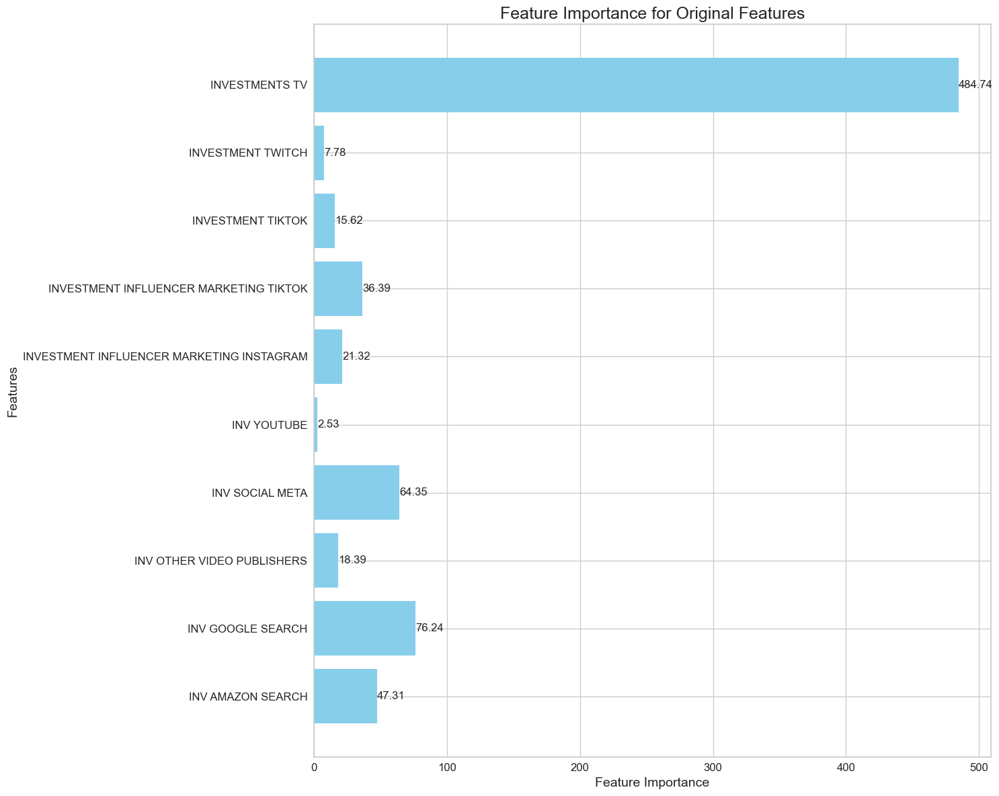

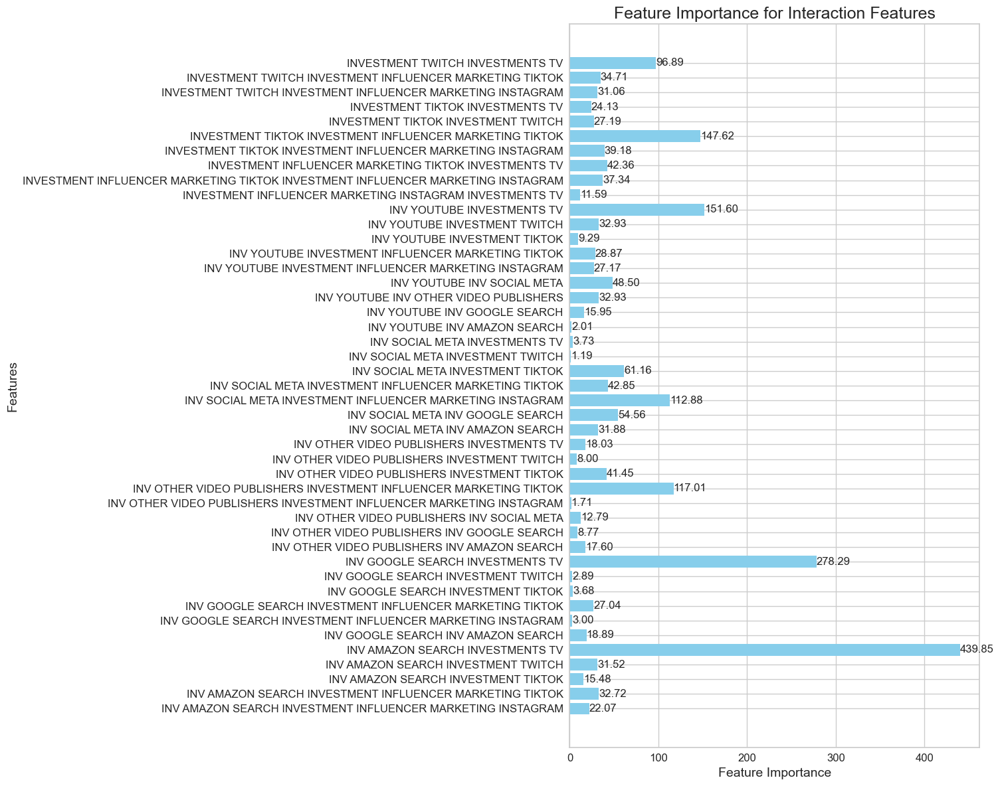

In [462]:
X = digital_invest.drop(['Digital Value', 'TV+Digital Values', 'TV Value'], axis=1)
y = digital_invest['TV+Digital Values']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model_bayes, y_pred_bayes, r2_train_bayes, r2_test_bayes, feature_importance_bayes = perform_regression(
    X_train, X_test, y_train, 
    model_type='BayesianRidge', 
    tune_hyperparameters=False, 
    include_interactions=True, 
    degree=2
)

In [463]:
import pandas as pd
import numpy as np
from sklearn.linear_model import BayesianRidge, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.exceptions import ConvergenceWarning
import warnings
from yellowbrick.regressor import ResidualsPlot

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Define the regression function
def perform_regression(X_train: pd.DataFrame, X_test: pd.DataFrame, y_train: pd.Series, 
                       model_type: str = 'OLS', simple: bool = True, alpha: float = 1.0,
                       tune_hyperparameters: bool = False, cv: int = 5, feature_selection: bool = True):
    """
    Perform regression with the specified model type, optionally perform hyperparameter tuning,
    feature selection, and cross-validation, and return the final model and predictions.
    """

    model = None
    y_pred = None
    y_train_pred = None

    # Standardize features if needed
    if model_type in ['BayesianRidge']:
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
        X_train = pd.DataFrame(X_train_scaled, index=X_train.index, columns=X_train.columns)
        X_test = pd.DataFrame(X_test_scaled, index=X_test.index, columns=X_test.columns)

    if model_type == 'OLS':
        # Add a constant to the features for OLS regression
        X_train_const = sm.add_constant(X_train)
        X_test_const = sm.add_constant(X_test)

        # Initialize and fit the model
        model = sm.OLS(y_train, X_train_const)
        results = model.fit()
        y_pred = results.predict(X_test_const)
        y_train_pred = results.predict(X_train_const)

        # Print the summary
        if simple:
            print(results.summary())
        else:
            # Get the p-values of the features
            p_values = results.pvalues

            # Get the features with p-value less than 0.05
            significant_features = p_values[p_values < 0.05].index

            # Perform regression again with the significant features
            X_train_significant = X_train_const[significant_features]
            X_test_significant = X_test_const[significant_features]

            # Initialize and fit the model
            model = sm.OLS(y_train, X_train_significant)
            results = model.fit()

            # Print the summary
            print(results.summary())

            # Make predictions
            y_pred = results.predict(X_test_significant)
            y_train_pred = results.predict(X_train_significant)

    elif model_type == 'BayesianRidge':
        model = BayesianRidge()
        if tune_hyperparameters:
            param_grid = {'alpha_1': [1e-6, 1e-4, 1e-2, 1e0], 'alpha_2': [1e-6, 1e-4, 1e-2, 1e0]}
            grid = GridSearchCV(model, param_grid, cv=cv)
            grid.fit(X_train, y_train)
            model = grid.best_estimator_
        else:
            model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)

        # Coefficients interpretation
        coef = model.coef_
        selected_features = X_train.columns[np.abs(coef) > 1e-5]
        X_train_selected = sm.add_constant(X_train[selected_features])
        results = sm.OLS(y_train, X_train_selected).fit()
        print(results.summary())
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    # Cross-Validation (Optional)
    if model_type not in ['OLS'] and not simple:
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
        print(f"Cross-Validation R2 Score: {np.mean(cv_scores)} ± {np.std(cv_scores)}")

    # Calculate and print R2 scores
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_pred)
    print(f"R2 Score (Train): {r2_train}")
    print(f"R2 Score (Test): {r2_test}")

    return model, y_pred


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.861
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     33.20
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.12e-47
Time:                        00:27:48   Log-Likelihood:                -1526.6
No. Observations:                 166   AIC:                             3107.
Df Residuals:                     139   BIC:                             3191.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

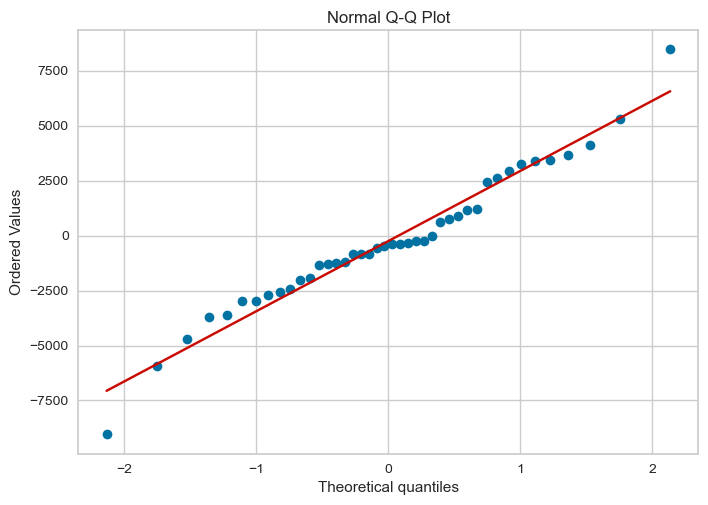


Actual vs Predicted:


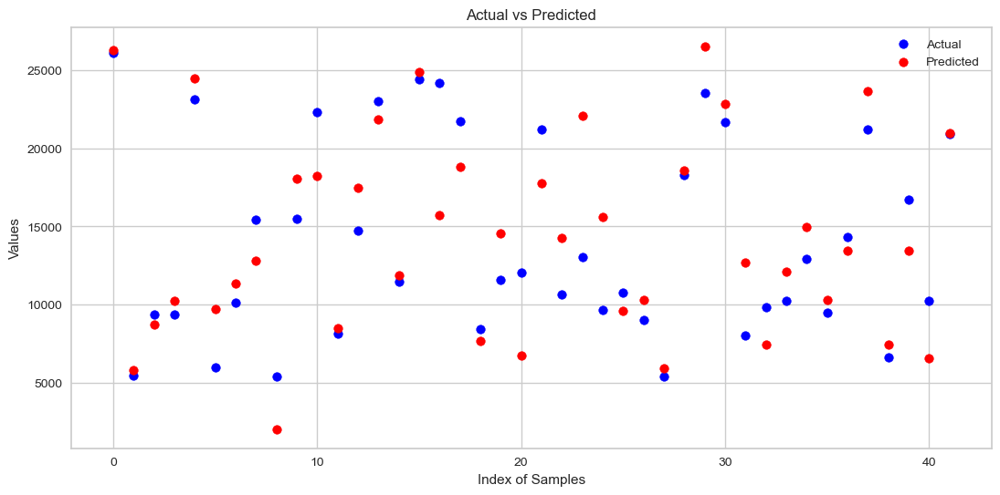

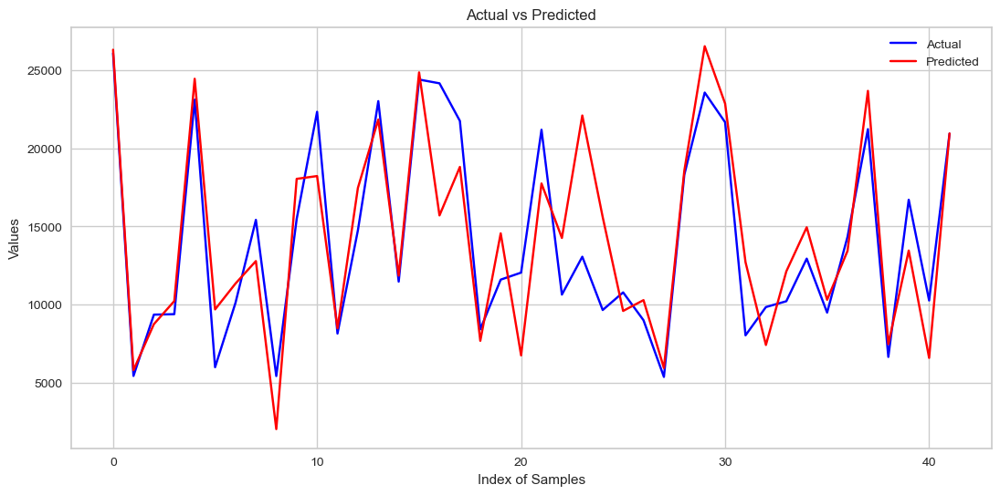

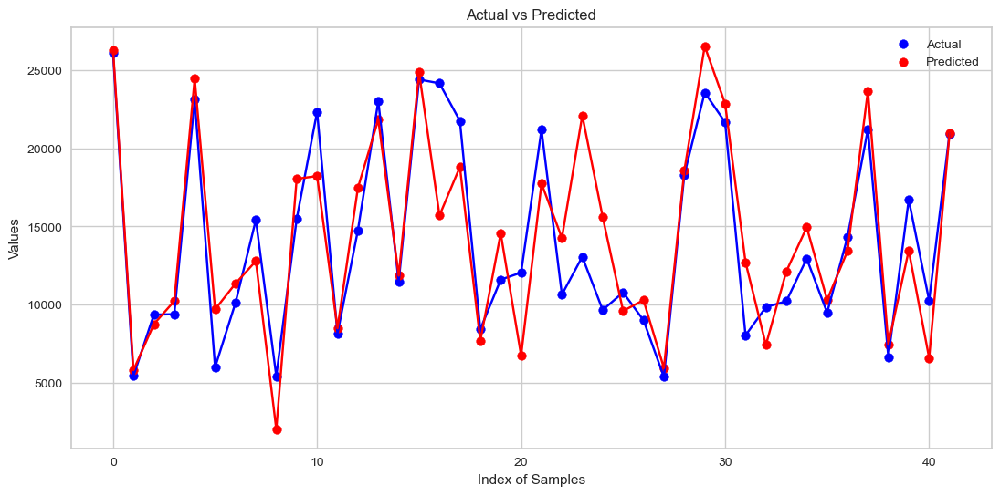


Residuals Scatter Plot:


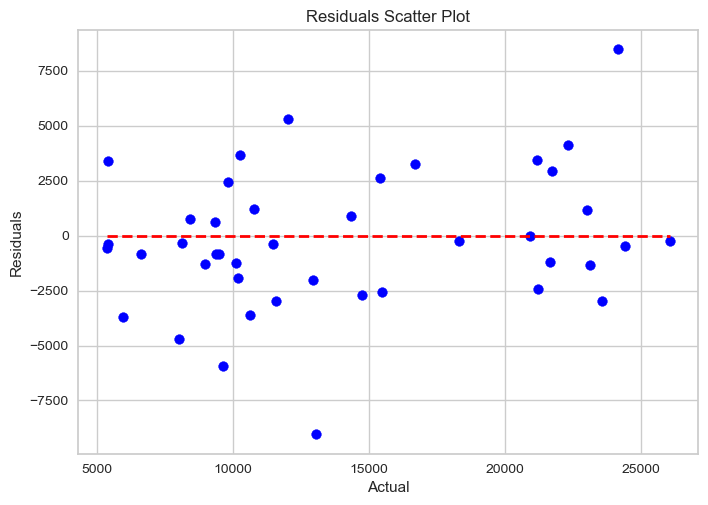


Residuals Histogram:


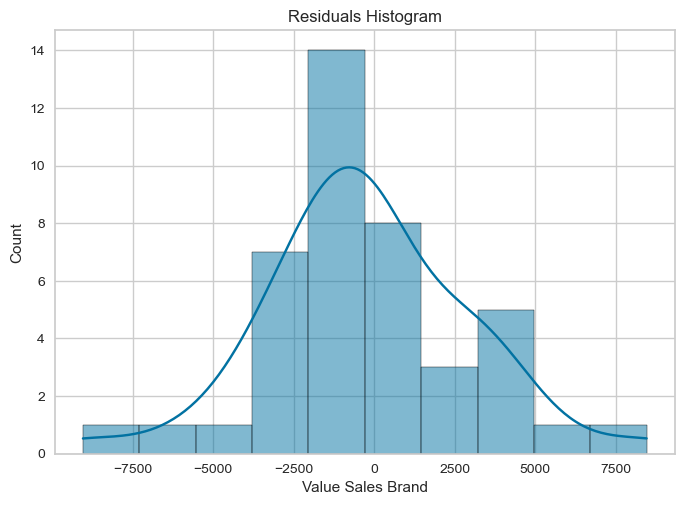

In [464]:
# Assuming dframe1 is your dataframe
X_copy = final_df.drop(['Value Sales Brand'], axis=1)
y_copy = final_df['Value Sales Brand']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_copy, y_copy
                                                    , test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     44.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.60e-51
Time:                        00:27:48   Log-Likelihood:                -1528.1
No. Observations:                 166   AIC:                             3098.
Df Residuals:                     145   BIC:                             3163.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

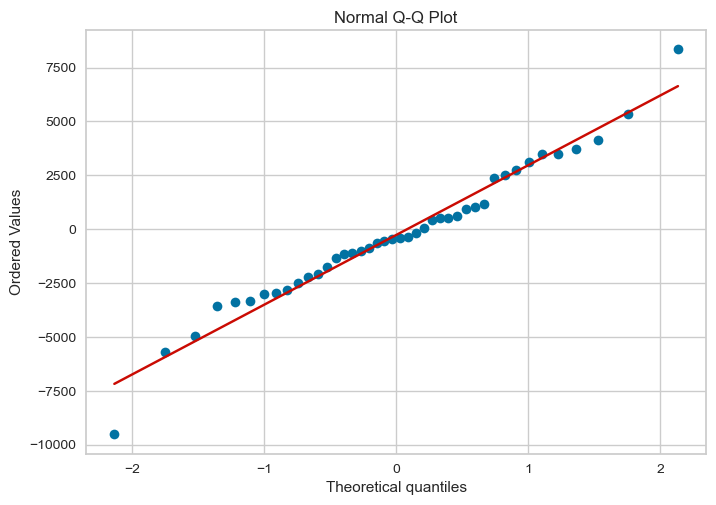


Actual vs Predicted:


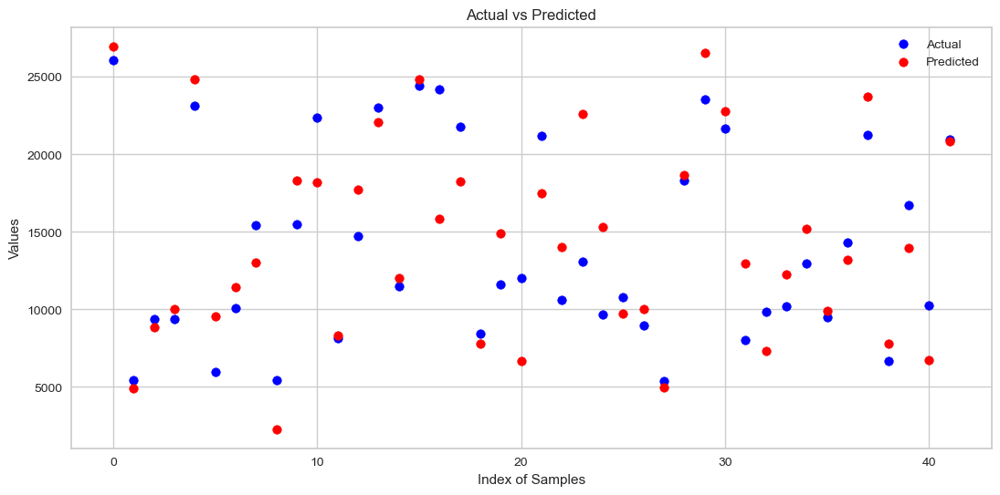

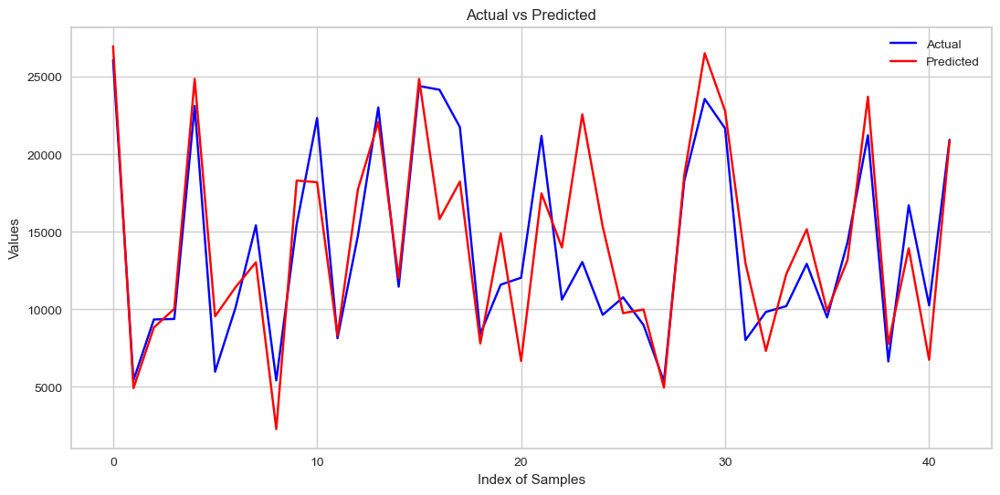

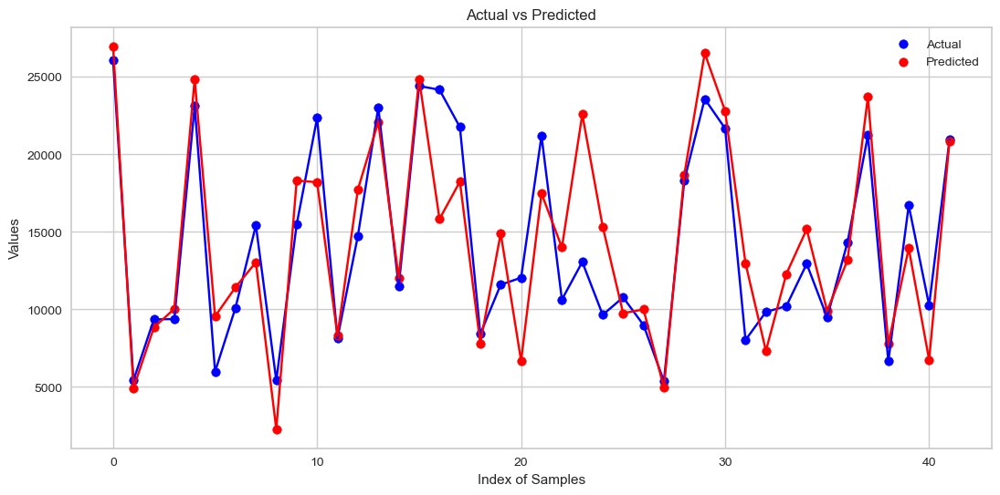


Residuals Scatter Plot:


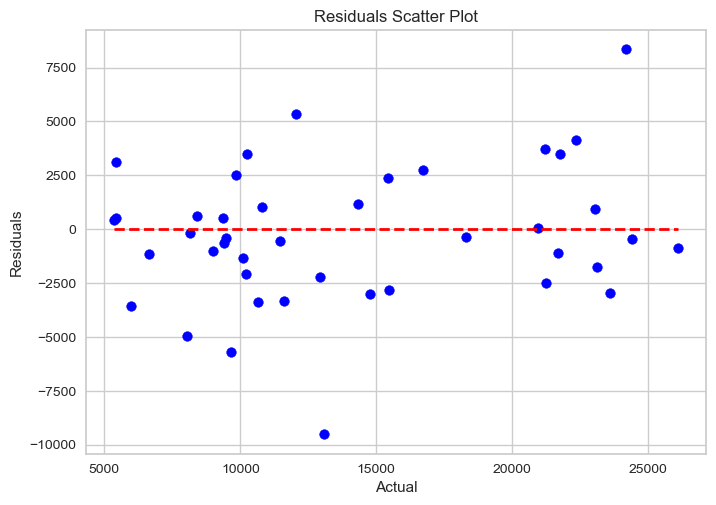


Residuals Histogram:


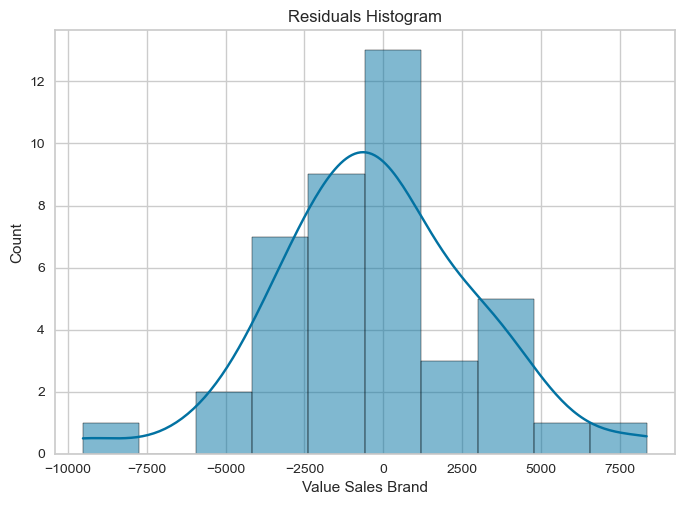

In [465]:
# Assuming dframe1 is your dataframe
X1_copy = X_copy.drop(['Number of Items', 'AVERAGE PRICE MKT', 'competitors_grp', 'total_editors', 'DISTRIBUTED SAMPLES (.000)', 'events_seasonal'], axis=1)
y1_copy = y_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X1_copy, y1_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     61.12
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           8.04e-55
Time:                        00:27:49   Log-Likelihood:                -1533.1
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     151   BIC:                             3143.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

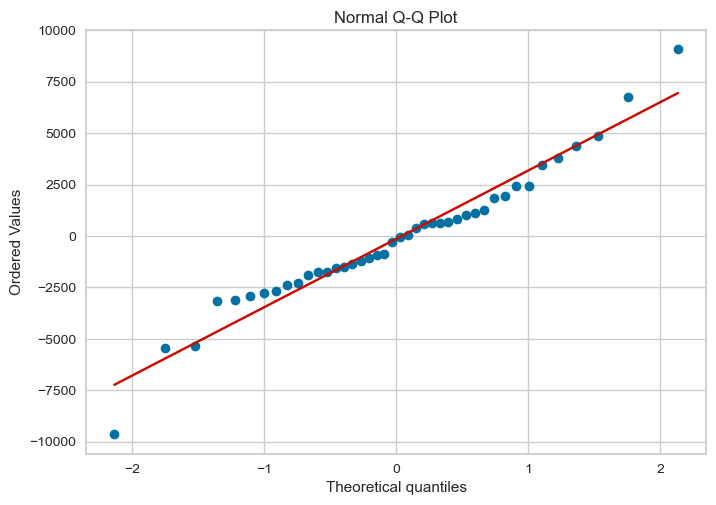


Actual vs Predicted:


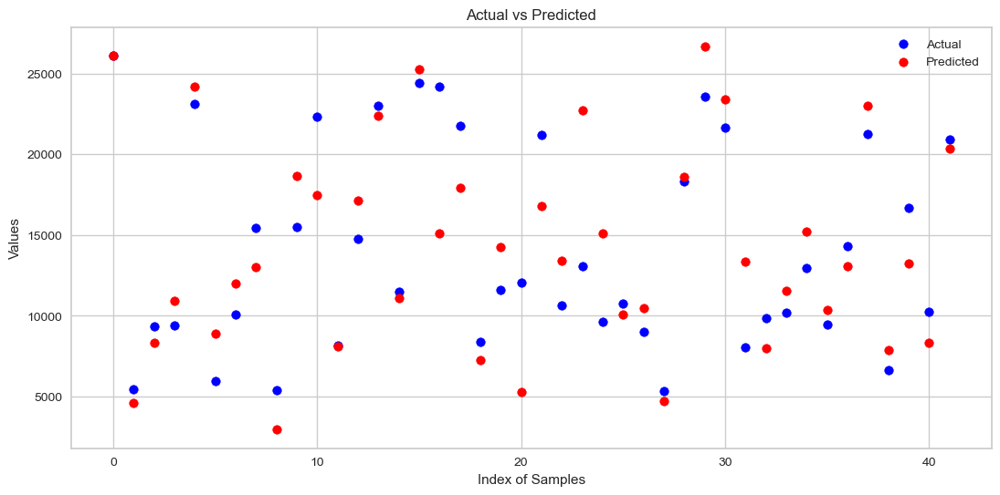

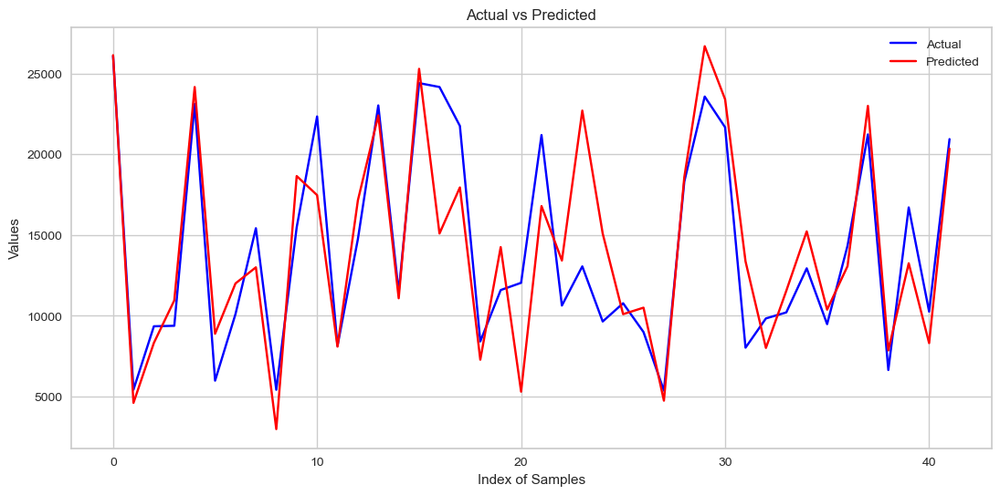

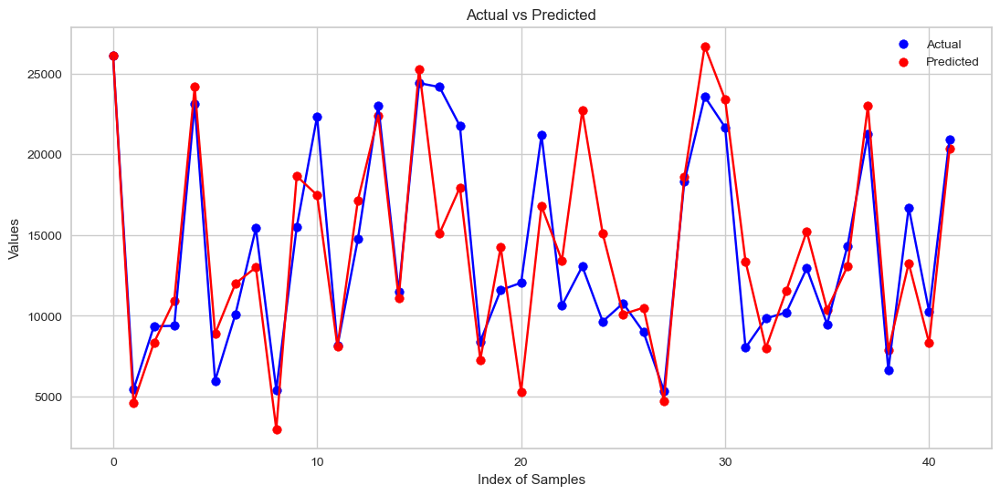


Residuals Scatter Plot:


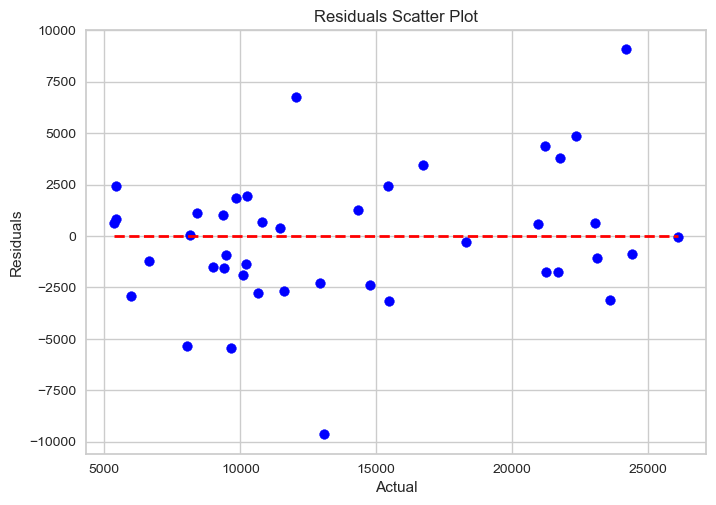


Residuals Histogram:


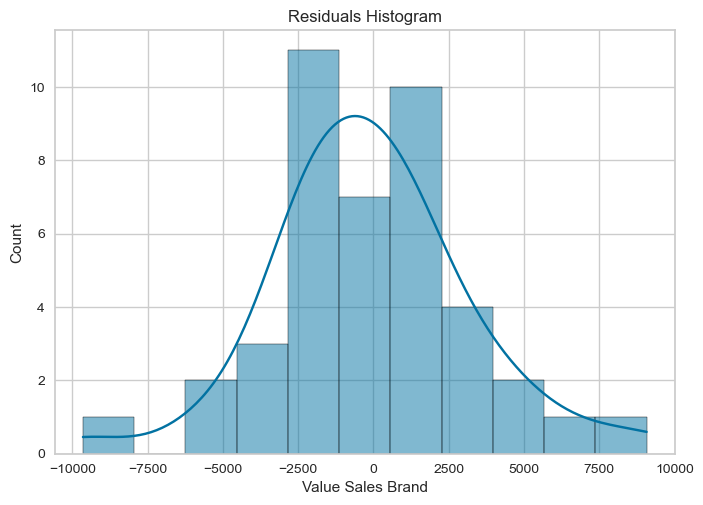

In [466]:
# Assuming dframe1 is your dataframe
X2_copy = X1.drop(['SEASONALITY MARKET', 'total_totem', 'Positive Opinions', 'season_Spring', 
              'Weighted Handling Distribution_lag_halo', 'LOCKDOWN_log_lag_halo'], axis=1)
y2_copy = y1

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X2_copy, y2_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     76.40
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.39e-56
Time:                        00:27:49   Log-Likelihood:                -1535.8
No. Observations:                 166   AIC:                             3096.
Df Residuals:                     154   BIC:                             3133.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

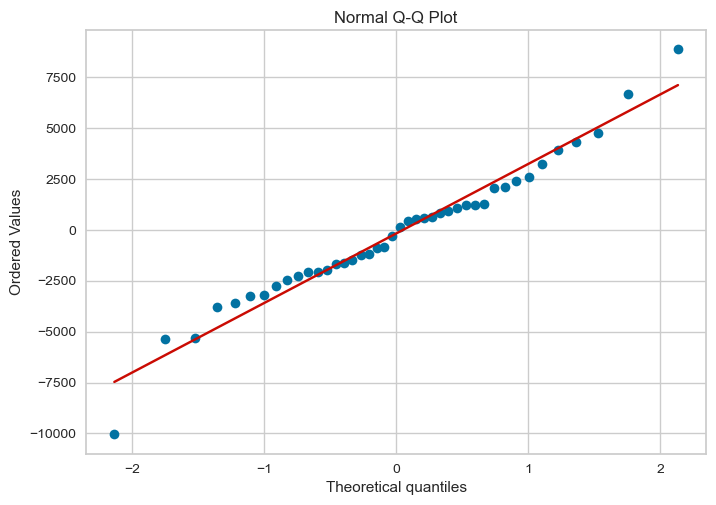


Actual vs Predicted:


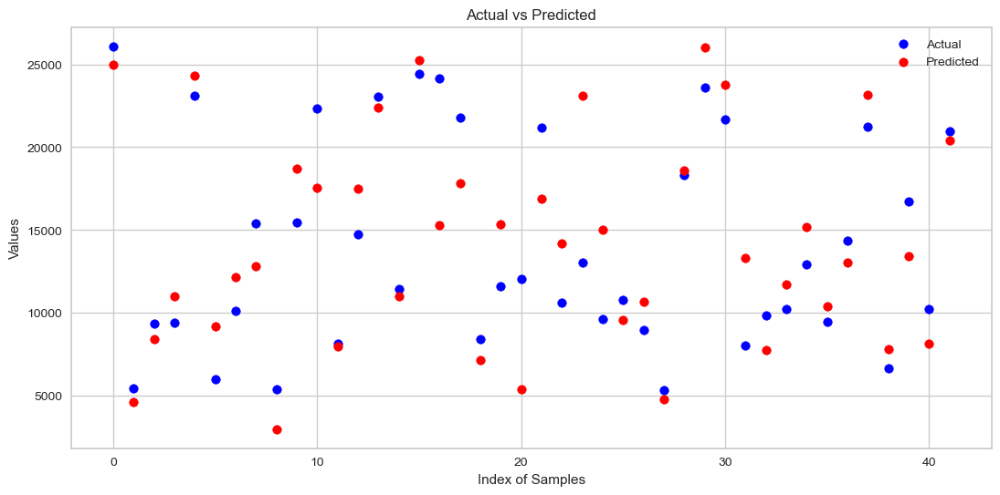

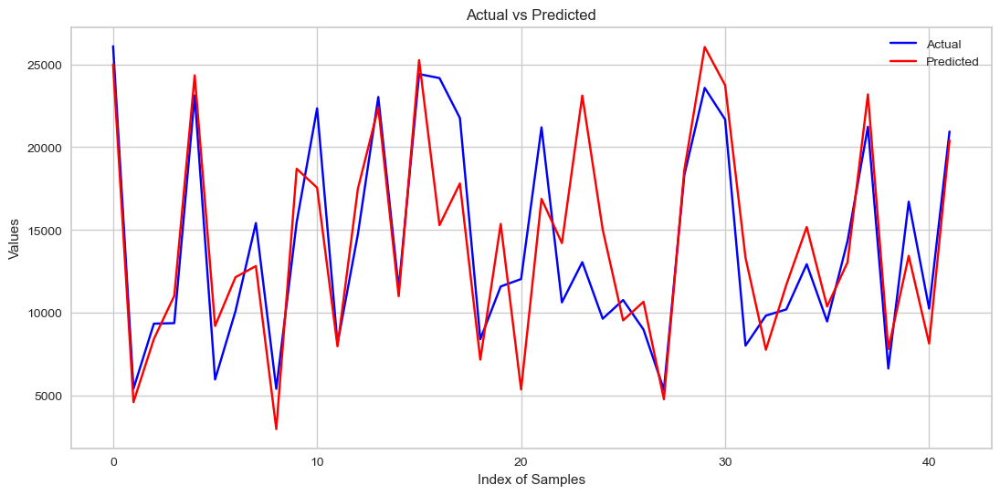

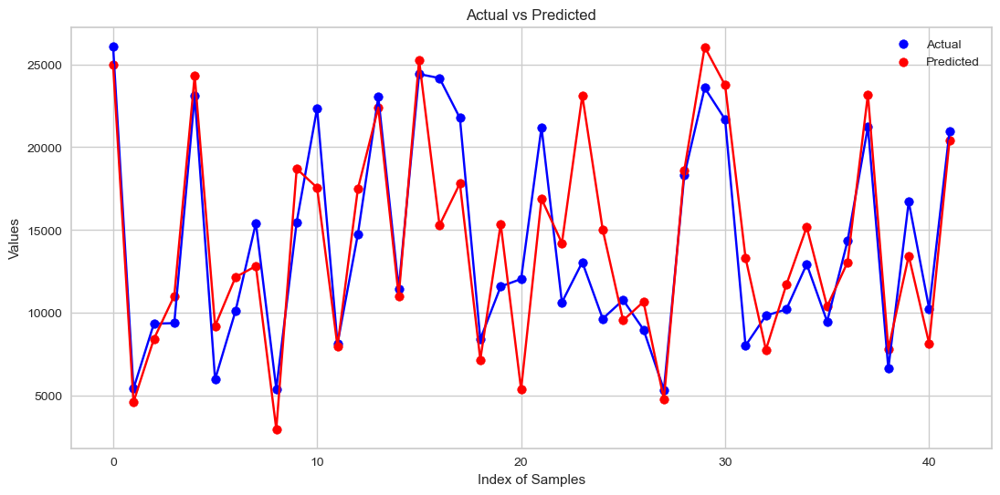


Residuals Scatter Plot:


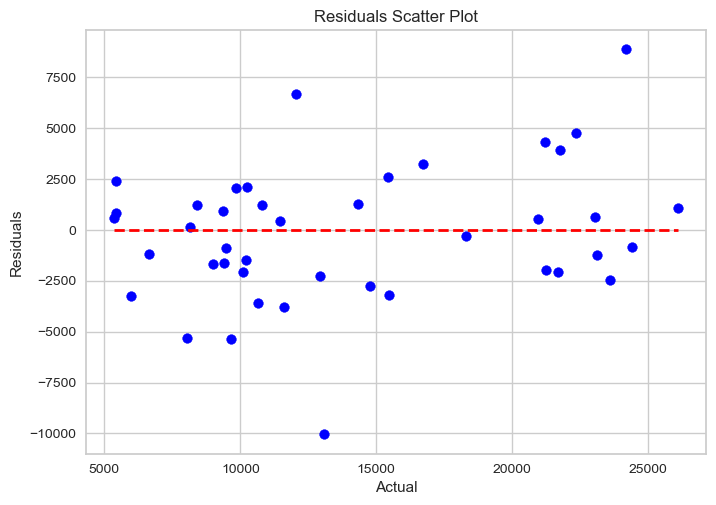


Residuals Histogram:


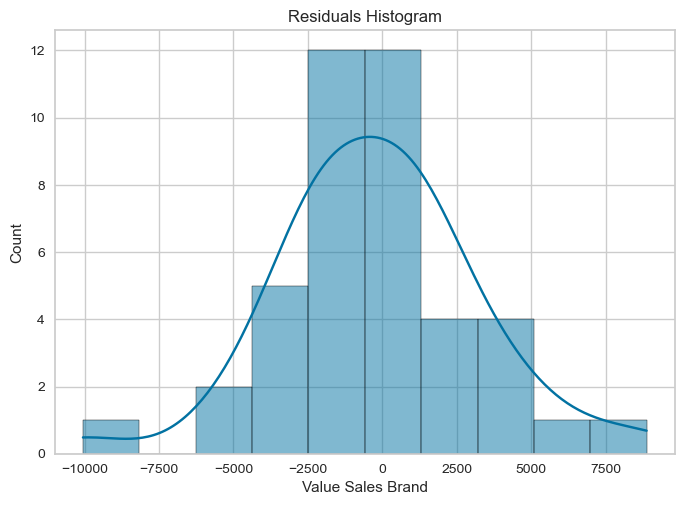

In [467]:
# Assuming dframe1 is your dataframe
X3_copy = X2_copy.drop(['INVESTMENTS PRINT_log_lag_halo', "GRP TV 20''", "GRP TV 10''"], axis=1)
y3_copy = y2_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X3_copy, y3_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [468]:
X3_copy.columns

Index(['AVERAGE PROMO PRICE', 'ONLINE REVIEWS', 'ONLINE RATINGS',
       'Negative Opinions', 'digital_investments', 'Sales Value Growth (%)',
       'season_Summer', 'season_Winter',
       'NUMBER OF INFLUENCERS INVOLVED_log_lag_halo',
       'INVESTMENTS TV_log_lag_halo', 'promo_log_lag_halo'],
      dtype='object')

In [469]:
digital_invest.dtypes

INV YOUTUBE                                  float64
INV OTHER VIDEO PUBLISHERS                   float64
INV SOCIAL META                              float64
INV GOOGLE SEARCH                            float64
INV AMAZON SEARCH                            float64
INVESTMENT TIKTOK                            float64
INVESTMENT TWITCH                            float64
INVESTMENT INFLUENCER MARKETING TIKTOK       float64
INVESTMENT INFLUENCER MARKETING INSTAGRAM    float64
Digital Value                                float64
TV Value                                     float64
INVESTMENTS TV                               float64
TV+Digital Values                            float64
dtype: object

In [470]:
#Top 6 Interactions.
X3_copy['Amazon TV'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENTS TV']
X3_copy['Google TV'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENTS TV']
X3_copy['YouTube TV'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENTS TV']
X3_copy['TikTok Influencers TikTok'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Influencers Instagram'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Influencers TikTok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.855
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     51.20
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           3.63e-53
Time:                        00:27:50   Log-Likelihood:                -1530.5
No. Observations:                 166   AIC:                             3097.
Df Residuals:                     148   BIC:                             3153.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

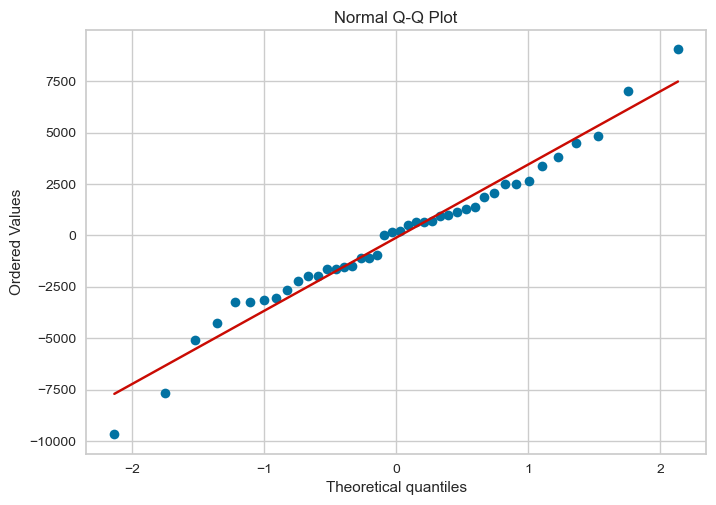


Actual vs Predicted:


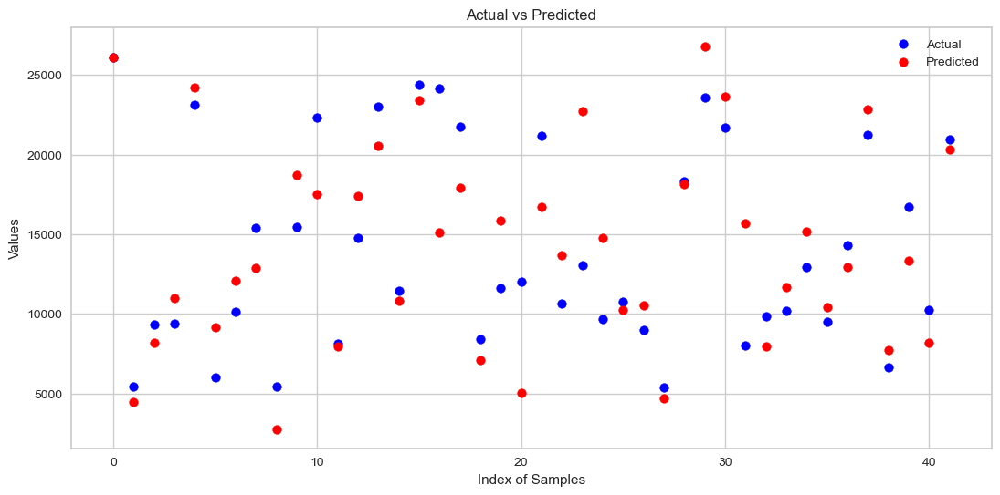

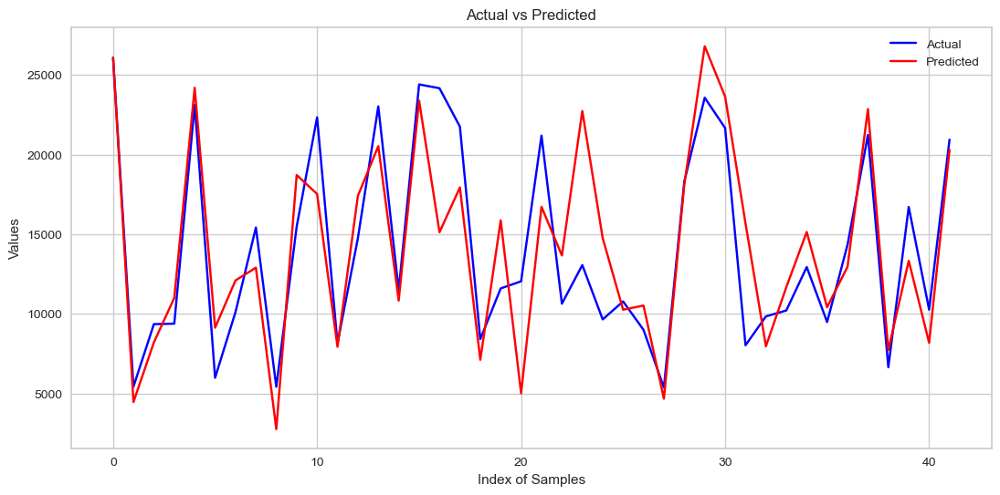

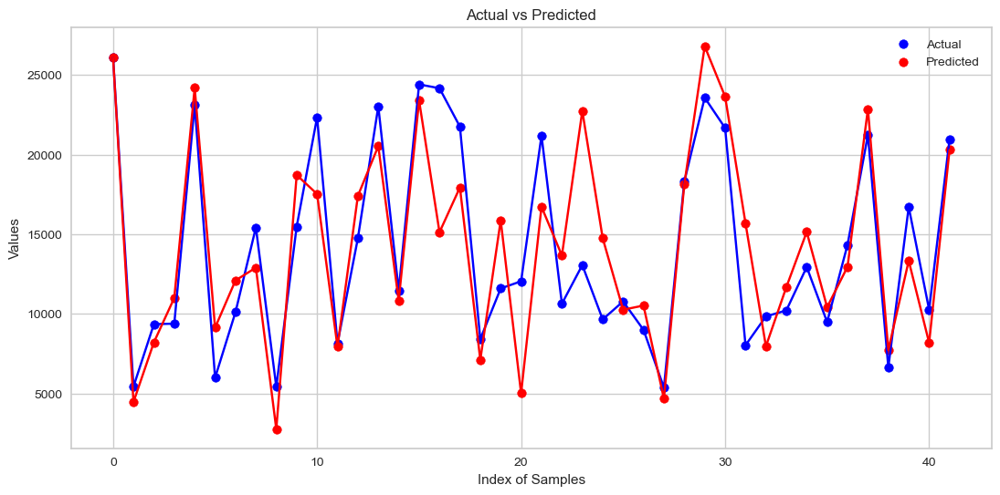


Residuals Scatter Plot:


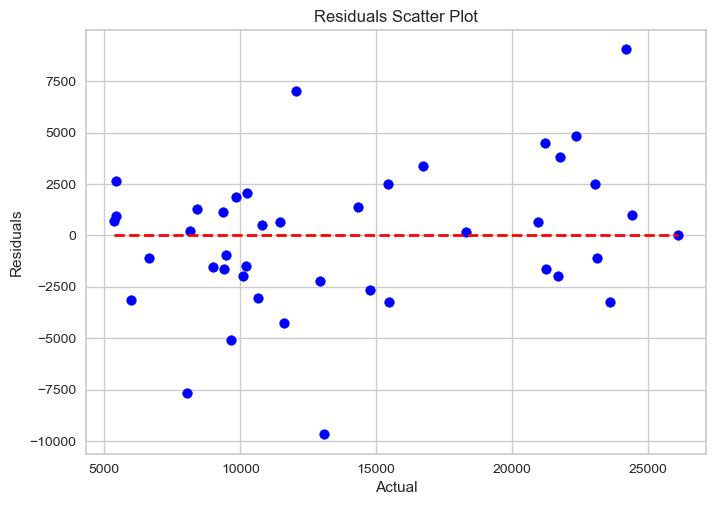


Residuals Histogram:


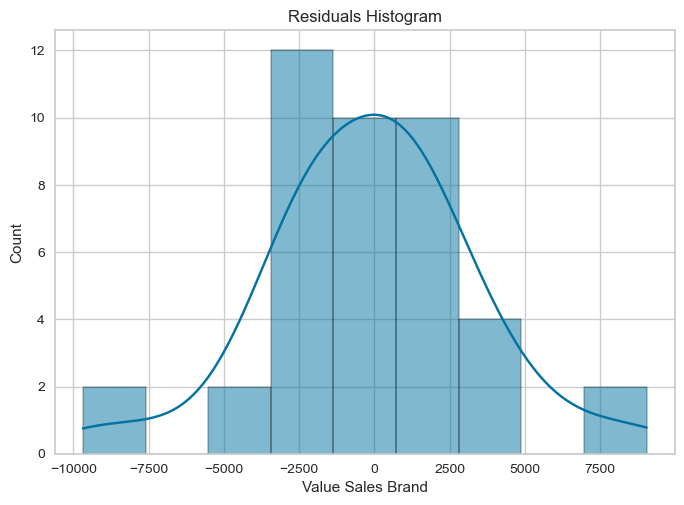

In [471]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.853
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     68.08
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.70e-56
Time:                        00:27:50   Log-Likelihood:                -1531.2
No. Observations:                 166   AIC:                             3090.
Df Residuals:                     152   BIC:                             3134.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

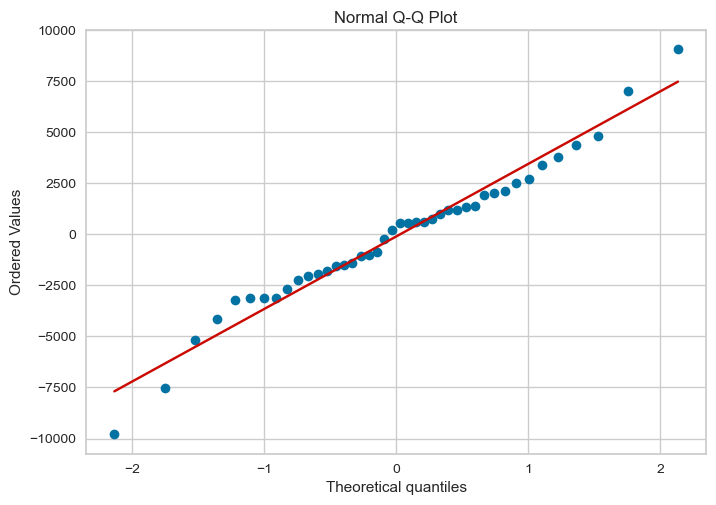


Actual vs Predicted:


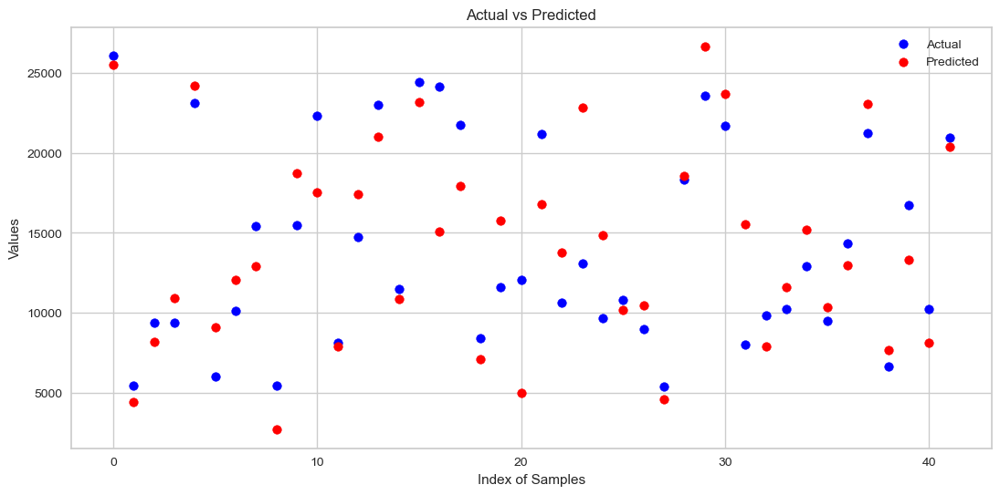

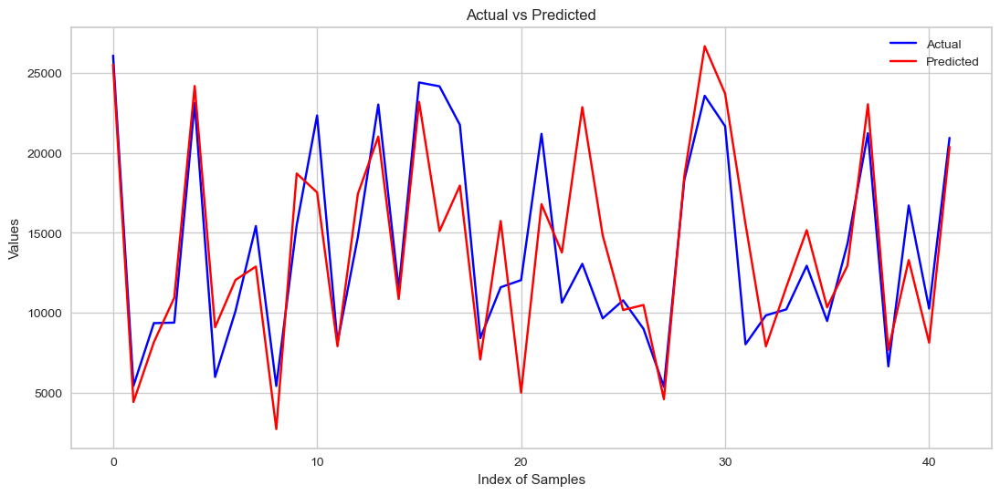

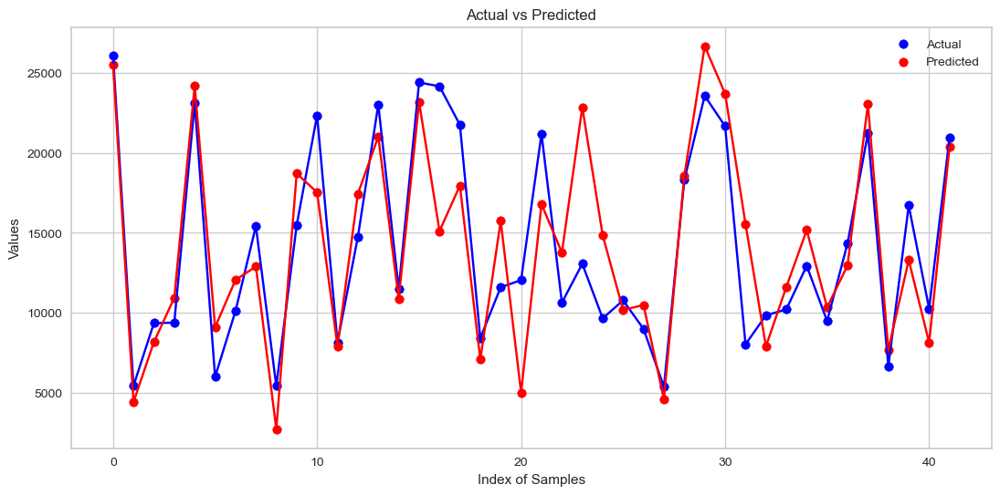


Residuals Scatter Plot:


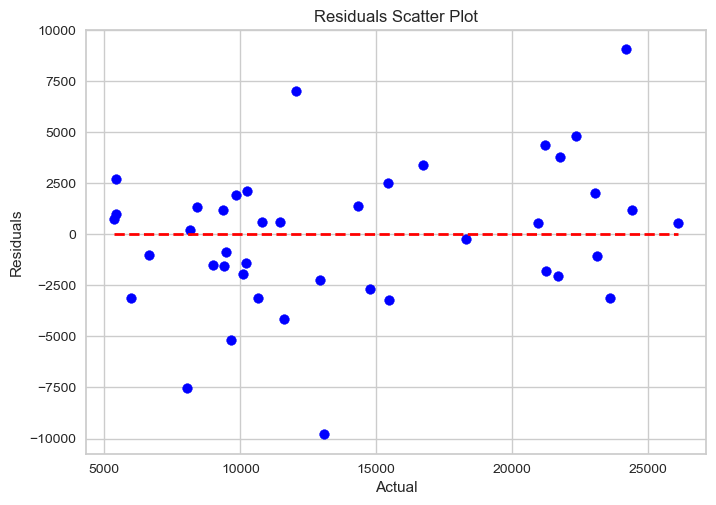


Residuals Histogram:


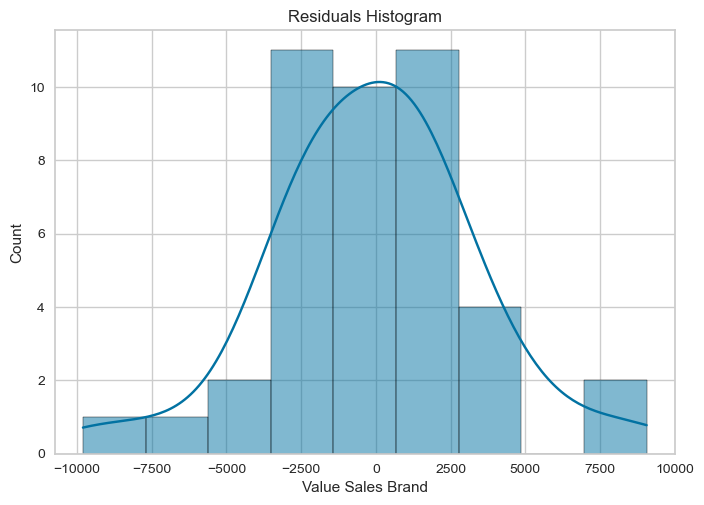

In [472]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['Google TV', 'YouTube TV', 'TikTok Influencers TikTok', 'Meta Influencers Instagram'], axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     72.24
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.12e-56
Time:                        00:27:51   Log-Likelihood:                -1533.1
No. Observations:                 166   AIC:                             3092.
Df Residuals:                     153   BIC:                             3133.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

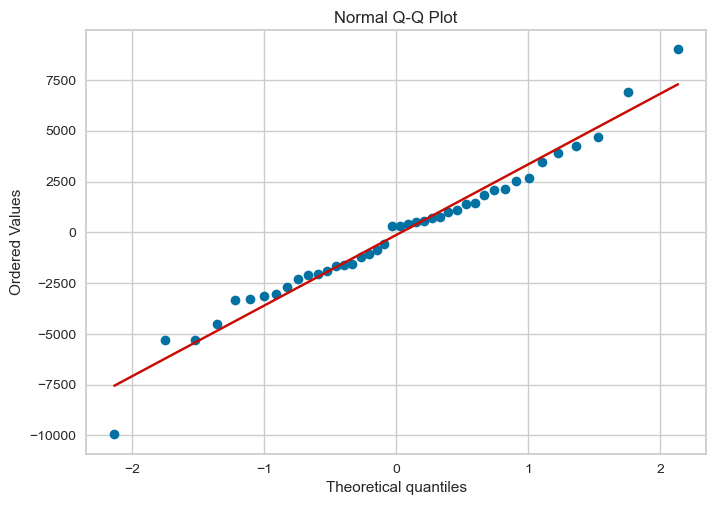


Actual vs Predicted:


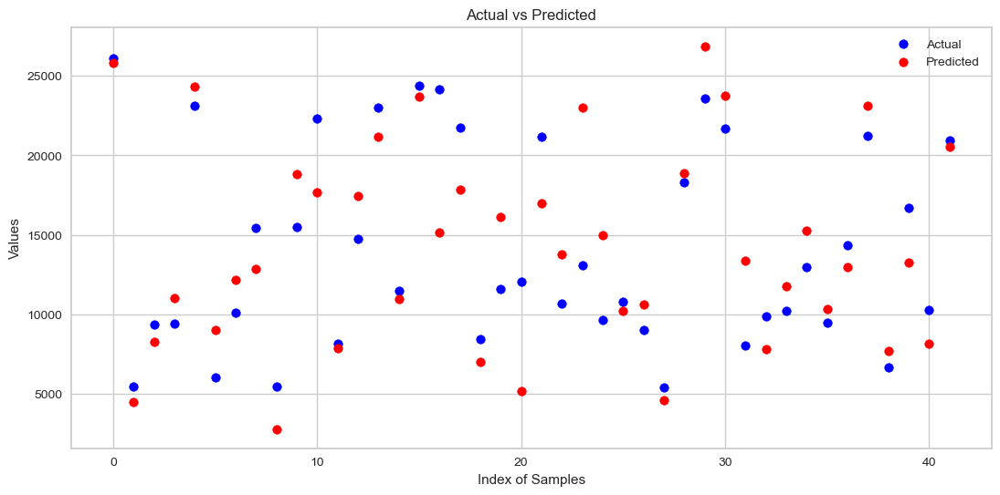

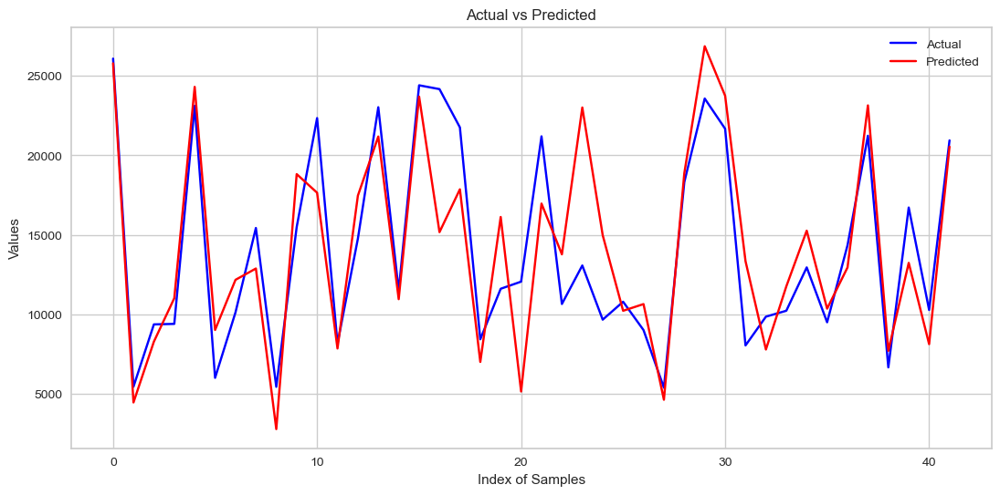

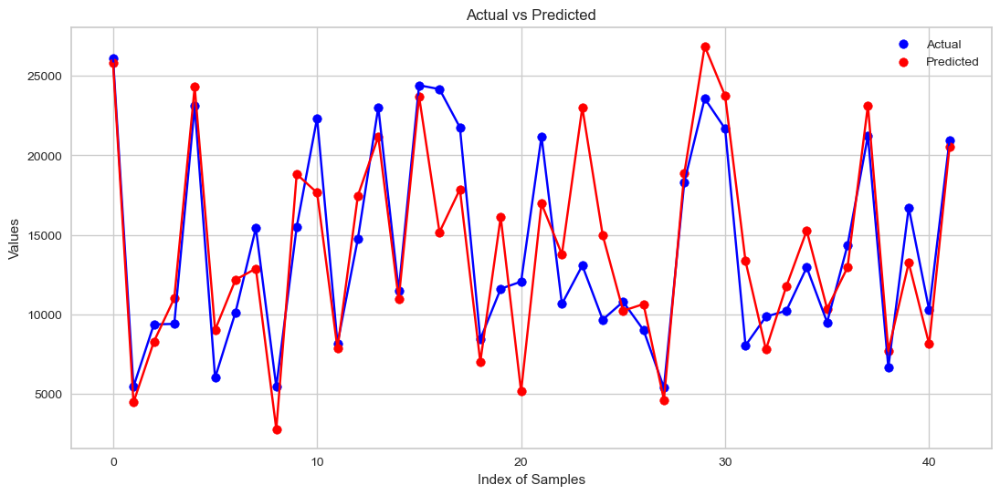


Residuals Scatter Plot:


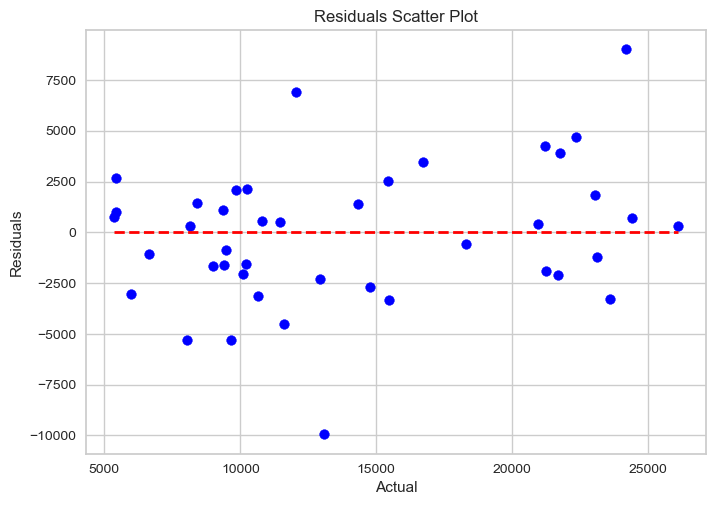


Residuals Histogram:


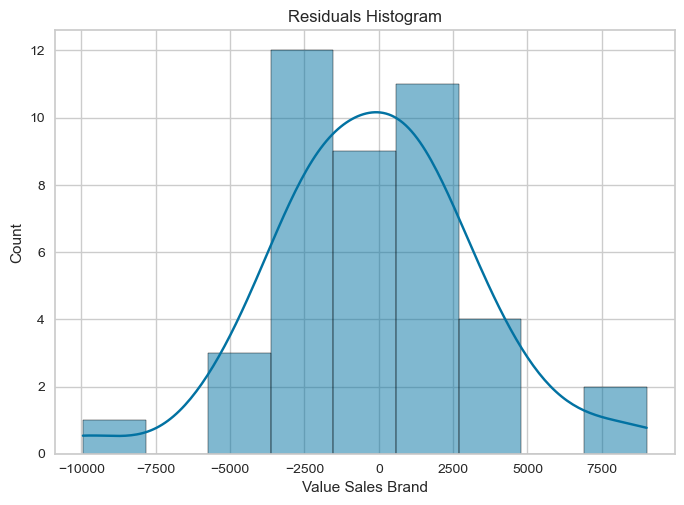

In [473]:
# Assuming dframe1 is your dataframe
X6_copy = X5_copy.drop(['OVP Influencers TikTok'], axis = 1)
y6_copy = y5_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X6_copy, y6_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

In [474]:
#All interactions

In [475]:
# Add the remaining interactions to the existing X3_copy DataFrame

X3_copy['Twitch TV'] = digital_invest['INVESTMENT TWITCH'] * digital_invest['INVESTMENTS TV']
X3_copy['Twitch Influencer TikTok'] = digital_invest['INVESTMENT TWITCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Twitch Influencer Instagram'] = digital_invest['INVESTMENT TWITCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Twitch TikTok TV'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENTS TV']
X3_copy['TikTok Influencer TikTok'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['TikTok Influencer Instagram'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Influencer TikTok TV'] = digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK'] * digital_invest['INVESTMENTS TV']
X3_copy['Influencer TikTok Instagram'] = digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Influencer Instagram TV'] = digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM'] * digital_invest['INVESTMENTS TV']
X3_copy['YouTube Twitch'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT TWITCH']
X3_copy['YouTube TikTok'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['YouTube Influencer TikTok'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['YouTube Influencer Instagram'] = digital_invest['INV YOUTUBE'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['YouTube Meta'] = digital_invest['INV YOUTUBE'] * digital_invest['INV SOCIAL META']
X3_copy['YouTube OVP'] = digital_invest['INV YOUTUBE'] * digital_invest['INV OTHER VIDEO PUBLISHERS']
X3_copy['YouTube Google'] = digital_invest['INV YOUTUBE'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['YouTube Amazon'] = digital_invest['INV YOUTUBE'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Meta TV'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENTS TV']
X3_copy['Meta Twitch'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Meta TikTok'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Meta Influencer TikTok'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Meta Influencer Instagram'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Meta Google'] = digital_invest['INV SOCIAL META'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['Meta Amazon'] = digital_invest['INV SOCIAL META'] * digital_invest['INV AMAZON SEARCH']
X3_copy['OVP TV'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENTS TV']
X3_copy['OVP Twitch'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TWITCH']
X3_copy['OVP TikTok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['OVP Influencer TikTok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['OVP Influencer Instagram'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Meta'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV SOCIAL META']
X3_copy['OVP Google'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['OVP Amazon'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Google Twitch'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Google TikTok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Google Influencer TikTok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Google Influencer Instagram'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Google Amazon'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Amazon Twitch'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Amazon TikTok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Amazon Influencer TikTok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Amazon Influencer Instagram'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']


In [476]:
# Add the remaining interactions to the existing X3_copy DataFrame

X3_copy['Twitch TV'] = digital_invest['INVESTMENT TWITCH'] * digital_invest['INVESTMENTS TV']
X3_copy['Twitch TikTok TV'] = digital_invest['INVESTMENT TIKTOK'] * digital_invest['INVESTMENTS TV']
X3_copy['Influencer TikTok TV'] = digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK'] * digital_invest['INVESTMENTS TV']
X3_copy['Influencer Instagram TV'] = digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM'] * digital_invest['INVESTMENTS TV']
X3_copy['Meta TV'] = digital_invest['INV SOCIAL META'] * digital_invest['INVESTMENTS TV']
X3_copy['OVP TV'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENTS TV']
X3_copy['OVP Twitch'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TWITCH']
X3_copy['OVP TikTok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['OVP Influencer TikTok'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['OVP Influencer Instagram'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['OVP Meta'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV SOCIAL META']
X3_copy['OVP Google'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV GOOGLE SEARCH']
X3_copy['OVP Amazon'] = digital_invest['INV OTHER VIDEO PUBLISHERS'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Google Twitch'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Google TikTok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Google Influencer TikTok'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Google Influencer Instagram'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']
X3_copy['Google Amazon'] = digital_invest['INV GOOGLE SEARCH'] * digital_invest['INV AMAZON SEARCH']
X3_copy['Amazon Twitch'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT TWITCH']
X3_copy['Amazon TikTok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT TIKTOK']
X3_copy['Amazon Influencer TikTok'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING TIKTOK']
X3_copy['Amazon Influencer Instagram'] = digital_invest['INV AMAZON SEARCH'] * digital_invest['INVESTMENT INFLUENCER MARKETING INSTAGRAM']


                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     30.35
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           1.23e-46
Time:                        00:27:51   Log-Likelihood:                -1459.6
No. Observations:                 166   AIC:                             3031.
Df Residuals:                     110   BIC:                             3205.
Df Model:                          55                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

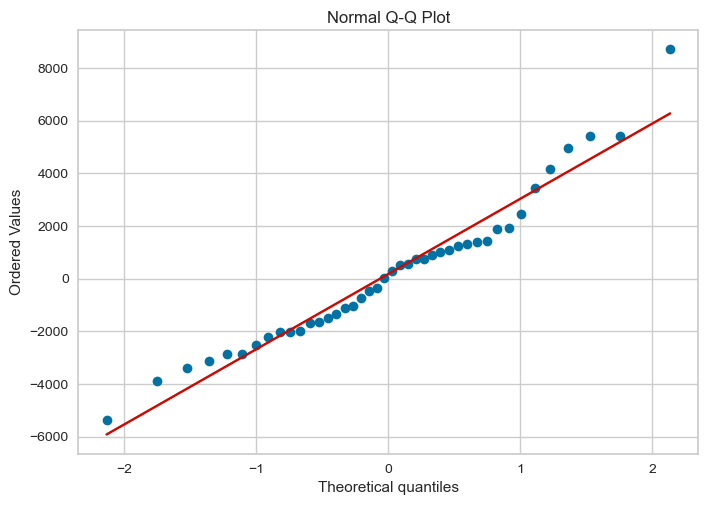


Actual vs Predicted:


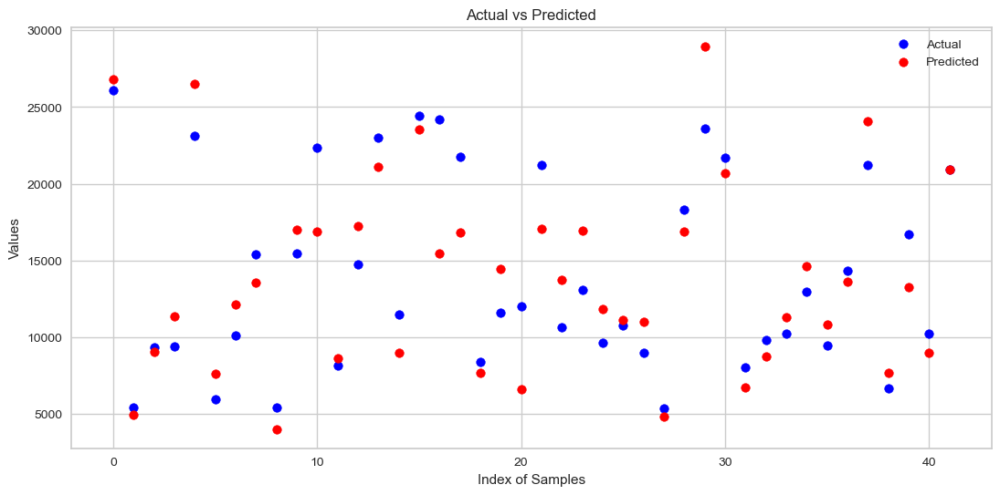

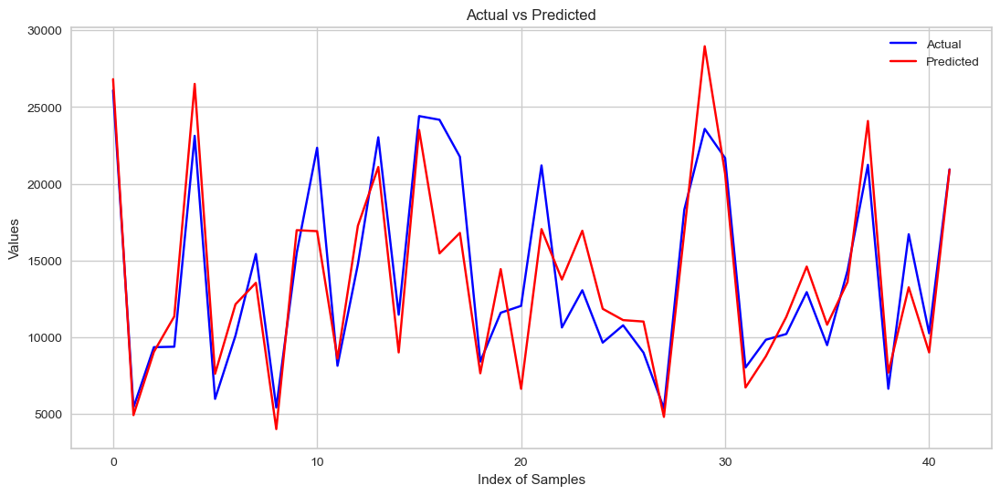

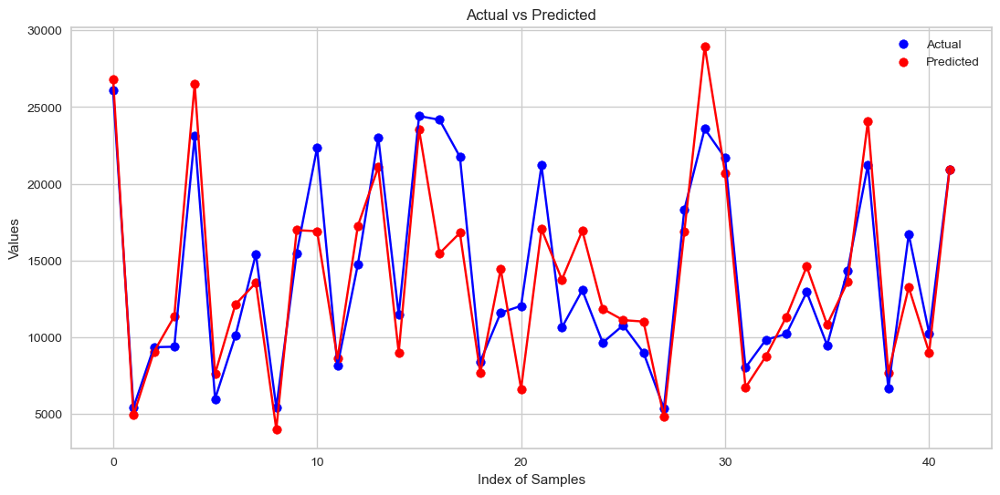


Residuals Scatter Plot:


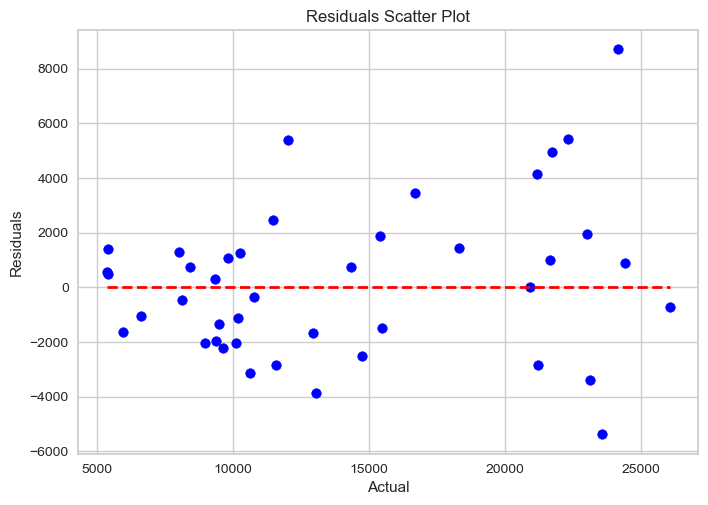


Residuals Histogram:


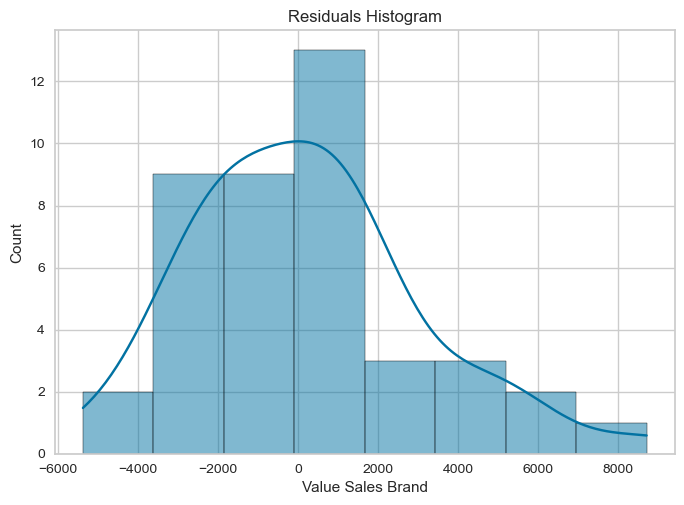

In [477]:
# Assuming dframe1 is your dataframe
X4_copy = X3_copy
y4_copy = y3_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X4_copy, y4_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     46.18
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           5.74e-55
Time:                        00:27:52   Log-Likelihood:                -1509.5
No. Observations:                 166   AIC:                             3069.
Df Residuals:                     141   BIC:                             3147.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

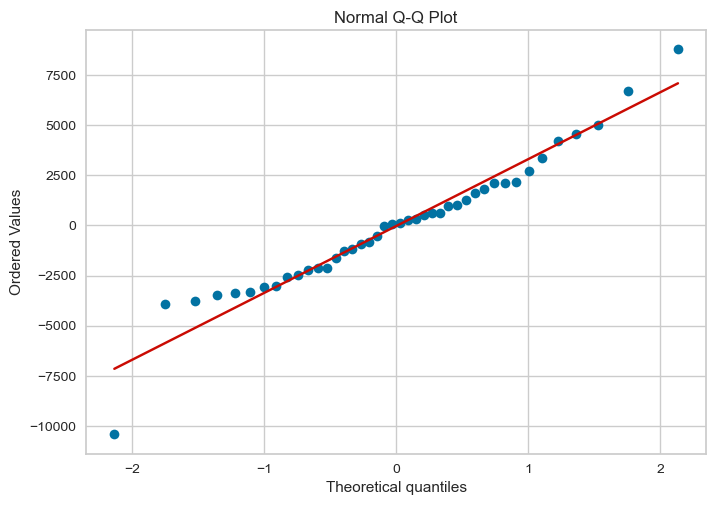


Actual vs Predicted:


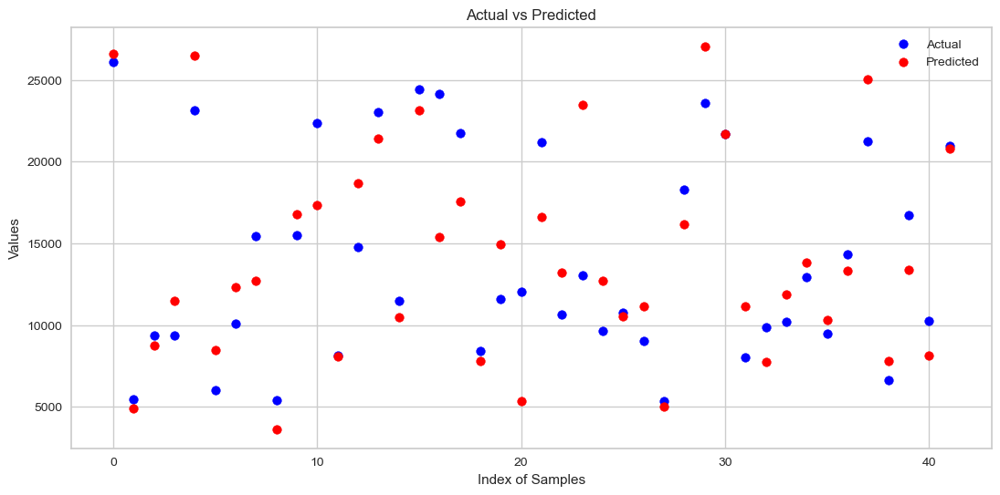

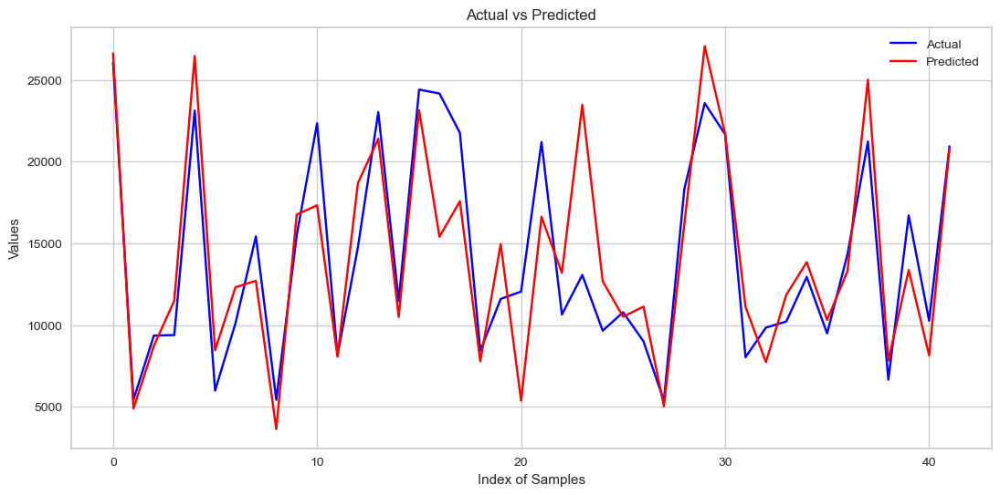

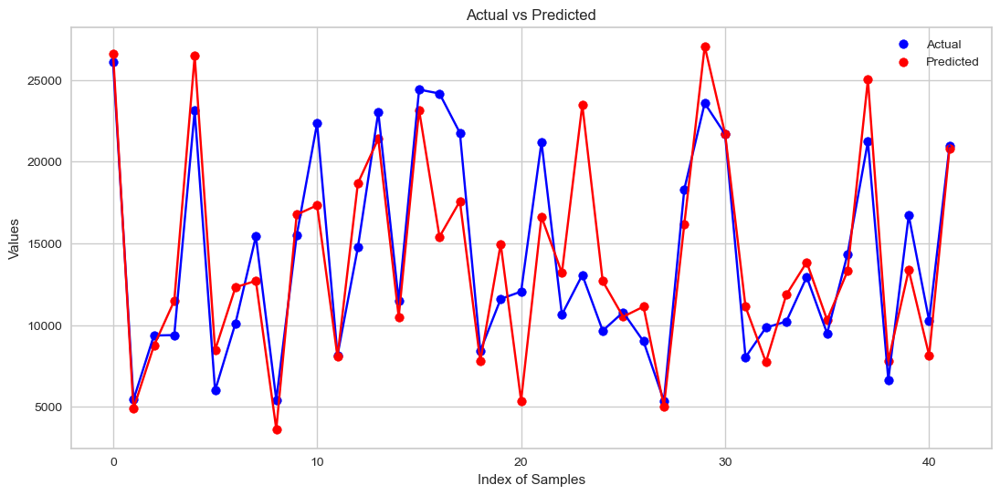


Residuals Scatter Plot:


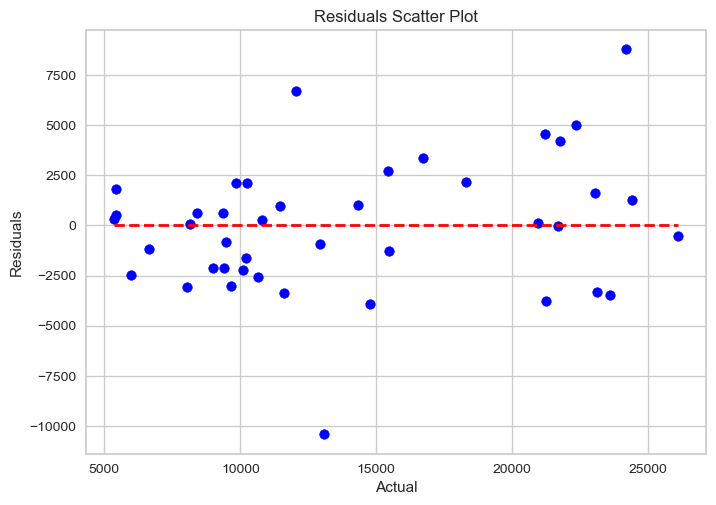


Residuals Histogram:


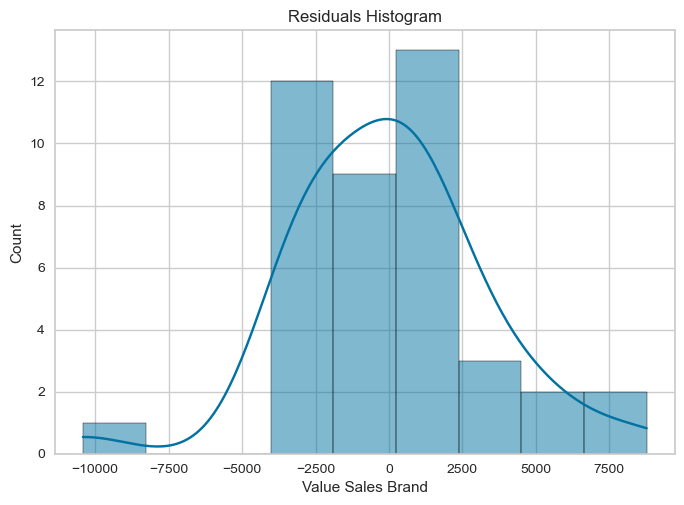

In [478]:
# Assuming dframe1 is your dataframe
X5_copy = X4_copy.drop(['Twitch TV',
 'Twitch Influencer TikTok',
 'Twitch Influencer Instagram',
 'Twitch TikTok TV',
 'TikTok Influencer TikTok',
 'TikTok Influencer Instagram',
 'Influencer TikTok TV',
 'Influencer TikTok Instagram',
 'Influencer Instagram TV',
 'YouTube Twitch',
 'YouTube Influencer TikTok',
 'YouTube Influencer Instagram',
 'YouTube Meta',
 'YouTube OVP',
 'YouTube Google',
 'YouTube Amazon',
 'Meta TV',
 'Meta Twitch',
 'Meta Influencer TikTok',
 'Meta Influencer Instagram',
 'OVP TV',
 'OVP Twitch',
 'OVP TikTok',
 'OVP Influencer TikTok',
 'OVP Influencer Instagram',
 'OVP Meta',
 'OVP Google',
 'OVP Amazon',
 'Google Twitch',
 'Google TikTok',
 'Google Influencer TikTok',
 'Google Influencer Instagram',
 'Amazon Twitch',
 'Amazon Influencer Instagram'],axis = 1)
y5_copy = y4_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X5_copy, y5_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)

                            OLS Regression Results                            
Dep. Variable:      Value Sales Brand   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     50.51
Date:                Sun, 15 Sep 2024   Prob (F-statistic):           8.69e-56
Time:                        00:27:53   Log-Likelihood:                -1514.3
No. Observations:                 166   AIC:                             3073.
Df Residuals:                     144   BIC:                             3141.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

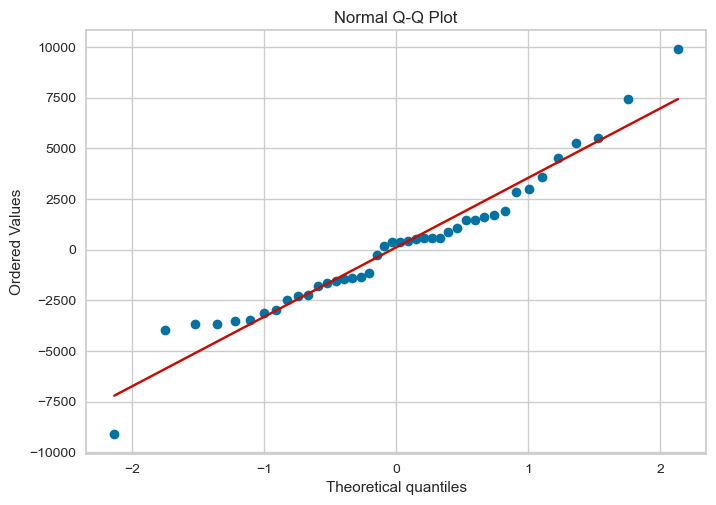


Actual vs Predicted:


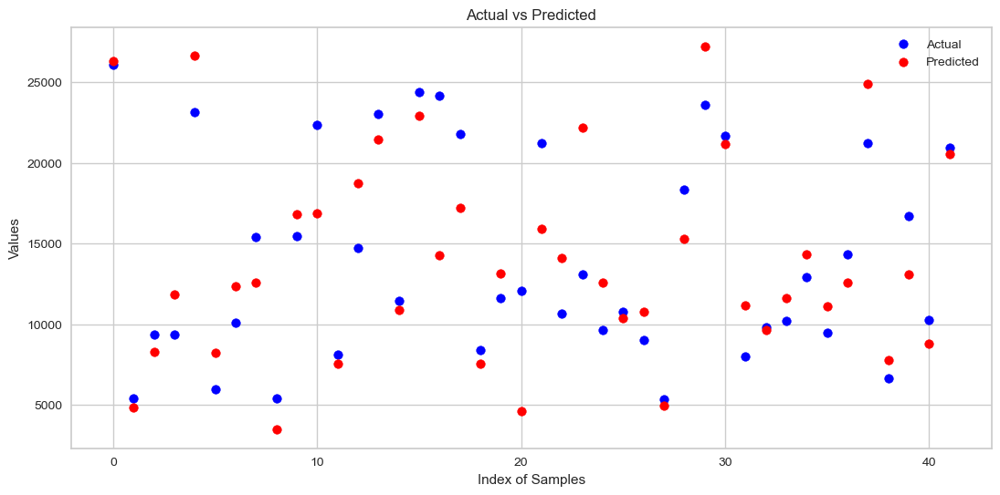

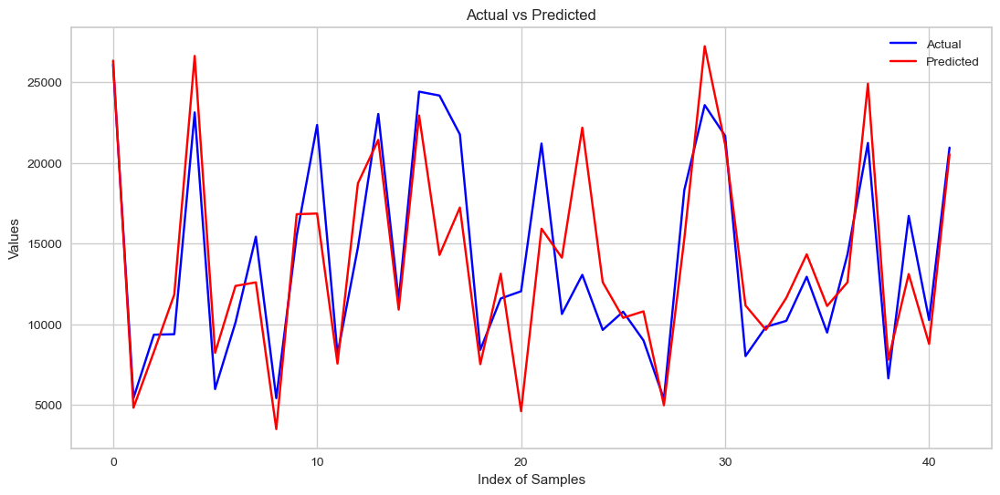

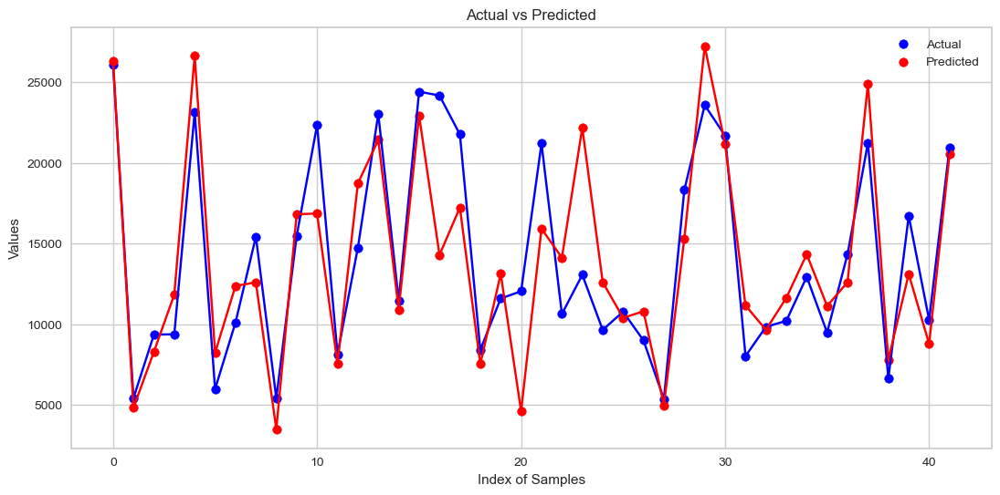


Residuals Scatter Plot:


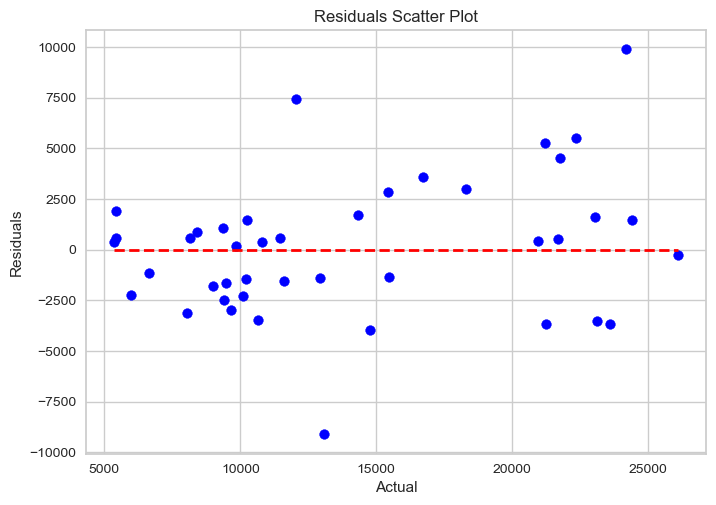


Residuals Histogram:


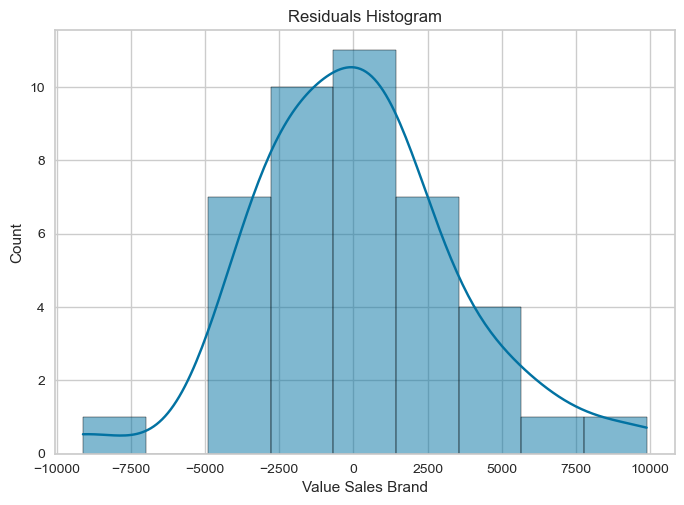

In [479]:
# Assuming dframe1 is your dataframe
X6_copy = X5_copy.drop(['NUMBER OF INFLUENCERS INVOLVED_log_lag_halo', 'promo_log_lag_halo', 'Negative Opinions'],axis = 1)
y6_copy = y5_copy

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X6_copy, y6_copy, test_size=0.2, random_state=42)

# Perform regression
model, y_pred = perform_regression(X_train, X_test, y_train, model_type='BayesianRidge', simple=True)

# Perform residual analysis and plot graphs
analysis_of_residuals(y_test, y_pred)